In [2]:
from __future__ import print_function
from matplotlib import pyplot as plt
plt.switch_backend('agg')
%matplotlib inline
import numpy as np
#import pandas as pd

from IPython.display import display, HTML
import tensorflow as tf
#import numpy as np
#import pandas as pd
#import random as ran
import h5py

import pandas as pd


In [5]:
def Overlap_calc(hp,sp,psd):
    f_low = 30
    m, i = match(hp, sp, psd=psd, low_frequency_cutoff=f_low)
    o = overlap(hp, sp, psd=psd, low_frequency_cutoff=f_low)
    return m


In [6]:
def _preprocess_data(data, num, samples):
    new_array = []
    for i in range(num):
        dataset = data[i]
        if((dataset.max() != 0.0) and (dataset.min() != 0.0)):
            maximum = np.max(dataset)
            minimum = np.abs(np.min(dataset))
            for j in range(samples):
                if(dataset[j] > 0):
                    dataset[j] = dataset[j]/maximum
                else:
                    dataset[j] = dataset[j]/minimum
        new_array.append(dataset)
    return new_array, maximum, minimum


In [7]:
# Split a univariate sequence into samples
#def split_sequence(sequence_noisy,sequence_pure,n_steps):
def split_sequence(sequence_noisy,n_steps):
    X = [] 
#    y = []
    for i in range(len(sequence_noisy)):
    # find the end of this pattern
        end_ix = i + n_steps
        # check if we are beyond the sequence
        if end_ix > len(sequence_noisy)-1:
            break
        # gather input and output parts of the pattern
        seq_x = sequence_noisy[i:end_ix] 
#        seq_y = sequence_pure[end_ix]
        X.append(seq_x)
#        y.append(seq_y)
#    return array(X), array(y)
    return np.array(X)
    
    
#def reshape_sequences(self, num, data_noisy, data_pure):
def reshape_sequences(num, data_noisy):
    n_steps = 10
    arr_noisy = []
#    arr_pure = []
        
    for i in range(num):
        X_noisy = data_noisy[i]
#        X_pure = data_pure[i]
        X_noisy = np.pad(X_noisy, (n_steps, n_steps), 'constant', constant_values=(0, 0))
#        X_pure = np.pad(X_pure, (n_steps, n_steps), 'constant', constant_values=(0, 0))
        # split into samples
#        X, y = self.split_sequence(X_noisy, X_pure, n_steps)
        X = split_sequence(X_noisy, n_steps)
        arr_noisy.append(X)
#        arr_pure.append(y)
    
    arr_noisy = np.asarray(arr_noisy)
#    arr_pure = np.asarray(arr_pure)
        
#    return arr_noisy, arr_pure
    return arr_noisy


In [8]:
class FractalTanimotoLoss(tf.keras.losses.Loss):
        def __init__(lr, base_lr=2e-3, depth=0, smooth=1e-6, **kwargs):
            depth = depth
            learning_rate = lr
            base_lr = base_lr
            smooth = smooth
            super().__init__(**kwargs)
    
        def inner_prod(self, y, x):
            prod = y*x
            prod = K.sum(prod, axis=1)
        
            return prod
    
        def tnmt_base(x, y, scale):

            tpl  = inner_prod(y,x)
            tpp  = inner_prod(y,y)
            tll  = inner_prod(x,x)


            num = tpl + self.smooth
            denum = 0.0
            result = 0.0
            for d in range(depth):
                a = 2.**d
                b = -(2.*a-1.)

                denum = denum + tf.math.reciprocal( a*(tpp+tll) + b *tpl + smooth)
                
            result =  num * denum * scale
            
            return  result*scale
        
        def call(y_true, y_pred):
            
            if(learning_rate < base_lr):
                depth = depth + 5
                
            depth = depth+1
            scale = 1./len(range(depth))
            
            l1 = K.mean(K.square(y_pred - y_true),axis=-1)
            result = tnmt_base(y_true, y_pred, scale)
        
            return  l1 - 0.01*result
        
        def get_config(self):
            base_config = super().get_config()
            return {**base_config, "depth": depth}   
    

In [9]:
class TimeDistributedMultiHeadAttention(tf.keras.layers.Layer):
        def __init__(self, num_heads, key_dim, **kwargs):
            super().__init__(**kwargs)
            self.num_heads = num_heads
            self.key_dim = key_dim
            self.multi_head_attention = tf.keras.layers.MultiHeadAttention(num_heads=num_heads, key_dim=key_dim)

        def call(self, inputs):
            # Use tf.shape for dynamic shape and inputs.shape for static shape
            shape = tf.shape(inputs)
            static_shape = inputs.shape
            batch_size, num_subsequences, subsequence_length = shape[0], static_shape[1], static_shape[2]
            features = static_shape[3]

            reshaped_inputs = tf.reshape(inputs, [-1, subsequence_length, features])

            # Apply multi-head attention to each subsequence individually
            attention_output = self.multi_head_attention(reshaped_inputs, reshaped_inputs)

            # Reshape the output back to the original input shape
            output_shape = [-1, num_subsequences, subsequence_length, features]
            return tf.reshape(attention_output, output_shape)

        def compute_output_shape(self, input_shape):
            return input_shape
        
        def get_config(self):
            config = super().get_config()
            config.update({
                'num_heads': self.num_heads,
                'key_dim': self.key_dim
            })
            return config


In [47]:
import h5py
from matplotlib import pyplot as plt

f1 = h5py.File('/fred/oz016/Chayan/samplegen_old/output/O3b_GW190412_test_IMRPhenomXPHM_comparison.hdf', 'r')

l1_strain_IMRPhenomXPHM = f1['injection_samples']['l1_strain'][()]
l1_signal_IMRPhenomXPHM = f1['injection_parameters']['l1_signal_whitened'][()]

f2 = h5py.File('/fred/oz016/Chayan/samplegen_old/output/O3b_GW190412_test_SEOBNRv4PHM_comparison.hdf', 'r')

l1_strain_SEOBNRv4HM = f2['injection_samples']['l1_strain'][()]
l1_signal_SEOBNRv4HM = f2['injection_parameters']['l1_signal_whitened'][()]

f3 = h5py.File('/fred/oz016/Chayan/samplegen_old/output/O3b_GW190412_test_NRHybSur3dq8_comparison.hdf', 'r')

l1_strain_NRHybSur3dq8 = f3['injection_samples']['l1_strain'][()]
l1_signal_NRHybSur3dq8 = f3['injection_parameters']['l1_signal_whitened'][()]

In [48]:
f3['injection_parameters']['l1_snr'][()]*f3['injection_parameters']['scale_factor'][()]

array([29.22571102])

In [49]:
strain = np.concatenate([l1_strain_IMRPhenomXPHM, l1_strain_SEOBNRv4HM[:,::2], l1_strain_NRHybSur3dq8], axis=0)
signal = np.concatenate([l1_signal_IMRPhenomXPHM, l1_signal_SEOBNRv4HM[:,::2], l1_signal_NRHybSur3dq8], axis=0)


In [50]:
strain, maximum, minimum = _preprocess_data(strain, strain.shape[0], 2048)
strain = np.array(strain)
strain.shape


(3, 2048)

In [51]:
X_test_strain = reshape_sequences(strain.shape[0], strain)
X_test_pure_signal = reshape_sequences(signal.shape[0], signal)


In [52]:
# Reshape arrays to fit into Keras model
X_test_strain = X_test_strain[:,:,:,None]
print('x_test_strain shape:', X_test_strain.shape)
X_test_strain = X_test_strain.astype("float32")

X_test_pure_signal = X_test_pure_signal[:,:,:,None]
print('x_test_pure_signal shape:', X_test_pure_signal.shape)
X_test_pure_signal = X_test_pure_signal.astype("float32")


x_test_strain shape: (3, 2058, 10, 1)
x_test_pure_signal shape: (3, 2058, 10, 1)


In [14]:
class NegativeLogLikelihood:
    def __call__(self, y, rv_y):
        return -rv_y.log_prob(y)

In [15]:
import tensorflow_probability as tfp

negloglik = NegativeLogLikelihood()

model = tf.keras.models.load_model('/fred/oz016/Chayan/GW-Denoiser/model/model_IMRPhenomXPHM_O3b_noise_15_timesteps_uncertainty_amplitudes_scaled_100.h5', custom_objects={'TimeDistributedMultiHeadAttention': TimeDistributedMultiHeadAttention, 'IndependentNormal': tfp.layers.IndependentNormal,'negloglik': negloglik})

#model = tf.keras.models.load_model('/fred/oz016/Chayan/GW-Denoiser/model/model_IMRPhenomXPHM_DeepClean_10_timesteps_uncertainty_amplitudes_scaled_100_1.h5', custom_objects={'TimeDistributedMultiHeadAttention': TimeDistributedMultiHeadAttention, 'IndependentNormal': tfp.layers.IndependentNormal,'negloglik': negloglik})


In [55]:
distribution = model(X_test_strain)
    
# Extract mean and standard deviation from the distribution
mean_preds = distribution.mean()
std_preds = distribution.stddev()
 
mean_preds = mean_preds.numpy().squeeze()
std_preds = std_preds.numpy().squeeze()

# Calculate the upper and lower bounds of the 2-standard deviation interval
lower_bound_90 = mean_preds - 1.645 * std_preds
upper_bound_90 = mean_preds + 1.645 * std_preds

lower_bound_50 = mean_preds - 0.6745 * std_preds
upper_bound_50 = mean_preds + 0.6745 * std_preds

In [56]:
mean_preds = mean_preds[:,0:2048]

lower_bound_50 = lower_bound_50[:,0:2048]
upper_bound_50 = upper_bound_50[:,0:2048]

lower_bound_90 = lower_bound_90[:,0:2048]
upper_bound_90 = upper_bound_90[:,0:2048]

# IMRPhenomXPHM

NameError: name 'lower_bound' is not defined

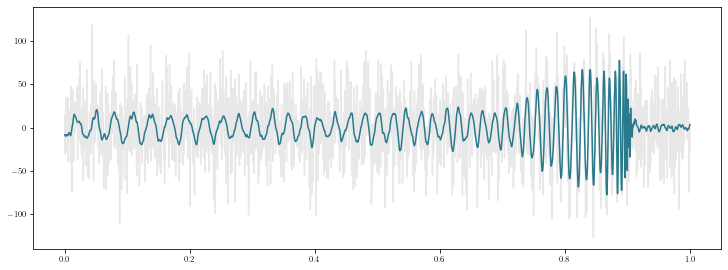

In [17]:
import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)
import seaborn as sns

palette_flare = sns.color_palette("flare", n_colors=6)
palette_rocket = sns.color_palette("rocket", n_colors=6)
palette_crest = sns.color_palette("crest", n_colors=6)

fig = plt.figure(figsize=(10,7))
    
# Plot for decoded signals and pure_signals_cwb
signal_axes = fig.add_subplot(211)

time = np.linspace(0.0, 1.0, mean_preds.shape[1])

signal_axes.plot(time, l1_strain_IMRPhenomXPHM[0], label='Whitened strain', color='lightgrey', alpha=0.5)
signal_axes.plot(time, signal[0], label='IMRPhenomXPHM injection', color=palette_crest[3])
#signal_axes.plot(time, mean_preds[0]*100.0, label='\\texttt{AWaRe} reconstruction', color=palette_flare[1], linestyle='dashed')
#plt.plot(time, mean_preds[1], label='\\texttt{AWaRe} SEOBNRv4PHM', color='red')
#plt.plot(time, mean_preds[2], label='\\texttt{AWaRe} NRHybSur3dq8', color='red')

signal_axes.fill_between(time,lower_bound[0]*100.0,upper_bound[0]*100.0, color=palette_flare[1], label='\\texttt{AWaRe} 90\% C.I.')
    
signal_axes.set_ylabel('Rescaled amplitudes', fontsize=15)
signal_axes.set_xlabel('Time (in secs)', fontsize=15)
signal_axes.tick_params(axis='y', labelsize=15)
signal_axes.tick_params(axis='x', labelsize=15)
signal_axes.legend(loc='lower left', fontsize=12)

plt.savefig('Paper_plots_uncertainty/GW190412_IMRPhenomXPHM_1.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)


# SEOBNRv4PHM

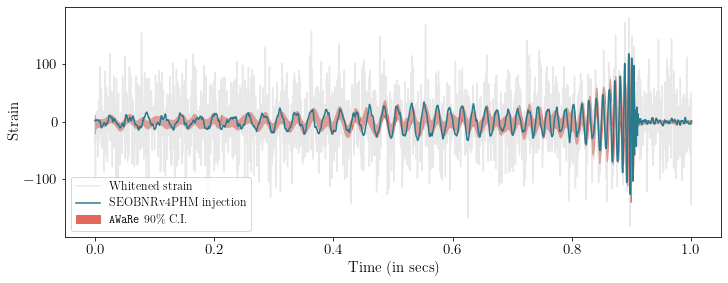

In [52]:
import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)

fig = plt.figure(figsize=(10,7))
    
# Plot for decoded signals and pure_signals_cwb
signal_axes = fig.add_subplot(211)

time = np.linspace(0.0, 1.0, mean_preds.shape[1])

signal_axes.plot(time, l1_strain_SEOBNRv4HM[0][::2], label='Whitened strain', color='lightgrey', alpha=0.5)
signal_axes.plot(time, signal[1], label='SEOBNRv4PHM injection', color=palette_crest[3])
#signal_axes.plot(time, mean_preds[1]*100.0, label='\\texttt{AWaRe} reconstruction', color=palette_flare[1])

#plt.plot(time, mean_preds[1], label='\\texttt{AWaRe} SEOBNRv4PHM', color='red')
#plt.plot(time, mean_preds[2], label='\\texttt{AWaRe} NRHybSur3dq8', color='red')

signal_axes.fill_between(time,lower_bound[1]*100.0,upper_bound[1]*100.0, color=palette_flare[1], label='\\texttt{AWaRe} 90\% C.I.')
    
signal_axes.set_ylabel('Strain', fontsize=15)
signal_axes.set_xlabel('Time (in secs)', fontsize=15)
signal_axes.tick_params(axis='y', labelsize=15)
signal_axes.tick_params(axis='x', labelsize=15)
signal_axes.legend(loc='lower left', fontsize=12)

plt.savefig('Paper_plots_uncertainty/GW190412_SEOBNRv4PHM.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)



# NRHybSur3dq8

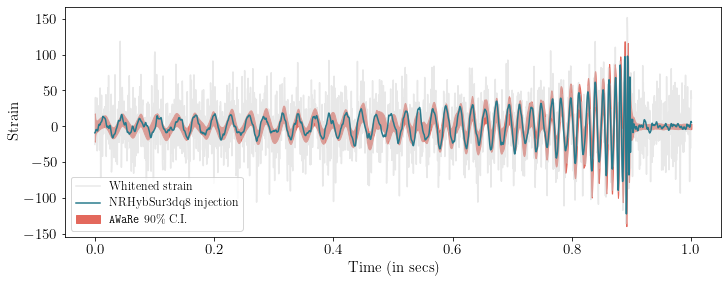

In [53]:
import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)

fig = plt.figure(figsize=(10,7))
    
# Plot for decoded signals and pure_signals_cwb
signal_axes = fig.add_subplot(211)

time = np.linspace(0.0, 1.0, mean_preds.shape[1])

signal_axes.plot(time, l1_strain_NRHybSur3dq8[0], label='Whitened strain', color='lightgrey', alpha=0.5)
signal_axes.plot(time, signal[2], label='NRHybSur3dq8 injection', color=palette_crest[3])
#signal_axes.plot(time, mean_preds[2]*100.0, label='\\texttt{AWaRe} reconstruction', color=palette_flare[1])

#plt.plot(time, mean_preds[1], label='\\texttt{AWaRe} SEOBNRv4PHM', color='red')
#plt.plot(time, mean_preds[2], label='\\texttt{AWaRe} NRHybSur3dq8', color='red')

signal_axes.fill_between(time,lower_bound[2]*100.0,upper_bound[2]*100.0, color=palette_flare[1], label='\\texttt{AWaRe} 90\% C.I.')
    
signal_axes.set_ylabel('Strain', fontsize=15)
signal_axes.set_xlabel('Time (in secs)', fontsize=15)
signal_axes.tick_params(axis='y', labelsize=15)
signal_axes.tick_params(axis='x', labelsize=15)
signal_axes.legend(loc='lower left', fontsize=12)

plt.savefig('Paper_plots_uncertainty/GW190412_NRHybSur3dq8.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)


<ipython-input-57-b778f6663207>:73: UserWarning: The figure layout has changed to tight
  fig.tight_layout()  # Adjust layout to prevent overlap and clipping


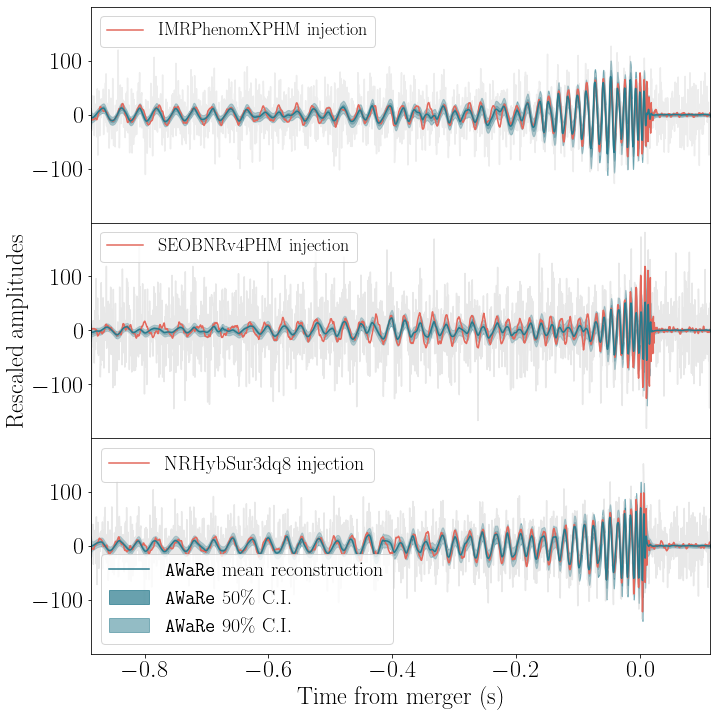

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib_latex_bridge import setup_page, formats

# Setup the page format using matplotlib_latex_bridge
setup_page(**formats.article_letterpaper_10pt_singlecolumn)

import seaborn as sns

palette_flare = sns.color_palette("flare", n_colors=6)
palette_rocket = sns.color_palette("rocket", n_colors=6)
palette_crest = sns.color_palette("crest", n_colors=6)

max_index = np.argmax(signal[0])
start_time = -max_index / 2048.0
end_time = 1.0 - max_index / 2048.0

time = np.linspace(start_time, end_time, len(signal[0]))

# Create a figure with subplots sharing both x and y axes
fig, axs = plt.subplots(3, 1, figsize=(10, 10), sharex=True, sharey=True, gridspec_kw={'hspace': 0})  # No space between plots

# Plot for IMRPhenomXPHM injection
axs[0].plot(time, l1_strain_IMRPhenomXPHM[0], color='lightgrey', label='Whitened strain', alpha=0.4)
axs[0].plot(time, signal[0], label='IMRPhenomXPHM injection', color=palette_flare[1])
axs[0].plot(time, mean_preds[0] * 100.0, color=palette_crest[3])
axs[0].fill_between(time, lower_bound_50[0] * 100.0, upper_bound_50[0] * 100.0, color=palette_crest[3], alpha=0.7)
axs[0].fill_between(time, lower_bound_90[0] * 100.0, upper_bound_90[0] * 100.0, color=palette_crest[3], alpha=0.5)

# Plot for SEOBNRv4PHM injection
axs[1].plot(time, l1_strain_SEOBNRv4HM[0][::2], color='lightgrey', label='Whitened strain', alpha=0.5)
axs[1].plot(time, signal[1], label='SEOBNRv4PHM injection', color=palette_flare[1])
axs[1].plot(time, mean_preds[1] * 100.0, color=palette_crest[3])
axs[1].fill_between(time, lower_bound_50[1] * 100.0, upper_bound_50[1] * 100.0, color=palette_crest[3], alpha=0.7)
axs[1].fill_between(time, lower_bound_90[1] * 100.0, upper_bound_90[1] * 100.0, color=palette_crest[3], alpha=0.5)

# Plot for NRHybSur3dq8 injection
axs[2].plot(time, l1_strain_NRHybSur3dq8[0], color='lightgrey', alpha=0.5)
line1, = axs[2].plot(time, signal[2], label='NRHybSur3dq8 injection', color=palette_flare[1])
line2, = axs[2].plot(time, mean_preds[2] * 100.0, label='\\texttt{AWaRe} mean reconstruction', color=palette_crest[3])
axs[2].fill_between(time, lower_bound_50[2] * 100.0, upper_bound_50[2] * 100.0, color=palette_crest[3], alpha=0.7, label='\\texttt{AWaRe} 50\% C.I.')
axs[2].fill_between(time, lower_bound_90[2] * 100.0, upper_bound_90[2] * 100.0, color=palette_crest[3], alpha=0.5, label='\\texttt{AWaRe} 90\% C.I.')

# Adding legends and labels
for i, ax in enumerate(axs):
    handles, labels = ax.get_legend_handles_labels()
    # Show only the injection label in the upper left for all panels
    injection_label = [(h, l) for h, l in zip(handles, labels) if 'injection' in l]
    ax.legend(*zip(*injection_label), loc='upper left', fontsize=18)

# Add the legend manually to the current Axes for the bottom panel
handles, labels = axs[2].get_legend_handles_labels()
aware_labels = [(h, l) for h, l in zip(handles, labels) if '\\texttt{AWaRe}' in l]
first_legend = axs[2].legend(handles=[line1], loc='upper left', fontsize=20)
axs[2].add_artist(first_legend)

if aware_labels:
    axs[2].legend(*zip(*aware_labels), loc='lower left', fontsize=20)

# Set limits for the x-axis
axs[0].set_xlim(time[0], time[-1])
axs[1].set_xlim(time[0], time[-1])
axs[2].set_xlim(time[0], time[-1])

# Set labels and tick parameters
axs[1].set_ylabel('Rescaled amplitudes', fontsize=24)
axs[2].set_xlabel('Time from merger (s)', fontsize=24)
axs[0].tick_params(axis='y', labelsize=24)
axs[1].tick_params(axis='y', labelsize=24)
axs[2].tick_params(axis='y', labelsize=24)
axs[2].tick_params(axis='x', labelsize=24)

fig.tight_layout()  # Adjust layout to prevent overlap and clipping

# Uncomment the following line to save the plot
plt.savefig('Paper_plots_uncertainty/GW190412_tests_combined_1.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)


In [22]:
f1 = h5py.File('/fred/oz016/Chayan/GW-Denoiser/notebooks/Paper_plots_uncertainty/Injection_test_GW190412.hdf', 'w')
f1.create_dataset('Mean_preds', data=mean_preds)
f1.create_dataset('Std_preds', data=std_preds)

f1.close()

In [14]:
import h5py

f1 = h5py.File('/fred/oz016/Chayan/GW-Denoiser/notebooks/Paper_plots_uncertainty/Injection_test_GW190412.hdf', 'r')

mean_preds = f1['Mean_preds'][()]
std_preds = f1['Std_preds'][()]

lower_bound = mean_preds - 2 * std_preds[:,0:2048]
upper_bound = mean_preds + 2 * std_preds[:,0:2048]

f1.close()

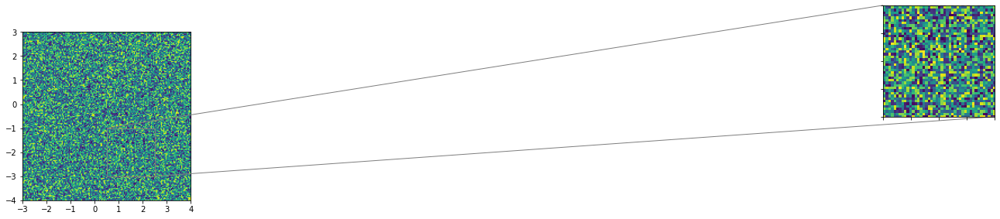

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# Generate random data for demonstration
np.random.seed(0)  # For reproducibility
Z = np.random.rand(150, 150)

fig, ax = plt.subplots()

# Display the main image
ax.imshow(Z, extent=[-3, 4, -4, 3], origin="lower", cmap='viridis')

# Define the region of interest for zooming
x1, x2, y1, y2 = 0.5, 2.5, -3, -1

# Create an external axes for the zoomed region (outside the main plot)
ax_zoom = fig.add_axes([1.0, 0.5, 1.0, 0.5])  # Adjust these coordinates as needed
ax_zoom.imshow(Z, extent=[-3, 4, -4, 3], origin="lower", cmap='viridis')
ax_zoom.set_xlim(x1, x2)
ax_zoom.set_ylim(y1, y2)
ax_zoom.set_xticklabels([])
ax_zoom.set_yticklabels([])

# Draw lines connecting the main plot and the zoomed region
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
mark_inset(ax, ax_zoom, loc1=2, loc2=4, fc="none", ec="0.5")  # Adjust loc1 and loc2 as needed

plt.show()


# IMRPhenomXPHM convergence tests

In [9]:
import h5py

f1 = h5py.File('/fred/oz016/Chayan/samplegen_old/output/O3b_test_IMRPhenomXPHM_convergence_m1-200to250_m2-50to60_q_geq_4.hdf', 'r')

l1_strain = f1['injection_samples']['l1_strain'][()]
l1_signal = f1['injection_parameters']['l1_signal_whitened'][()]

l1_snr = f1['injection_parameters']['l1_snr'][()]*f1['injection_parameters']['scale_factor'][()]


(array([ 60., 152., 164., 114., 114., 107., 121.,  59.,  79.,  30.]),
 array([ 1.6922094 ,  5.13198947,  8.57176953, 12.0115496 , 15.45132967,
        18.89110973, 22.3308898 , 25.77066987, 29.21044993, 32.65023   ,
        36.09001007]),
 <BarContainer object of 10 artists>)

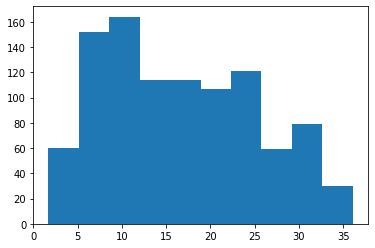

In [9]:
plt.hist((f1['injection_parameters']['l1_snr'][()]*f1['injection_parameters']['scale_factor'][()]))

In [11]:
l1_snr

array([29.18703446, 29.84758046, 29.88103702, 29.89055813, 29.34882386,
       30.17377586, 27.30488957, 30.38108854, 29.84904212, 29.41529361,
        5.44427735,  5.47718639,  5.4714292 ,  5.97314281,  6.14977213,
        5.58365308,  5.6177657 ,  5.42884664,  5.79426641,  5.67675696,
       25.47377841, 25.59516025, 25.4176937 , 27.33837265, 25.90194715,
       26.24257894, 25.65261259, 26.2453769 , 25.93607197, 25.97572976,
       29.13252186, 29.05857385, 29.33015459, 29.23665534, 28.90857717,
       29.18183001, 29.20787616, 29.23371695, 29.55508782, 28.92695186,
        6.41653796,  6.20782952,  6.22680412,  6.25560145,  6.39043467,
        6.18688346,  5.8712379 ,  6.43372121,  6.361475  ,  6.35800666,
       10.70172888, 10.22247685, 10.116936  , 10.28743605, 10.73433775,
       10.45449807, 10.46802914, 10.41940733, 10.55047773, 10.25566176,
       11.54810001, 11.4259388 , 11.50311826, 11.32832283, 11.33909071,
       11.24920186, 11.80547156, 11.7370546 , 11.87863305, 11.11

In [12]:
l1_strain_data = np.copy(l1_strain)

In [13]:
strain, maximum, minimum = _preprocess_data(l1_strain, l1_strain.shape[0], 2048)
strain = np.array(strain)
strain.shape


(1000, 2048)

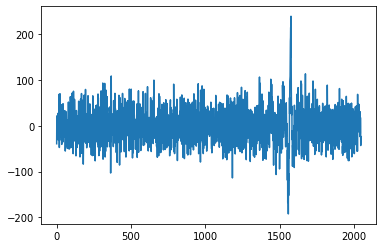

In [12]:
plt.plot(l1_strain_data[0])

In [14]:
X_test_strain = reshape_sequences(strain.shape[0], strain)
X_test_pure_signal = reshape_sequences(l1_signal.shape[0], l1_signal)


In [15]:
# Reshape arrays to fit into Keras model
X_test_strain = X_test_strain[:,:,:,None]
print('x_test_strain shape:', X_test_strain.shape)
X_test_strain = X_test_strain.astype("float32")

X_test_pure_signal = X_test_pure_signal[:,:,:,None]
print('x_test_pure_signal shape:', X_test_pure_signal.shape)
X_test_pure_signal = X_test_pure_signal.astype("float32")


x_test_strain shape: (1000, 2058, 10, 1)
x_test_pure_signal shape: (1000, 2058, 10, 1)


In [16]:
distribution = model(X_test_strain)
    
# Extract mean and standard deviation from the distribution
mean_preds = distribution.mean()
std_preds = distribution.stddev()
 
mean_preds = mean_preds.numpy().squeeze()
std_preds = std_preds.numpy().squeeze()

# Calculate the upper and lower bounds of the 2-standard deviation interval
lower_bound = mean_preds - 1.645 * std_preds
upper_bound = mean_preds + 1.645 * std_preds

In [17]:
mean_preds = mean_preds[:,0:2048]

lower_bound = lower_bound[:,0:2048]
upper_bound = upper_bound[:,0:2048]

In [25]:
import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)
from pycbc.filter import match, overlap
from pycbc.types.timeseries import TimeSeries, FrequencySeries
import seaborn as sns

def plot_samples(i, signal, strain_data, mean_signal, psd, mass1, mass2, snr, lower_bound, upper_bound, before, after):

    fig = plt.figure(figsize=(8,6))
    palette_flare = sns.color_palette("flare", n_colors=6)
    palette_viridis = sns.color_palette("viridis", n_colors=6)
    palette_crest = sns.color_palette("crest", n_colors=6)
    palette_set2 = sns.color_palette("Set2", 4)
    
    # Plot for decoded signals and pure_signals_cwb
    signal_axes = fig.add_subplot(211)

    time = np.linspace(0.0, 1.0, mean_preds.shape[1])

    time_buffer = 1
    sample_rate = 2048
    # Length of corresponding time series and frequency series
    tlen = int(sample_rate * time_buffer)
    flen = tlen // 2 + 1

    delta_f = 1.0 / time_buffer
    #    psd = aLIGOZeroDetHighPower(flen, delta_f, f_low)
    
    #    X_test_pure_cwb_ts = TimeSeries(pure_signals_cwb.squeeze(), delta_t = 1.0/1024)
    l1_signal_ts = TimeSeries(signal, delta_t = 1.0/2048)
    mean_signal_ts = TimeSeries(mean_signal, delta_t = 1.0/2048)
    psd = FrequencySeries(psd, delta_f=delta_f)

    #    X_test_pure_cwb_ts.resize(tlen)
    l1_signal_ts.resize(tlen)
    mean_signal_ts.resize(tlen)
    psd.resize(flen)

    mis_match = 1.0 - Overlap_calc(l1_signal_ts,mean_signal_ts,psd)

#    mass1 = f1['injection_parameters']['mass1'][i]
#    mass2 = f1['injection_parameters']['mass2'][i]
#    snr = l1_snr[i]

    max_index = np.argmax(signal)
    start_time =  -max_index/(sample_rate*1.0)
    end_time = time_buffer - max_index/(sample_rate*1.0)

    low_index = max(max_index - int(before*sample_rate),0)
    upper_index = min(max_index + int(after*sample_rate),sample_rate)

    time = np.linspace(start_time, end_time, len(signal))

    signal = signal[low_index:upper_index]
    strain_data = strain_data[low_index:upper_index]
    mean_signal = mean_signal[low_index:upper_index]
    time = time[low_index:upper_index]
    lower_bound = lower_bound[low_index:upper_index]
    upper_bound = upper_bound[low_index:upper_index]

    signal_axes.plot(time, strain_data, label='Whitened strain', color='lightgrey', alpha=0.5)
    signal_axes.plot(time, signal, label='Whitened injected waveform', color=palette_crest[3])
    signal_axes.plot(time, mean_signal, label='\\texttt{AWaRe} reconstruction', color=palette_flare[1], linestyle='dashed')

    #plt.plot(time, mean_preds[1], label='\\texttt{AWaRe} SEOBNRv4PHM', color='red')
    #plt.plot(time, mean_preds[2], label='\\texttt{AWaRe} NRHybSur3dq8', color='red')

    signal_axes.fill_between(time,lower_bound,upper_bound, color=palette_flare[0], label='\\texttt{AWaRe} 90\% C.I.')

#    signal_axes.set_title('Mass_1 = {mass1}, Mass_2 = {mass2}, SNR = {snr}, Mis-match = {mis_match}'.format(mass1=np.round(mass1,2),mass2=np.round(mass2,2),snr=np.round(snr,2),mis_match=np.round(mis_match,2)))    
    signal_axes.set_xlim(time[0], time[-1])
    signal_axes.set_ylabel('Rescaled amplitudes', fontsize=20)
    signal_axes.set_xlabel('Time from merger (s)', fontsize=20)
    signal_axes.tick_params(axis='y', labelsize=20)
    signal_axes.tick_params(axis='x', labelsize=20)
    signal_axes.set_ylim(-200,200)
#    signal_axes.legend(loc='lower left', fontsize=18)

    plt.savefig('Paper_plots_uncertainty/Test_plots_SNR-25-26/Plot_'+str(i)+'_8_6.svg', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)

#    return mis_match


In [46]:
l1_snr[20:30]

array([25.47377841, 25.59516025, 25.4176937 , 27.33837265, 25.90194715,
       26.24257894, 25.65261259, 26.2453769 , 25.93607197, 25.97572976])

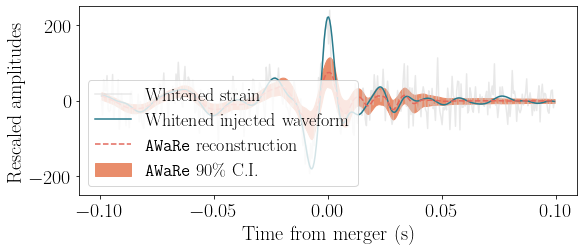

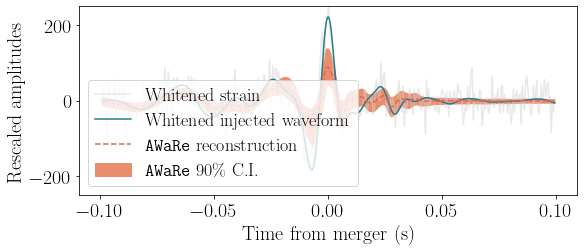

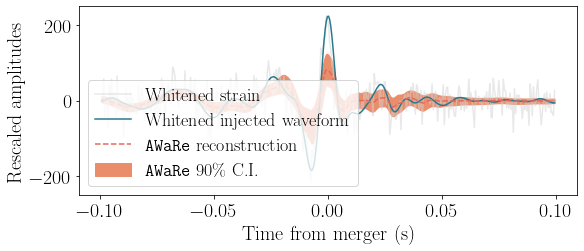

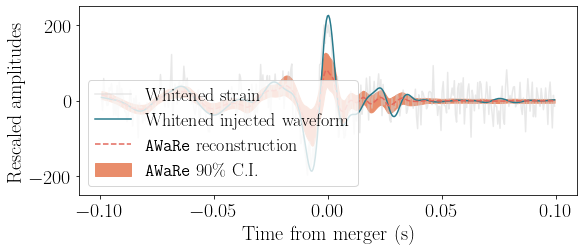

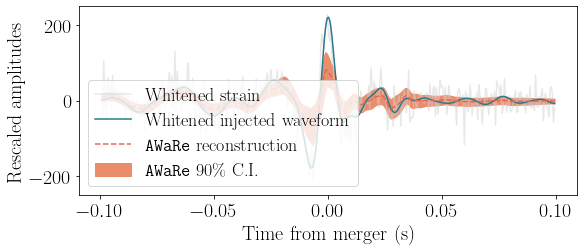

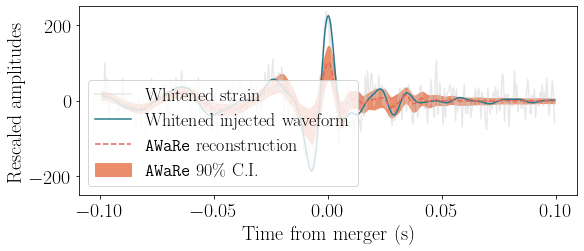

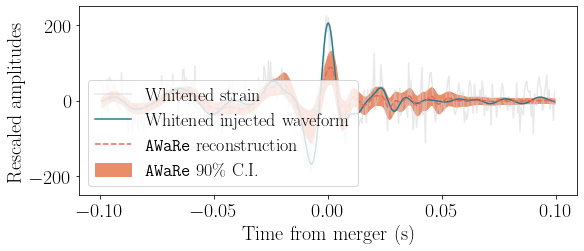

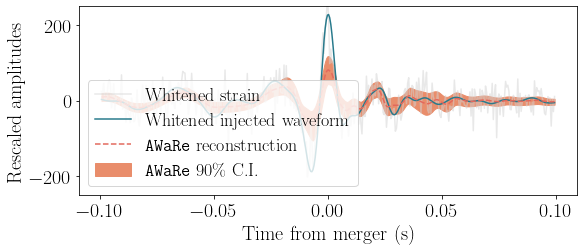

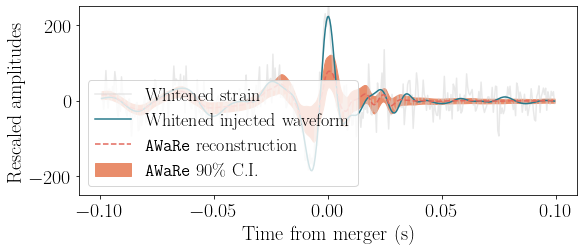

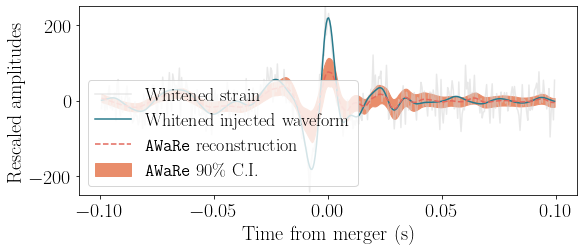

In [19]:
for i in range(10):

    mass1 = f1['injection_parameters']['mass1'][i]
    mass2 = f1['injection_parameters']['mass2'][i]
    strain_data = l1_strain_data[i]
    snr = l1_snr[i]
    psd = f1['injection_parameters']['psd_noise_l1'][i]
    signal = l1_signal[i]
    mean_signal = mean_preds[i]*100
    lower = lower_bound[i]*100
    upper = upper_bound[i]*100

    plot_samples(i, signal.astype('float64'), strain_data.astype('float64'), mean_signal.astype('float64'), psd.astype('float64'), mass1, mass2, snr, lower.astype('float64'), upper.astype('float64'),before=0.1,after=0.1)


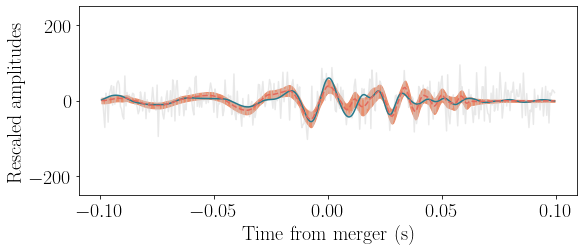

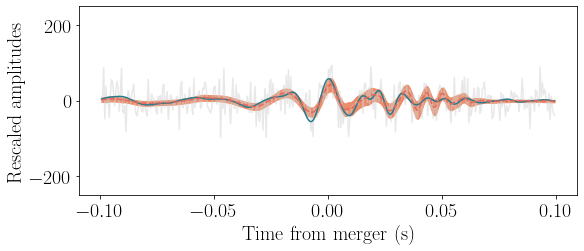

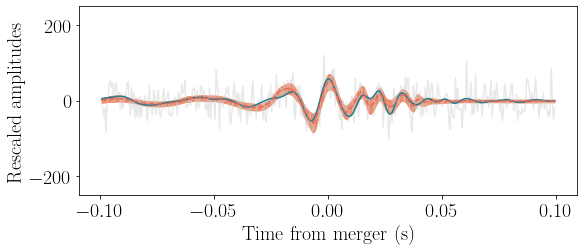

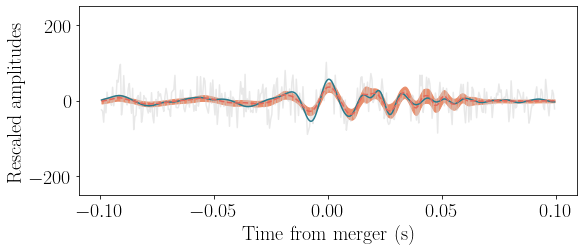

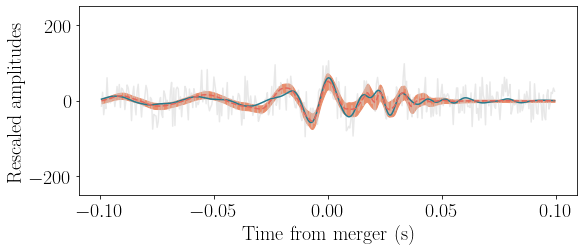

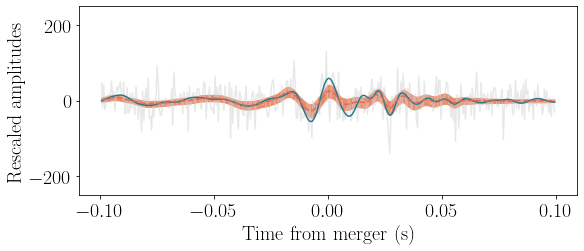

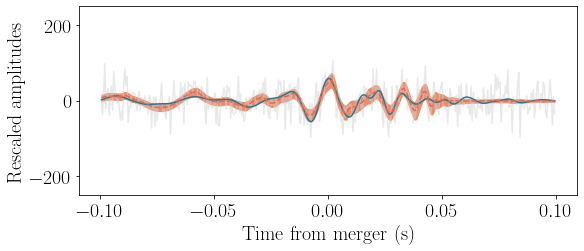

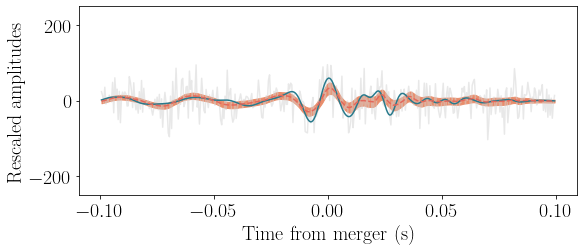

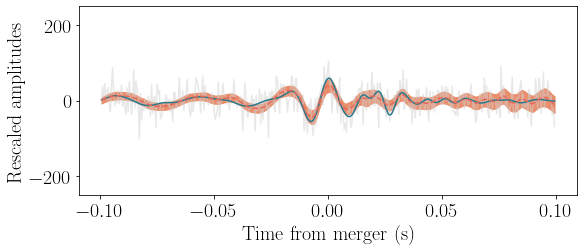

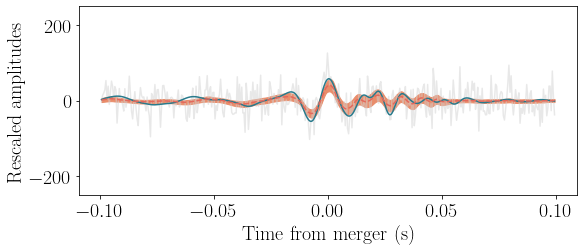

In [36]:
for i in range(50,60):

    mass1 = f1['injection_parameters']['mass1'][i]
    mass2 = f1['injection_parameters']['mass2'][i]
    strain_data = l1_strain_data[i]
    snr = l1_snr[i]
    psd = f1['injection_parameters']['psd_noise_l1'][i]
    signal = l1_signal[i]
    mean_signal = mean_preds[i]*100
    lower = lower_bound[i]*100
    upper = upper_bound[i]*100

    plot_samples(i, signal.astype('float64'), strain_data.astype('float64'), mean_signal.astype('float64'), psd.astype('float64'), mass1, mass2, snr, lower.astype('float64'), upper.astype('float64'),before=0.1,after=0.1)


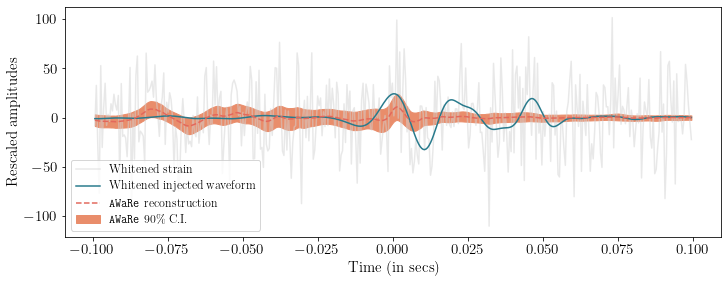

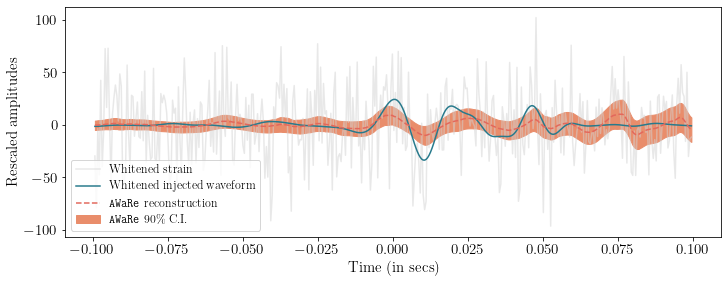

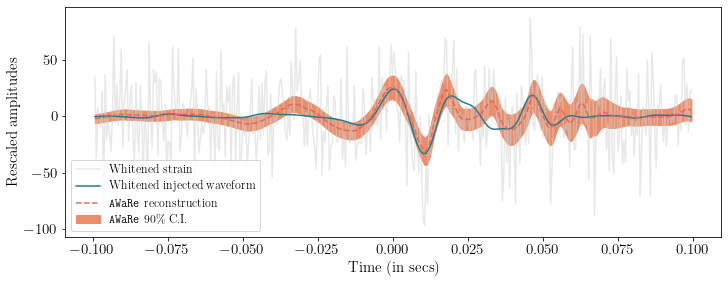

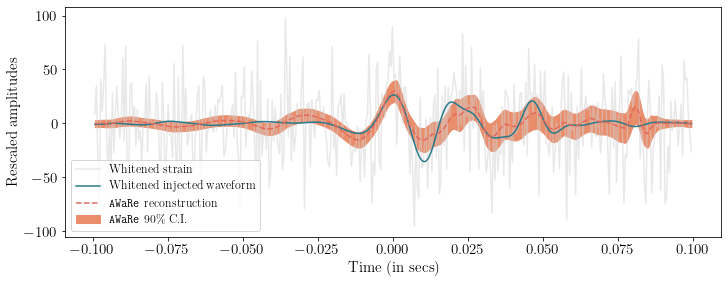

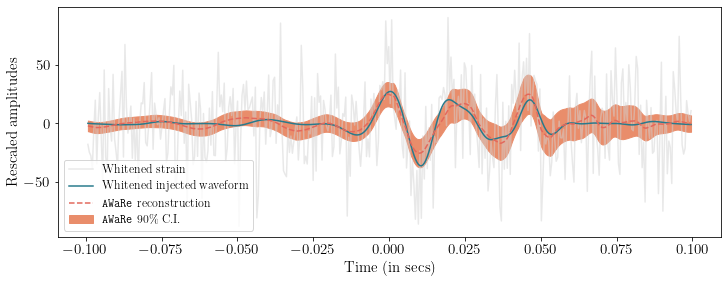

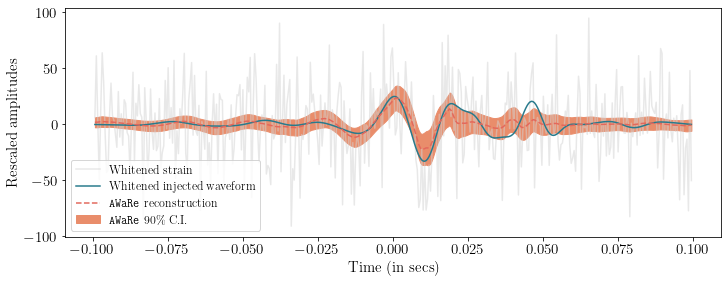

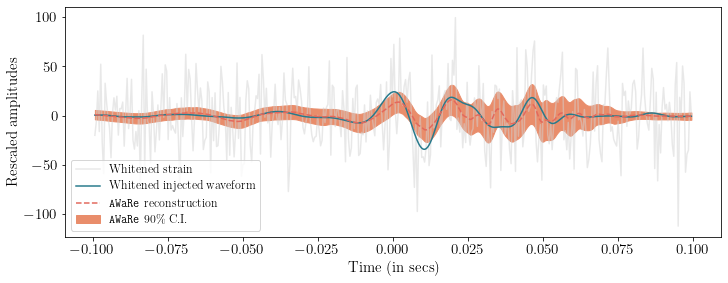

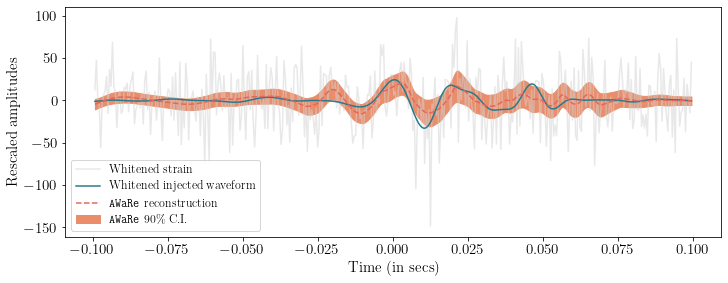

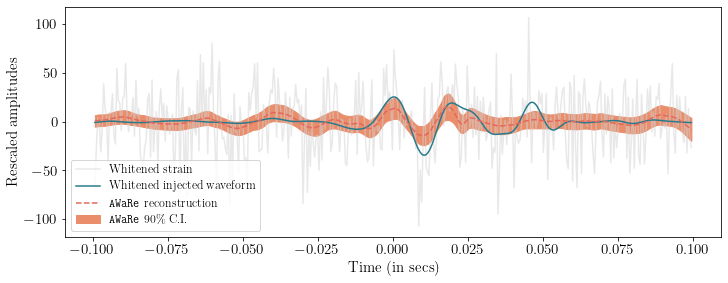

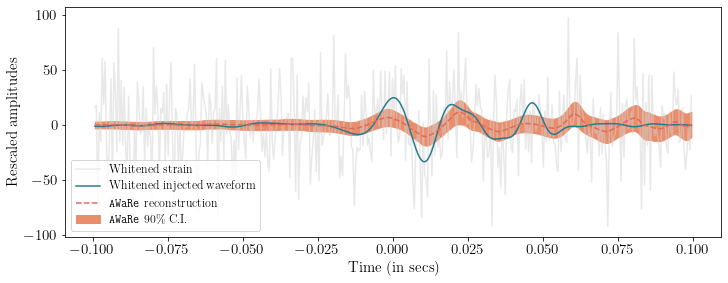

In [22]:
for i in range(10,20):

    mass1 = f1['injection_parameters']['mass1'][i]
    mass2 = f1['injection_parameters']['mass2'][i]
    strain_data = l1_strain_data[i]
    snr = l1_snr[i]
    psd = f1['injection_parameters']['psd_noise_l1'][i]
    signal = l1_signal[i]
    mean_signal = mean_preds[i]*100
    lower = lower_bound[i]*100
    upper = upper_bound[i]*100

    plot_samples(i, signal.astype('float64'), strain_data.astype('float64'), mean_signal.astype('float64'), psd.astype('float64'), mass1, mass2, snr, lower.astype('float64'), upper.astype('float64'), before=0.1, after=0.1)


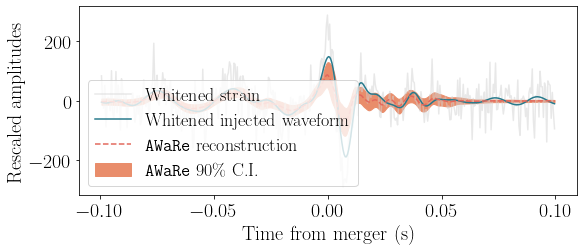

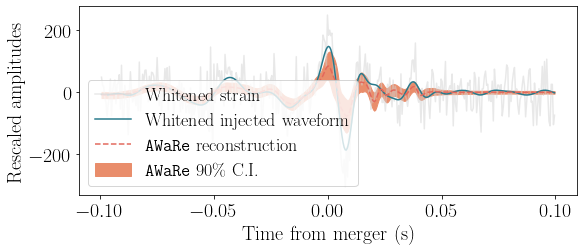

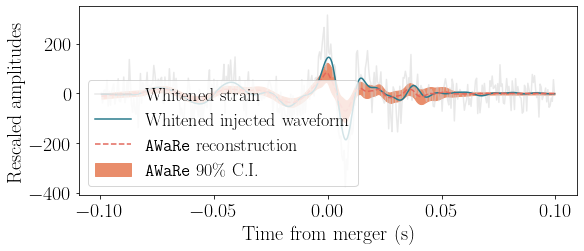

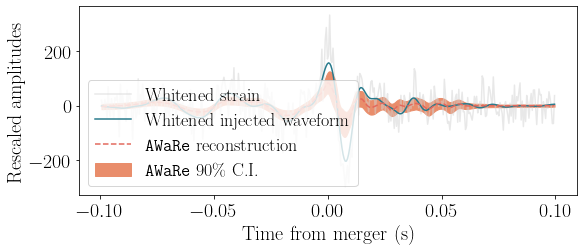

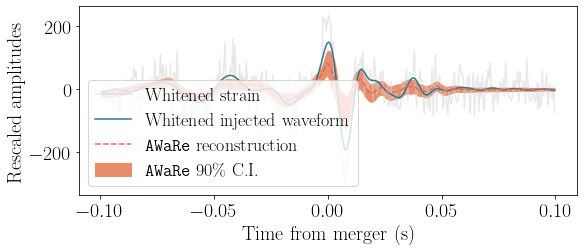

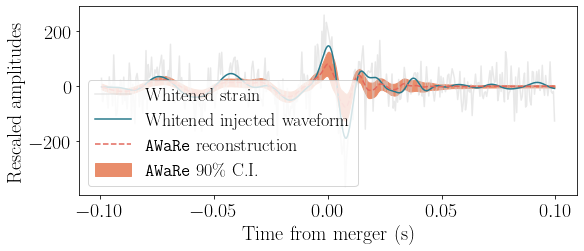

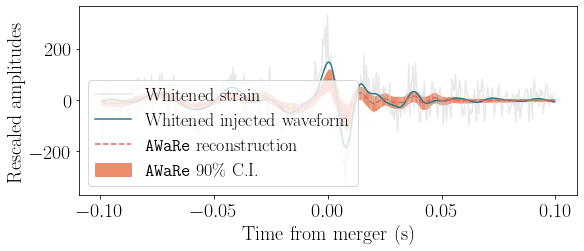

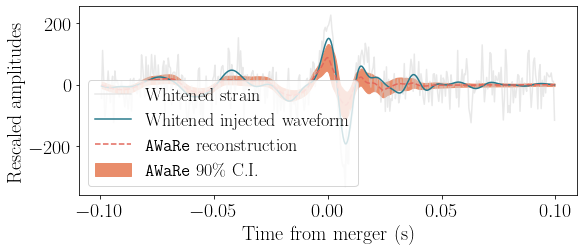

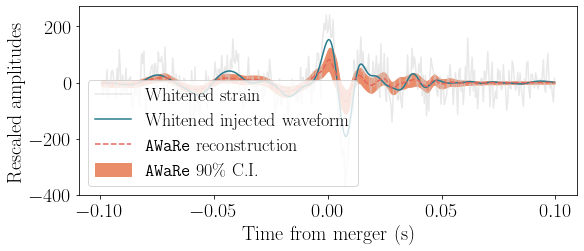

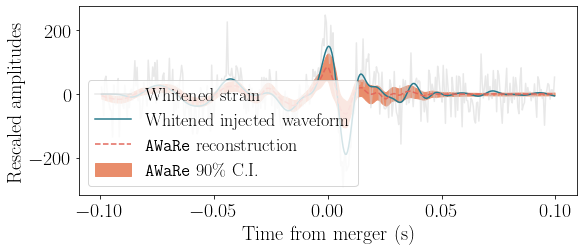

In [31]:
for i in range(20,30):

    mass1 = f1['injection_parameters']['mass1'][i]
    mass2 = f1['injection_parameters']['mass2'][i]
    strain_data = l1_strain_data[i]*1.5
    snr = l1_snr[i]
    psd = f1['injection_parameters']['psd_noise_l1'][i]
    signal = l1_signal[i]
    mean_signal = mean_preds[i]*100
    lower = lower_bound[i]*100
    upper = upper_bound[i]*100

    plot_samples(i, signal.astype('float64'), strain_data.astype('float64'), mean_signal.astype('float64'), psd.astype('float64'), mass1, mass2, snr, lower.astype('float64'), upper.astype('float64'), before=0.1, after=0.1)


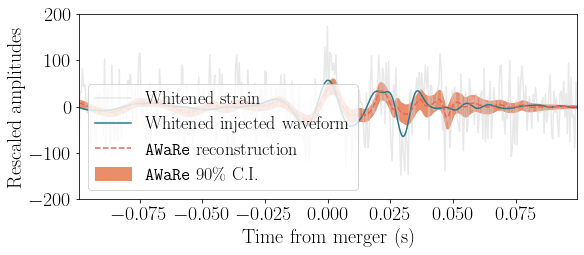

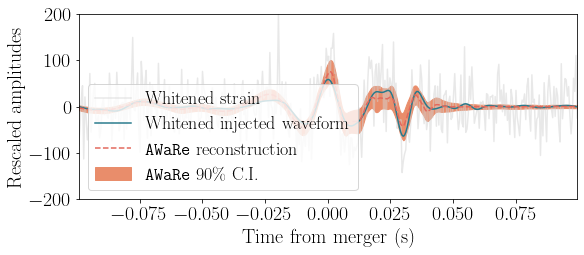

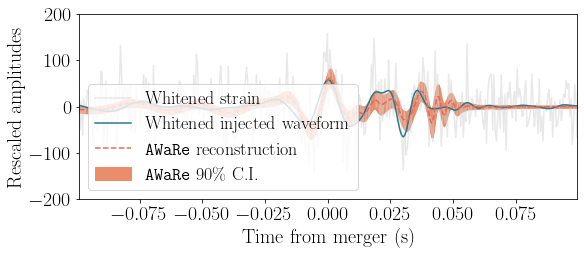

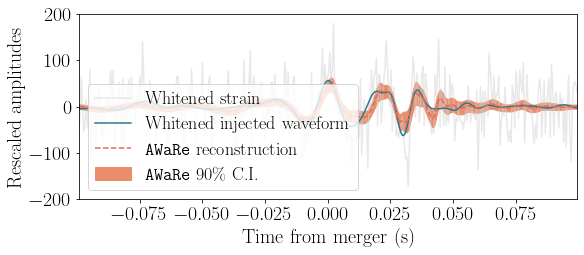

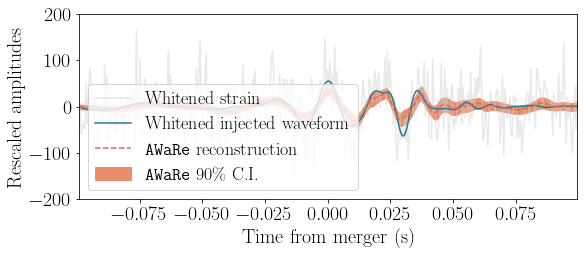

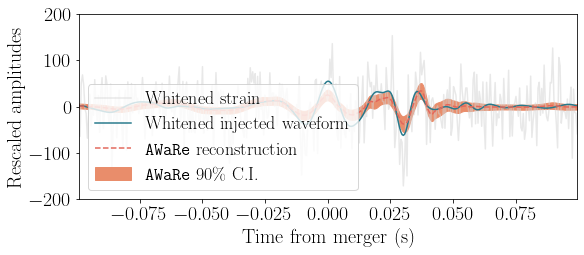

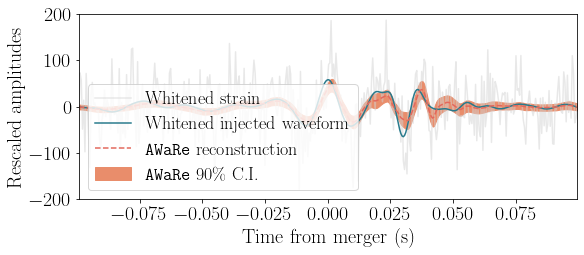

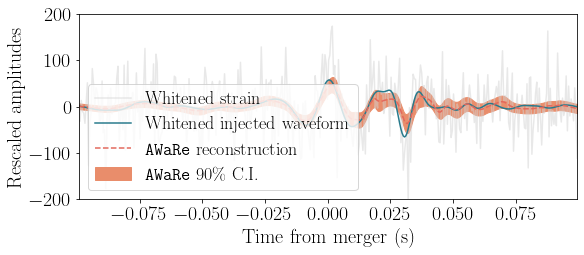

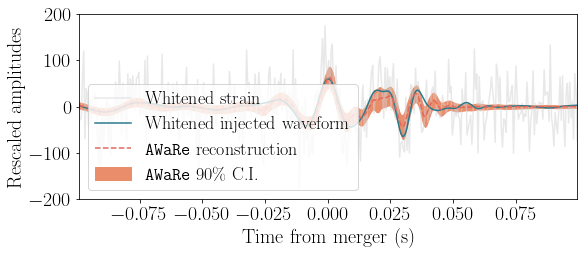

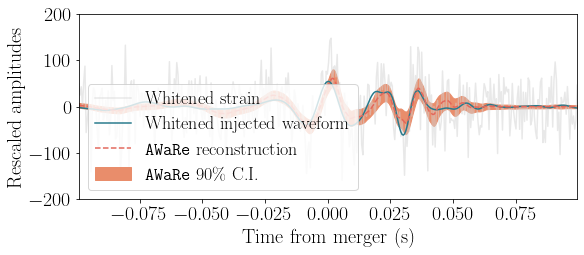

In [26]:
for i in range(60,70):

    mass1 = f1['injection_parameters']['mass1'][i]
    mass2 = f1['injection_parameters']['mass2'][i]
    strain_data = l1_strain_data[i]*1.5
    snr = l1_snr[i]
    psd = f1['injection_parameters']['psd_noise_l1'][i]
    signal = l1_signal[i]
    mean_signal = mean_preds[i]*100
    lower = lower_bound[i]*100
    upper = upper_bound[i]*100

    plot_samples(i, signal.astype('float64'), strain_data.astype('float64'), mean_signal.astype('float64'), psd.astype('float64'), mass1, mass2, snr, lower.astype('float64'), upper.astype('float64'),before=0.1,after=0.1)


In [23]:
import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)
from pycbc.filter import match, overlap
from pycbc.types.timeseries import TimeSeries, FrequencySeries

def get_mismatch(signal, mean_signal, psd):

    time_buffer = 1
    sample_rate = 2048
    # Length of corresponding time series and frequency series
    tlen = int(sample_rate * time_buffer)
    flen = tlen // 2 + 1

    delta_f = 1.0 / time_buffer
    #    psd = aLIGOZeroDetHighPower(flen, delta_f, f_low)
    
    #    X_test_pure_cwb_ts = TimeSeries(pure_signals_cwb.squeeze(), delta_t = 1.0/1024)
    l1_signal_ts = TimeSeries(signal, delta_t = 1.0/2048)
    mean_signal_ts = TimeSeries(mean_signal, delta_t = 1.0/2048)
    psd = FrequencySeries(psd, delta_f=delta_f)

    #    X_test_pure_cwb_ts.resize(tlen)
    l1_signal_ts.resize(tlen)
    mean_signal_ts.resize(tlen)
    psd.resize(flen)

    mis_match = 1.0 - Overlap_calc(l1_signal_ts,mean_signal_ts,psd)

    return mis_match


In [24]:
mismatch = []

for i in range(1000):

    mass1 = f1['injection_parameters']['mass1'][i]
    mass2 = f1['injection_parameters']['mass2'][i]
    snr = l1_snr[i]
    psd = f1['injection_parameters']['psd_noise_l1'][i]
    signal = l1_signal[i]
    mean_signal = mean_preds[i]*100
    lower = lower_bound[i]*100
    upper = upper_bound[i]*100

    mismatch.append(get_mismatch(signal.astype('float64'), mean_signal.astype('float64'), psd.astype('float64')))


In [25]:
mismatch = np.array(mismatch)

In [26]:
mismatch = mismatch.reshape(100,10)

In [27]:
l1_snr_mean = l1_snr.reshape(100,10).mean(axis=1)

In [28]:
#sorted_indices = np.argsort(l1_snr_mean)

# Step 2: Use these indices to reorder both array_a and array_b
#l1_snr_mean = l1_snr_mean[sorted_indices]
#mean_mismatch = mean_mismatch[sorted_indices]


# Calculate the upper and lower bounds of the 2-standard deviation interval
#lower_std = mean_mismatch - std_mismatch
#upper_std = mean_mismatch + std_mismatch

mean_mismatch = mismatch.mean(axis=1)
std_mismatch = mismatch.std(axis=1)


In [29]:
import csv

filename = 'Mismatch_data.csv'

# Writing the data into the file
with open(filename, 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(['SNR', 'Mean Mismatch', 'STD'])  # Writing the header
    for c1, c2, c3 in zip(l1_snr_mean, mean_mismatch, std_mismatch):
        csvwriter.writerow([c1,c2,c3])  # Writing data rows



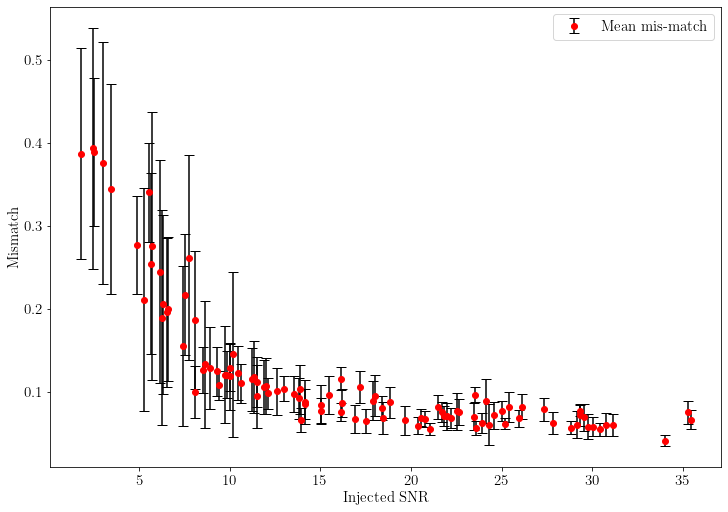

In [30]:
import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)
# Create a figure with GridSpec layout
#fig = plt.figure(figsize=(8, 7))
#gs = gridspec.GridSpec(2, 2, width_ratios=[5, 1], height_ratios=[1, 5], hspace=0.05, wspace=0.05)
# Define the color palettes
palette_flare = sns.color_palette("flare", n_colors=5)
palette_crest = sns.color_palette("crest", n_colors=5)

# Main scatter plot
fig, ax = plt.subplots(figsize=(10, 7))
cmap = sns.color_palette("flare", as_cmap=True)

#fig = plt.figure(figsize=(10,7))
    
# Plot for decoded signals and pure_signals_cwb
#signal_axes = fig.add_subplot(211)
mean_mismatch = mismatch.mean(axis=1)
std_mismatch = mismatch.std(axis=1)

# Plotting the data
#plt.plot(l1_snr_mean, mean_mismatch, 'o', color='blue')  # Plot the central line

# Create a simple error bar plot
#plt.fill_between(l1_snr_mean, lower_std, upper_std, color='gray', alpha=0.2)
ax.errorbar(l1_snr_mean, mean_mismatch, yerr=std_mismatch, color='red', fmt='o', capsize=5, capthick=1, ecolor='black', label='Mean mis-match')
#ax.errorbar(l1_snr_mean, mean_mismatch, yerr=std_mismatch, fmt='o', color='lightblue', ecolor='lightgray', elinewidth=3, capsize=0)
#plt.title('Error Bar Plot')
ax.set_ylabel('Mismatch', fontsize=15)
ax.set_xlabel('Injected SNR', fontsize=15)
ax.tick_params(axis='both', labelsize=15)
plt.legend(fontsize=15)
#plt.savefig('Paper_plots_uncertainty/IMRPhenomXPHM_convergence_mismatch.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)

#plt.xlabel('SNR')
#plt.ylabel('Mismatch')
#plt.grid(True)


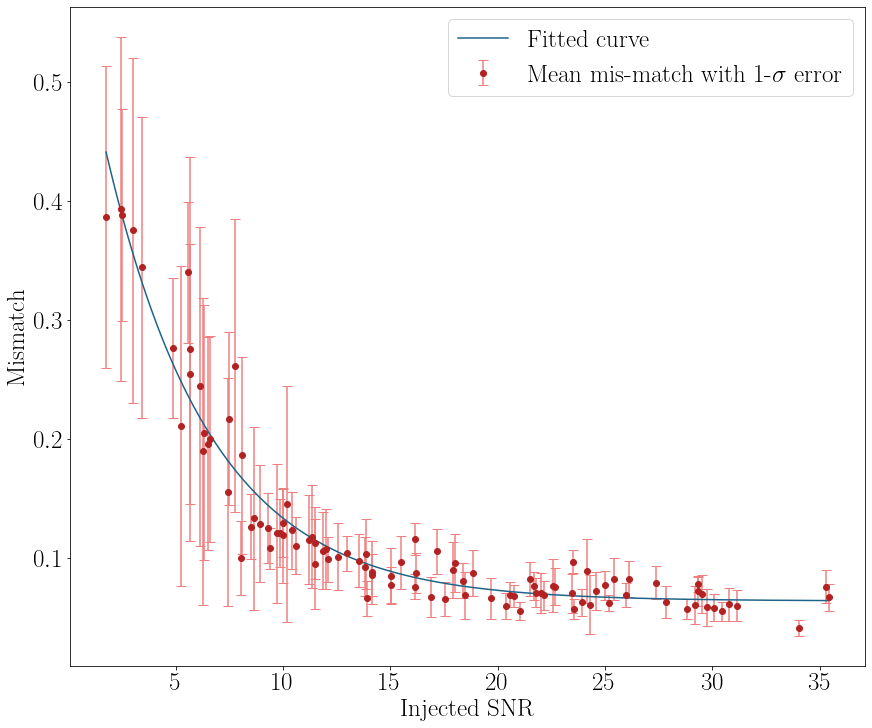

In [34]:
import pandas as pd
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)
# Create a figure with GridSpec layout
#fig = plt.figure(figsize=(8, 7))
#gs = gridspec.GridSpec(2, 2, width_ratios=[5, 1], height_ratios=[1, 5], hspace=0.05, wspace=0.05)
# Define the color palettes
#palette_flare = sns.color_palette("flare", n_colors=5)
#palette_crest = sns.color_palette("crest", n_colors=5)

palette_flare = sns.color_palette("flare", n_colors=6)
palette_rocket = sns.color_palette("rocket", n_colors=6)
palette_crest = sns.color_palette("crest", n_colors=6)

# Main scatter plot
fig, ax = plt.subplots(figsize=(12, 10))
#cmap = sns.color_palette("flare", as_cmap=True)

# Load the data
file_path = 'Mismatch_data.csv'
data = pd.read_csv(file_path)

# Extract the SNR, mean mismatch, and the standard deviation of mismatch
SNR = data.iloc[:,0].values
mean_mismatch = data.iloc[:,1].values
std_dev_mismatch = data.iloc[:,2].values

# Define the model: let's start with an exponential decay function
def exp_decay(x, a, b, c):
    return a * np.exp(-b * x) + c

# Fit the curve
params, covariance = curve_fit(exp_decay, SNR, mean_mismatch)

# Generate a sequence of SNR values for plotting the fitted curve
SNR_fit = np.linspace(min(SNR), max(SNR), 200)
fitted_curve = exp_decay(SNR_fit, *params)

# Create a simple error bar plot
#plt.fill_between(l1_snr_mean, lower_std, upper_std, color='gray', alpha=0.2)
ax.errorbar(SNR, mean_mismatch, yerr=std_dev_mismatch, color='firebrick', fmt='o', capsize=5, capthick=1, ecolor='lightcoral', label='Mean mis-match with 1-$\sigma$ error')
plt.plot(SNR_fit, fitted_curve, label='Fitted curve', color=palette_crest[4])
#ax.errorbar(l1_snr_mean, mean_mismatch, yerr=std_mismatch, fmt='o', color='lightblue', ecolor='lightgray', elinewidth=3, capsize=0)
#plt.title('Error Bar Plot')
ax.set_ylabel('Mismatch', fontsize=25)
ax.set_xlabel('Injected SNR', fontsize=25)
ax.tick_params(axis='both', labelsize=25)
plt.legend(fontsize=25)
plt.savefig('Paper_plots_uncertainty/IMRPhenomXPHM_convergence_mismatch_1.svg', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)

#plt.xlabel('SNR')
#plt.ylabel('Mismatch')
plt.grid(False)


# Plot the data and the fitted curve
#plt.figure(figsize=(10, 6))
#plt.errorbar(SNR, mean_mismatch, yerr=std_dev_mismatch, fmt='o', label='Data with standard deviation')
#plt.plot(SNR_fit, fitted_curve, label='Fitted curve', color='red')
#plt.xlabel('Injected SNR')
#plt.ylabel('Mismatch')
#plt.title('Curve Fitting: Mismatch vs. Injected SNR')
#plt.legend()
#plt.show()


Text(0.5, 1.0, 'Curve Fitting: Mismatch vs. Injected SNR')

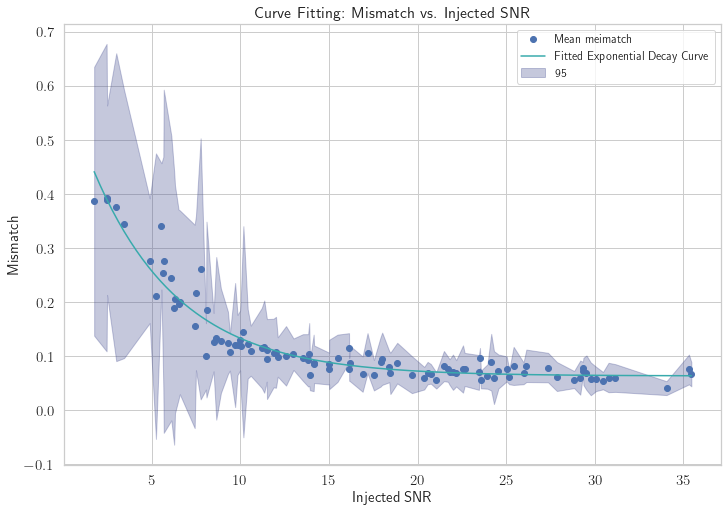

In [94]:
import pandas as pd
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib_latex_bridge as mlb

# Setup the page using matplotlib_latex_bridge for LaTeX integration
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)

# Load the data
file_path = 'Mismatch_data.csv'
data = pd.read_csv(file_path)

SNR = data.iloc[:,0].values
mean_mismatch = data.iloc[:,1].values
std_dev_mismatch = data.iloc[:,2].values

# Get the indices that would sort the SNR array
sorted_indices = np.argsort(SNR)

# Use these indices to sort all arrays
SNR_sorted = SNR[sorted_indices]
mean_mismatch_sorted = mean_mismatch[sorted_indices]
std_dev_mismatch_sorted = std_dev_mismatch[sorted_indices]

# Define the model: an exponential decay function
def exp_decay(x, a, b, c):
    return a * np.exp(-b * x) + c

# Fit the curve
params, covariance = curve_fit(exp_decay, SNR_sorted, mean_mismatch_sorted)

# Generate SNR values for the fitted curve
SNR_fit = np.linspace(min(SNR_sorted), max(SNR_sorted), 200)
fitted_curve = exp_decay(SNR_fit, *params)

# Define the color palette using Seaborn
sns.set(style="whitegrid")  # Set the style of the plots to have a grid and white background
palette = sns.color_palette("mako", n_colors=2)  # 'mako' is a blue-centric palette

# Create figure and axis
fig, ax = plt.subplots(figsize=(10, 7))

# Plot the fitted curve
ax.plot(SNR_sorted, mean_mismatch_sorted, 'o', label='Mean meimatch')
ax.plot(SNR_fit, fitted_curve, label='Fitted Exponential Decay Curve', color=palette[1])

# Create a fill between for the confidence intervals using the standard deviation
ci = 1.96 * std_dev_mismatch_sorted  # 95% confidence interval assuming normality
ax.fill_between(SNR_sorted, mean_mismatch_sorted - ci, mean_mismatch_sorted + ci, color=palette[0], alpha=0.3,
                label='95% Confidence Interval')

# Labeling and aesthetics
ax.set_xlabel('Injected SNR', fontsize=15)
ax.set_ylabel('Mismatch', fontsize=15)
ax.tick_params(axis='both', labelsize=15)
ax.legend(fontsize=12)
plt.title('Curve Fitting: Mismatch vs. Injected SNR', fontsize=16)

# Save and show the plot
#plt.savefig('Mismatch_vs_SNR_with_CI.png', bbox_inches="tight", dpi=300)
#plt.show()


In [ ]:
from scipy.fft import fft, ifft

#def get_snr_frac(decoded_signal):
    
#    h_fft = fft(decoded_signal)
#    template_fft = fft(decoded_signal)
#    snr_freq = (h_fft * template_fft.conjugate())
#    snr_time = np.abs(ifft(snr_freq))
#    optimal_snr_ml = np.sqrt(np.max(snr_time))

#    return optimal_snr_ml


# First, find the SNR and the ratio we need to adjust the final timeseries by.
def get_snr_frac(decoded_signal):
    
    fs = 2048
    timeseries = 100.0*decoded_signal

    # Convert the timeseries into freqsignal
    freq_signal = np.fft.rfft(timeseries) / fs 

    # If our frequency signal is not produced correctly, return None
    if (np.sum(freq_signal) == 0):
        return None 

    freq_values = np.fft.fftfreq(len(timeseries), d=1./fs)
        
    # Get only the frequencies between 8Hz and 2048Hz
    freq_signal = freq_signal[8:2048]
    freq_values = freq_values[8:2048]


    # Find the frequency spacing
    df = freq_values[1] - freq_values[0]

    # Calculate current SNR 
    SNRsq = 4 * df * np.sum(pow(abs(freq_signal),2.))
    SNR = np.sqrt(SNRsq)

    return SNR


# Example

In [9]:
import h5py

f1 = h5py.File('/fred/oz016/Chayan/samplegen_old/output/Example_IMRPhenomXPHM_test.hdf', 'r')

l1_strain = f1['injection_samples']['l1_strain'][()]
l1_signal = f1['injection_parameters']['l1_signal_whitened'][()]
l1_snr = f1['injection_parameters']['l1_snr'][()]*f1['injection_parameters']['scale_factor'][()]


In [10]:
l1_strain_data = np.copy(l1_strain)

strain, maximum, minimum = _preprocess_data(l1_strain, l1_strain.shape[0], 2048)
strain = np.array(strain)

strain.shape

(100, 2048)

In [11]:
X_test_strain = reshape_sequences(strain.shape[0], strain)
X_test_pure_signal = reshape_sequences(l1_signal.shape[0], l1_signal)

# Reshape arrays to fit into Keras model
X_test_strain = X_test_strain[:,:,:,None]
print('x_test_strain shape:', X_test_strain.shape)
X_test_strain = X_test_strain.astype("float32")

X_test_pure_signal = X_test_pure_signal[:,:,:,None]
print('x_test_pure_signal shape:', X_test_pure_signal.shape)
X_test_pure_signal = X_test_pure_signal.astype("float32")


x_test_strain shape: (100, 2058, 10, 1)
x_test_pure_signal shape: (100, 2058, 10, 1)


In [12]:
distribution = model(X_test_strain)
    
# Extract mean and standard deviation from the distribution
mean_preds = distribution.mean()
std_preds = distribution.stddev()
 
mean_preds = mean_preds.numpy().squeeze()
std_preds = std_preds.numpy().squeeze()

# Calculate the upper and lower bounds of the 2-standard deviation interval
lower_bound_90 = mean_preds - 1.645 * std_preds
upper_bound_90 = mean_preds + 1.645 * std_preds

lower_bound_50 = mean_preds - 0.6745 * std_preds
upper_bound_50 = mean_preds + 0.6745 * std_preds

mean_preds = mean_preds[:,0:2048]

lower_bound_90 = lower_bound_90[:,0:2048]
upper_bound_90 = upper_bound_90[:,0:2048]

lower_bound_50 = lower_bound_50[:,0:2048]
upper_bound_50 = upper_bound_50[:,0:2048]


In [15]:
import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)
from pycbc.filter import match, overlap
from pycbc.types.timeseries import TimeSeries, FrequencySeries
import seaborn as sns

def plot_samples(i, signal, strain_data, mean_signal, psd, mass1, mass2, snr, lower_bound_90, upper_bound_90, lower_bound_50, upper_bound_50, before=0.8, after=0.2):

    palette_flare = sns.color_palette("flare", n_colors=6)
    palette_rocket = sns.color_palette("rocket", n_colors=6)    
    palette_crest = sns.color_palette("crest", n_colors=6)

    fig = plt.figure(figsize=(10,7))
    
    # Plot for decoded signals and pure_signals_cwb
    signal_axes = fig.add_subplot(211)

    max_index = np.argmax(signal)
    start_time =  -max_index/2048.0 
    end_time = 1.0 - max_index/2048.0

    before_index = max(max_index - int(before*2048),0)
    after_index = min(max_index + int(after*2048),2048)

    time = np.linspace(start_time, end_time, mean_preds.shape[1])

    time = time[before_index:after_index]

    time_buffer = 1
    sample_rate = 2048
    # Length of corresponding time series and frequency series
    tlen = int(sample_rate * time_buffer)
    flen = tlen // 2 + 1

    delta_f = 1.0 / time_buffer
    #    psd = aLIGOZeroDetHighPower(flen, delta_f, f_low)
    
    #    X_test_pure_cwb_ts = TimeSeries(pure_signals_cwb.squeeze(), delta_t = 1.0/1024)
    l1_signal_ts = TimeSeries(signal, delta_t = 1.0/2048)
    mean_signal_ts = TimeSeries(mean_signal, delta_t = 1.0/2048)
    psd = FrequencySeries(psd, delta_f=delta_f)

    #    X_test_pure_cwb_ts.resize(tlen)
    l1_signal_ts.resize(tlen)
    mean_signal_ts.resize(tlen)
    psd.resize(flen)

    mis_match = 1.0 - Overlap_calc(l1_signal_ts,mean_signal_ts,psd)

#    mass1 = f1['injection_parameters']['mass1'][i]
#    mass2 = f1['injection_parameters']['mass2'][i]
#    snr = l1_snr[i]

    strain_data = strain_data[before_index:after_index]
    signal = signal[before_index:after_index]
    mean_signal = mean_signal[before_index:after_index]
    lower_bound_90 = lower_bound_90[before_index:after_index]
    upper_bound_90 = upper_bound_90[before_index:after_index]

    lower_bound_50 = lower_bound_50[before_index:after_index]
    upper_bound_50 = upper_bound_50[before_index:after_index]

    signal_axes.plot(time, strain_data, label='Whitened strain', color='lightgrey', alpha=0.4)
#    signal_axes.plot(time, signal, label='Whitened injected waveform', color='tab:orange')
    signal_axes.plot(time, signal, label='Whitened injected waveform', color=palette_crest[3])
    signal_axes.plot(time, mean_signal, label='\\texttt{AWaRe} reconstruction', color=palette_flare[1])

    signal_axes.fill_between(time,lower_bound_50,upper_bound_50, color=palette_flare[1], alpha=0.7, label='\\texttt{AWaRe} 50\% C.I.')
    signal_axes.fill_between(time,lower_bound_90,upper_bound_90, color=palette_flare[1], alpha=0.5, label='\\texttt{AWaRe} 90\% C.I.')

#    signal_axes.plot(time, signal, label='Whitened injected waveform', color=palette_crest[3])
#    signal_axes.plot(time, mean_signal, label='\\texttt{AWaRe} reconstruction', color='red', linestyle='dashed')

    #plt.plot(time, mean_preds[1], label='\\texttt{AWaRe} SEOBNRv4PHM', color='red')
    #plt.plot(time, mean_preds[2], label='\\texttt{AWaRe} NRHybSur3dq8', color='red')

#    signal_axes.fill_between(time,lower_bound,upper_bound, color='lightpink', label='\\texttt{AWaRe} 90\% C.I.', alpha=0.5)

#    signal_axes.set_title('Mass_1 = {mass1}, Mass_2 = {mass2}, SNR = {snr}, Eccentricity = {ecc}, Mis-match = {mis_match}'.format(mass1=np.round(mass1,2),mass2=np.round(mass2,2),snr=np.round(snr,2), ecc=np.round(ecc,2),mis_match=np.round(mis_match,2)))    
    signal_axes.set_ylabel('Rescaled amplitudes', fontsize=15)
    signal_axes.set_xlabel('Time from merger (in secs)', fontsize=15)
    signal_axes.tick_params(axis='y', labelsize=15)
    signal_axes.tick_params(axis='x', labelsize=15)
    signal_axes.legend(loc='lower left', fontsize=12)

    return time, mean_signal, before_index, after_index

#    plt.savefig('Paper_plots_uncertainty/Eccentricity_tests/Plot_'+str(i)+'.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)

#    return mis_match


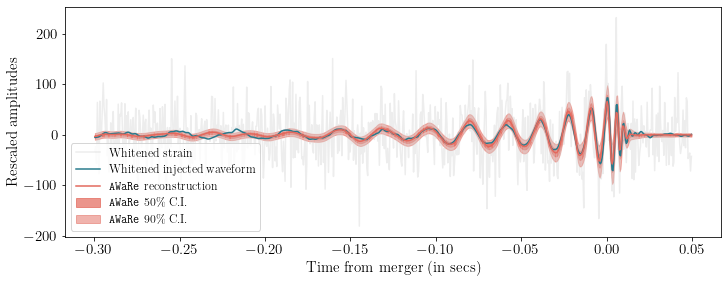

In [161]:
mass1 = f1['injection_parameters']['mass1'][2]
mass2 = f1['injection_parameters']['mass2'][2]
strain_data = l1_strain_data[2]*1.5
snr = l1_snr[2]
psd = f1['injection_parameters']['psd_noise_l1'][2]
signal = l1_signal[2]
mean_signal = mean_preds[2]*100
lower_90 = lower_bound_90[2]*100
upper_90 = upper_bound_90[2]*100
lower_50 = lower_bound_50[2]*100
upper_50 = upper_bound_50[2]*100

time, strain_example, before_index, after_index = plot_samples(5, signal.astype('float64'), strain_data.astype('float64'), mean_signal.astype('float64'), psd.astype('float64'), mass1, mass2, snr, lower_90.astype('float64'), upper_90.astype('float64'), lower_50.astype('float64'), upper_50.astype('float64'), before=0.3, after=0.05)


In [121]:
# Initialize 'mean_preds' as needed
mean_preds = mean_preds[:,before_index:after_index]*100.0  # Assume this is already defined


In [122]:
mean_preds.shape

(100, 716)

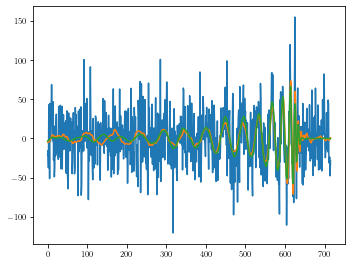

In [132]:
plt.plot(l1_strain_data[2][before_index:after_index])
plt.plot(l1_signal[2][before_index:after_index])
plt.plot(mean_preds[2])

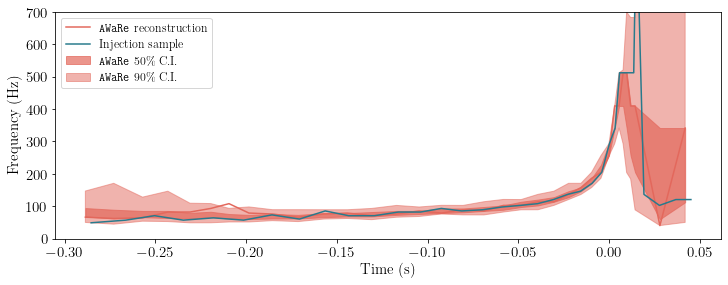

In [138]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Assume mean_preds is defined elsewhere
# Example setup:
# mean_preds = np.random.randn(100, 1700)  # Normally distributed data for 100 signals

palette_flare = sns.color_palette("flare", n_colors=6)
palette_rocket = sns.color_palette("rocket", n_colors=6)    
palette_crest = sns.color_palette("crest", n_colors=6)

def find_zero_crossings(y, x):
    crossings = np.where(np.diff(np.sign(y)))[0]
    if len(crossings) > 1:
        return x[crossings]
    else:
        return np.array([])

def calculate_frequencies(y, x):
    crossings = find_zero_crossings(y, x)
    if len(crossings) > 1:
        intervals = crossings[1:] - crossings[:-1]
        frequencies = 1 / intervals
        mid_points = (crossings[:-1] + crossings[1:]) / 2  # Averaging points for midpoint
        return frequencies, mid_points
    else:
        return np.array([]), np.array([])

# Create a time array that matches the length of the signals in mean_preds
#time = np.linspace(0, 10, 1700)  # Adjust as per the actual time scale of your data

# Calculate frequencies for mean_preds[1], assumed to be a specific signal of interest
freqs_single, times_single = calculate_frequencies(mean_preds[2], time)
freqs_injection, times_injection = calculate_frequencies(l1_signal[2][before_index:after_index], time)
#freqs_strain_data, times_strain_data = calculate_frequencies(l1_strain_data[2][before_index:after_index], time)

# Store frequency arrays from all signals at times_single
all_frequencies_at_times_single = []

# Compute frequencies for each signal at times determined by mean_preds[1]
for index in range(mean_preds.shape[0]):
    freqs, times = calculate_frequencies(mean_preds[index], time)
    if freqs.size > 0:
        # Interpolating frequencies to match the times of freqs_single
        interp_func = interp1d(times, freqs, kind='nearest', fill_value="extrapolate", bounds_error=False)
        interpolated_freqs = interp_func(times_single)
        all_frequencies_at_times_single.append(interpolated_freqs)

# Convert list to array for statistical calculation
frequencies_array = np.array(all_frequencies_at_times_single)

# Calculate 50% and 90% confidence intervals
ci_50 = np.percentile(frequencies_array, [25, 75], axis=0)
ci_90 = np.percentile(frequencies_array, [5, 95], axis=0)

# Plotting
fig = plt.figure(figsize=(10,7))
    
# Plot for decoded signals and pure_signals_cwb
signal_axes = fig.add_subplot(211)

#plt.plot(times_strain_data, freqs_strain_data, label='Frequency of strain data', color='grey')

signal_axes.plot(times_single, freqs_single, label='\\texttt{AWaRe} reconstruction', color=palette_flare[1])
signal_axes.plot(times_injection, freqs_injection, label='Injection sample', color=palette_crest[3])
signal_axes.fill_between(times_single, ci_50[0], ci_50[1], color=palette_flare[1], alpha=0.7, label='\\texttt{AWaRe} 50\% C.I.')
signal_axes.fill_between(times_single, ci_90[0], ci_90[1], color=palette_flare[1], alpha=0.5, label='\\texttt{AWaRe} 90\% C.I.')
plt.ylim(0,700)
signal_axes.set_ylabel('Frequency (Hz)', fontsize=15)
signal_axes.set_xlabel('Time (s)', fontsize=15)
signal_axes.tick_params(axis='y', labelsize=15)
signal_axes.tick_params(axis='x', labelsize=15)
signal_axes.legend(loc='upper left', fontsize=12)



In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from scipy.interpolate import interp1d

def find_zero_crossings(y, x):
    crossings = np.where(np.diff(np.sign(y)))[0]
    if len(crossings) > 1:
        return x[crossings]
    else:
        return np.array([])

def calculate_frequencies(y, x):
    crossings = find_zero_crossings(y, x)
    if len(crossings) > 1:
        intervals = crossings[1:] - crossings[:-1]
        frequencies = 1 / intervals
        mid_points = (crossings[:-1] + crossings[1:]) / 2  # Averaging points for midpoint
        return frequencies, mid_points
    else:
        return np.array([]), np.array([])

def plot_td_and_fd_sample(signal, strain_data, mean_signal, reconstructions, lower_bound_90, upper_bound_90, lower_bound_50, upper_bound_50, before=0.8, after=0.2):

    palette_flare = sns.color_palette("flare", n_colors=6)
    palette_rocket = sns.color_palette("rocket", n_colors=6)    
    palette_crest = sns.color_palette("crest", n_colors=6)

    # Create a figure with subplots sharing both x and y axes
    fig, axs = plt.subplots(2, 1, figsize=(10, 7), sharex=True, sharey=False, gridspec_kw={'hspace': 0})  # No space between plots

    max_index = np.argmax(signal)
    start_time =  -max_index/2048.0 
    end_time = 1.0 - max_index/2048.0

    before_index = max(max_index - int(before*2048),0)
    after_index = min(max_index + int(after*2048),2048)

    time = np.linspace(start_time, end_time, mean_signal.shape[0])

    time = time[before_index:after_index]

    strain_data = strain_data[before_index:after_index]
    signal = signal[before_index:after_index]
    mean_signal = mean_signal[before_index:after_index]
    reconstructions = reconstructions[:,before_index:after_index]

    lower_bound_90 = lower_bound_90[before_index:after_index]
    upper_bound_90 = upper_bound_90[before_index:after_index]

    lower_bound_50 = lower_bound_50[before_index:after_index]
    upper_bound_50 = upper_bound_50[before_index:after_index]

    # Calculate frequencies for mean_signal, assumed to be a specific signal of interest
    freqs_single, times_single = calculate_frequencies(mean_signal, time)
    freqs_injection, times_injection = calculate_frequencies(signal, time)

    # Store frequency arrays from all signals at times_single
    all_frequencies_at_times_single = []

    # Compute frequencies for each signal at times determined by mean_signal
    for index in range(reconstructions.shape[0]):
        freqs, times = calculate_frequencies(reconstructions[index], time)
        if freqs.size > 0:
            # Interpolating frequencies to match the times of freqs_single
            interp_func = interp1d(times, freqs, kind='nearest', fill_value="extrapolate", bounds_error=False)
            interpolated_freqs = interp_func(times_single)
            all_frequencies_at_times_single.append(interpolated_freqs)

    # Convert list to array for statistical calculation
    frequencies_array = np.array(all_frequencies_at_times_single)

    # Calculate 50% and 90% confidence intervals
    ci_50 = np.percentile(frequencies_array, [25, 75], axis=0)
    ci_90 = np.percentile(frequencies_array, [5, 95], axis=0)

    axs[0].plot(time, strain_data, label='Whitened strain', color='lightgrey', alpha=0.4)
    axs[0].plot(time, signal, label='Whitened injected waveform', color=palette_flare[1])
    axs[0].plot(time, mean_signal, label='\\texttt{AWaRe} reconstruction', color=palette_crest[3])

    axs[0].fill_between(time, lower_bound_50, upper_bound_50, color=palette_crest[3], alpha=0.7, label='\\texttt{AWaRe} 50% C.I.')
    axs[0].fill_between(time, lower_bound_90, upper_bound_90, color=palette_crest[3], alpha=0.5, label='\\texttt{AWaRe} 90% C.I.')

    axs[0].set_ylabel('Rescaled amplitudes', fontsize=24)
    axs[0].tick_params(axis='y', labelsize=24)
    axs[0].tick_params(axis='x', labelsize=24)

    axs[1].plot(times_single, freqs_single, label='\\texttt{AWaRe} reconstruction', color=palette_crest[3])
    axs[1].plot(times_injection, freqs_injection, label='Injection sample', color=palette_flare[1])
    axs[1].fill_between(times_single, ci_50[0], ci_50[1], color=palette_crest[3], alpha=0.7, label='\\texttt{AWaRe} 50\% C.I.')
    axs[1].fill_between(times_single, ci_90[0], ci_90[1], color=palette_crest[3], alpha=0.5, label='\\texttt{AWaRe} 90\% C.I.')

    axs[0].set_xlim(time[0], time[-1])
    axs[1].set_xlim(time[0], time[-1])

    axs[1].set_ylim(0, 700)
    axs[1].set_ylabel('Frequency (Hz)', fontsize=24)
    axs[1].set_xlabel('Time from merger (s)', fontsize=24)
    axs[1].tick_params(axis='y', labelsize=24)
    axs[1].tick_params(axis='x', labelsize=24)
    axs[1].legend(loc='upper left', fontsize=20)    

    fig.tight_layout()  # Adjust layout to prevent overlap and clipping
    fig.align_ylabels(axs)  # Align y-axis labels

    plt.savefig('Paper_plots_uncertainty/Example_td_fd_2.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)


<ipython-input-24-b7819c078e9a>:103: UserWarning: The figure layout has changed to tight
  fig.tight_layout()  # Adjust layout to prevent overlap and clipping


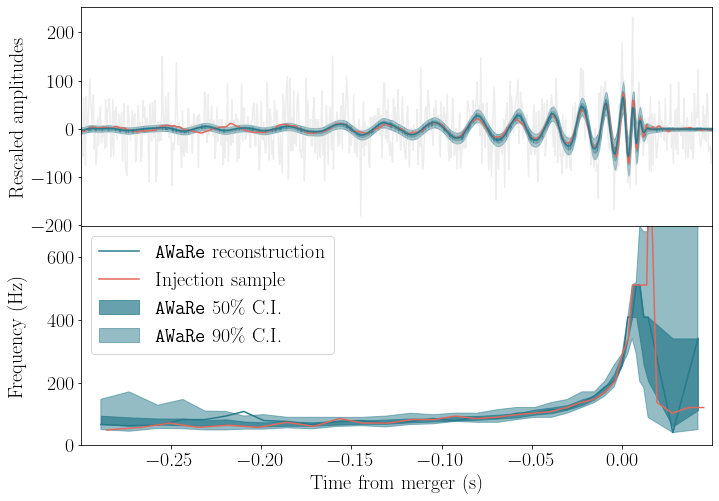

In [ ]:
strain_data = l1_strain_data[2]*1.5
signal = l1_signal[2]
mean_signal = mean_preds[2]*100
lower_90 = lower_bound_90[2]*100
upper_90 = upper_bound_90[2]*100
lower_50 = lower_bound_50[2]*100
upper_50 = upper_bound_50[2]*100

plot_td_and_fd_sample(signal.astype('float64'), strain_data.astype('float64'), mean_signal.astype('float64'), mean_preds*100, lower_90.astype('float64'), upper_90.astype('float64'), lower_50.astype('float64'), upper_50.astype('float64'), before=0.3, after=0.05)


In [181]:
from scipy.signal import welch

def plot_psd(mean_signal, injected_signal, strain, lower_90, upper_90, lower_50, upper_50, fs):
    """ Plot the power spectral density """

    palette_flare = sns.color_palette("flare", n_colors=6)
    palette_rocket = sns.color_palette("rocket", n_colors=6)    
    palette_crest = sns.color_palette("crest", n_colors=6)

    f, Pxx = welch(mean_signal, fs=fs, nperseg=1024)
    f1, Pxx1 = welch(injected_signal, fs=fs, nperseg=1024)
    f2, Pxx2 = welch(strain, fs=fs, nperseg=1024)
    f3, Pxx3 = welch(lower_50, fs=fs, nperseg=1024)
    f4, Pxx4 = welch(upper_50, fs=fs, nperseg=1024)
    f5, Pxx5 = welch(lower_90, fs=fs, nperseg=1024)
    f6, Pxx6 = welch(upper_90, fs=fs, nperseg=1024)

    fig = plt.figure(figsize=(10,7))

    plt.loglog(f, (Pxx), color=palette_flare[1], label='PSD of the reconstructed signal')
    plt.loglog(f1, (Pxx1), color=palette_crest[3], label='PSD of the injected signal')
    plt.loglog(f2, (Pxx2), color='lightgrey', label='PSD of the strain data')
    plt.fill_between(f3, Pxx3, Pxx4, color=palette_flare[1], alpha=0.7, label='50\% C.I.')
    plt.fill_between(f5, Pxx5, Pxx6, color=palette_flare[1], alpha=0.5, label='90\% C.I.')
    plt.xlim(20,700)
    plt.ylim(1e-4)
    plt.xlabel('Frequency (Hz)', fontsize=15)
    plt.ylabel('PSD (1/$\sqrt{Hz}$)', fontsize=15)
    plt.grid(False)
    plt.tick_params(axis='y', labelsize=15)
    plt.tick_params(axis='x', labelsize=15)
    plt.legend(fontsize=12)
    plt.savefig('Paper_plots_uncertainty/Example_PSD_1.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)


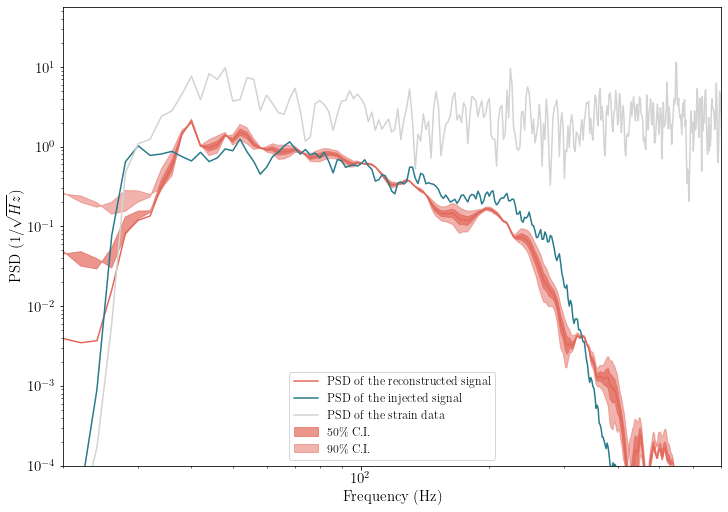

In [182]:
plot_psd(mean_signal, signal, strain_data, lower_90, upper_90, lower_50, upper_50, 2048)


In [34]:
26.63*1.34

35.684200000000004

# Eccentricity test

In [97]:
import h5py

f1 = h5py.File('/fred/oz016/Chayan/samplegen_old/output/O3b_test_EccentricTD_convergence.hdf', 'r')

l1_strain = f1['injection_samples']['l1_strain'][()]
l1_signal = f1['injection_parameters']['l1_signal_whitened'][()]
l1_snr = f1['injection_parameters']['l1_snr'][()]*f1['injection_parameters']['scale_factor'][()]

eccentricity = f1['injection_parameters']['eccentricity'][()]


In [98]:
l1_strain_data = np.copy(l1_strain)


In [99]:
strain, maximum, minimum = _preprocess_data(l1_strain, l1_strain.shape[0], 2048)
strain = np.array(strain)
strain.shape


(1000, 2048)

In [100]:
X_test_strain = reshape_sequences(strain.shape[0], strain)
X_test_pure_signal = reshape_sequences(l1_signal.shape[0], l1_signal)


In [101]:
# Reshape arrays to fit into Keras model
X_test_strain = X_test_strain[:,:,:,None]
print('x_test_strain shape:', X_test_strain.shape)
X_test_strain = X_test_strain.astype("float32")

X_test_pure_signal = X_test_pure_signal[:,:,:,None]
print('x_test_pure_signal shape:', X_test_pure_signal.shape)
X_test_pure_signal = X_test_pure_signal.astype("float32")


x_test_strain shape: (1000, 2058, 10, 1)
x_test_pure_signal shape: (1000, 2058, 10, 1)


In [102]:
distribution = model(X_test_strain)
    
# Extract mean and standard deviation from the distribution
mean_preds = distribution.mean()
std_preds = distribution.stddev()
 
mean_preds = mean_preds.numpy().squeeze()
std_preds = std_preds.numpy().squeeze()

# Calculate the upper and lower bounds of the 2-standard deviation interval
lower_bound_90 = mean_preds - 1.645 * std_preds
upper_bound_90 = mean_preds + 1.645 * std_preds


In [103]:
lower_bound_50 = mean_preds - 0.6745 * std_preds
upper_bound_50 = mean_preds + 0.6745 * std_preds

In [104]:
mean_preds = mean_preds[:,0:2048]

lower_bound_90 = lower_bound_90[:,0:2048]
upper_bound_90 = upper_bound_90[:,0:2048]

lower_bound_50 = lower_bound_50[:,0:2048]
upper_bound_50 = upper_bound_50[:,0:2048]

In [24]:
#s1 = distribution.sample(100)

In [25]:
#s1 = distribution.sample(100)
#example_reconstruction = s1[:,5,:2048].numpy().squeeze()


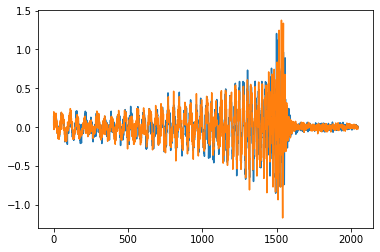

In [26]:
plt.plot(s1[0,5,:2048].numpy().squeeze())
plt.plot(s1[1,5,:2048].numpy().squeeze())

In [105]:
import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)
from pycbc.filter import match, overlap
from pycbc.types.timeseries import TimeSeries, FrequencySeries
import seaborn as sns

def plot_samples(i, signal, strain_data, mean_signal, psd, mass1, mass2, snr, ecc, lower_bound_90, upper_bound_90, lower_bound_50, upper_bound_50, before=0.8, after=0.2):

    palette_flare = sns.color_palette("flare", n_colors=6)
    palette_rocket = sns.color_palette("rocket", n_colors=6)    
    palette_crest = sns.color_palette("crest", n_colors=6)

    fig = plt.figure(figsize=(10,7))
    
    # Plot for decoded signals and pure_signals_cwb
    signal_axes = fig.add_subplot(211)

    max_index = np.argmax(signal)
    start_time =  -max_index/2048.0 
    end_time = 1.0 - max_index/2048.0

    before_index = max(max_index - int(before*2048),0)
    after_index = min(max_index + int(after*2048),2048)

    time = np.linspace(start_time, end_time, mean_preds.shape[1])

    time = time[before_index:after_index]

    time_buffer = 1
    sample_rate = 2048
    # Length of corresponding time series and frequency series
    tlen = int(sample_rate * time_buffer)
    flen = tlen // 2 + 1

    delta_f = 1.0 / time_buffer
    #    psd = aLIGOZeroDetHighPower(flen, delta_f, f_low)
    
    #    X_test_pure_cwb_ts = TimeSeries(pure_signals_cwb.squeeze(), delta_t = 1.0/1024)
    l1_signal_ts = TimeSeries(signal, delta_t = 1.0/2048)
    mean_signal_ts = TimeSeries(mean_signal, delta_t = 1.0/2048)
    psd = FrequencySeries(psd, delta_f=delta_f)

    #    X_test_pure_cwb_ts.resize(tlen)
    l1_signal_ts.resize(tlen)
    mean_signal_ts.resize(tlen)
    psd.resize(flen)

    mis_match = 1.0 - Overlap_calc(l1_signal_ts,mean_signal_ts,psd)

#    mass1 = f1['injection_parameters']['mass1'][i]
#    mass2 = f1['injection_parameters']['mass2'][i]
#    snr = l1_snr[i]

    strain_data = strain_data[before_index:after_index]
    signal = signal[before_index:after_index]
    mean_signal = mean_signal[before_index:after_index]
    lower_bound_90 = lower_bound_90[before_index:after_index]
    upper_bound_90 = upper_bound_90[before_index:after_index]

    lower_bound_50 = lower_bound_50[before_index:after_index]
    upper_bound_50 = upper_bound_50[before_index:after_index]

    signal_axes.plot(time, strain_data, label='Whitened strain', color='lightgrey', alpha=0.4)
#    signal_axes.plot(time, signal, label='Whitened injected waveform', color='tab:orange')
    signal_axes.plot(time, signal, label='Whitened injected waveform', color=palette_crest[3])
    signal_axes.plot(time, mean_signal, label='\\texttt{AWaRe} reconstruction', color=palette_flare[1])

    signal_axes.fill_between(time,lower_bound_50,upper_bound_50, color=palette_flare[1], alpha=0.7, label='\\texttt{AWaRe} 50\% C.I.')
    signal_axes.fill_between(time,lower_bound_90,upper_bound_90, color=palette_flare[1], alpha=0.5, label='\\texttt{AWaRe} 90\% C.I.')

#    signal_axes.plot(time, signal, label='Whitened injected waveform', color=palette_crest[3])
#    signal_axes.plot(time, mean_signal, label='\\texttt{AWaRe} reconstruction', color='red', linestyle='dashed')

    #plt.plot(time, mean_preds[1], label='\\texttt{AWaRe} SEOBNRv4PHM', color='red')
    #plt.plot(time, mean_preds[2], label='\\texttt{AWaRe} NRHybSur3dq8', color='red')

#    signal_axes.fill_between(time,lower_bound,upper_bound, color='lightpink', label='\\texttt{AWaRe} 90\% C.I.', alpha=0.5)

#    signal_axes.set_title('Mass_1 = {mass1}, Mass_2 = {mass2}, SNR = {snr}, Eccentricity = {ecc}, Mis-match = {mis_match}'.format(mass1=np.round(mass1,2),mass2=np.round(mass2,2),snr=np.round(snr,2), ecc=np.round(ecc,2),mis_match=np.round(mis_match,2)))    
    signal_axes.set_ylabel('Rescaled amplitudes', fontsize=15)
    signal_axes.set_xlabel('Time from merger (s)', fontsize=15)
    signal_axes.tick_params(axis='y', labelsize=15)
    signal_axes.tick_params(axis='x', labelsize=15)
    signal_axes.legend(loc='lower left', fontsize=12)

    return time, mean_signal, lower_bound_50, upper_bound_50, lower_bound_90, upper_bound_90

#    plt.savefig('Paper_plots_uncertainty/Eccentricity_tests/Plot_'+str(i)+'.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)

#    return mis_match


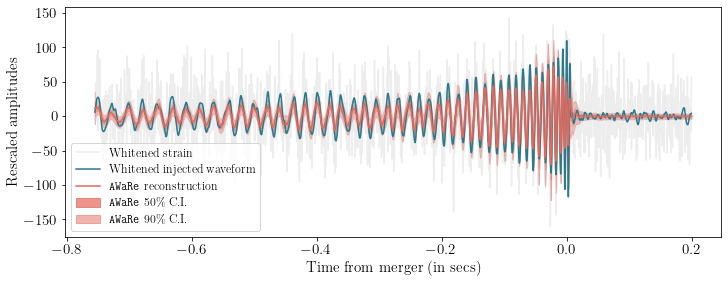

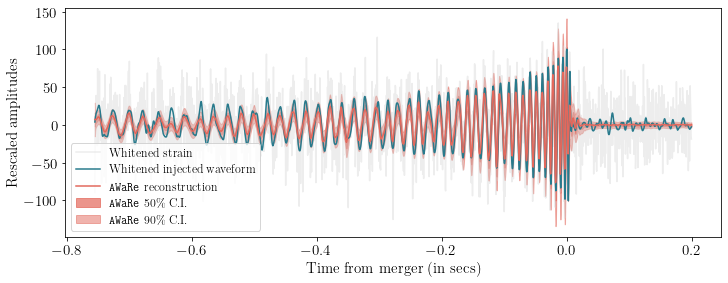

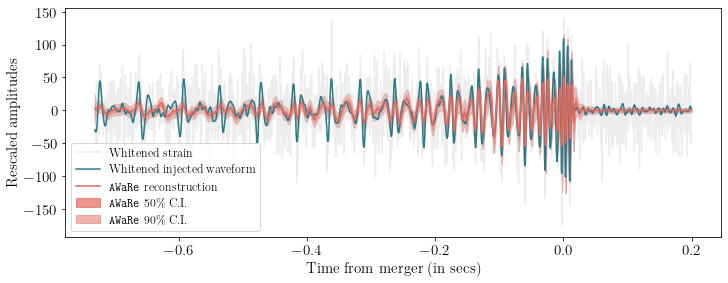

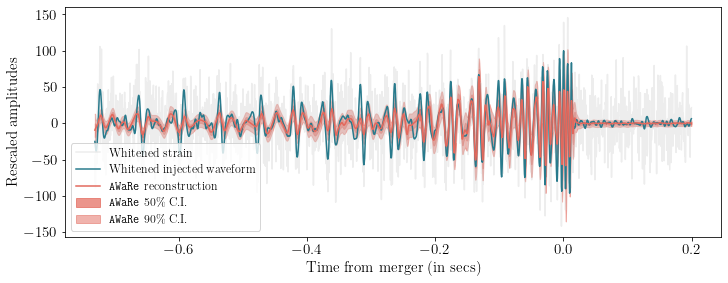

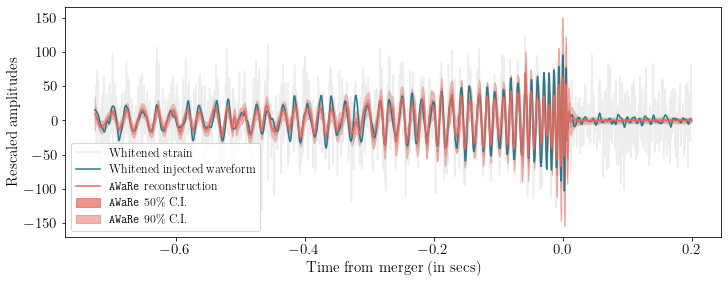

...

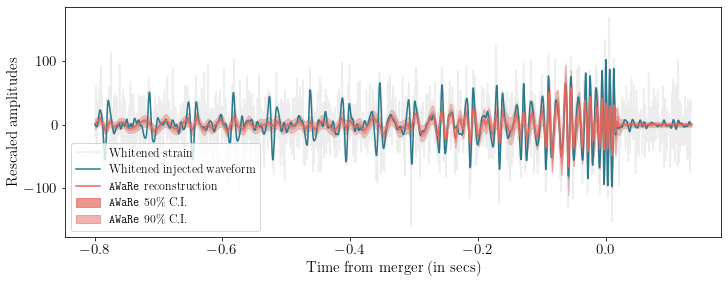

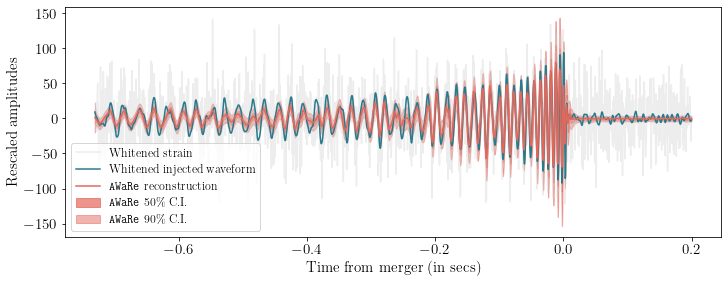

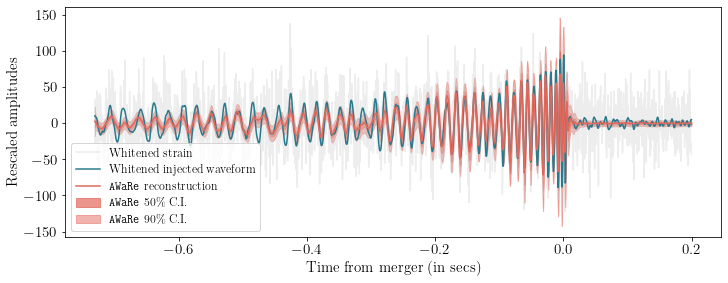

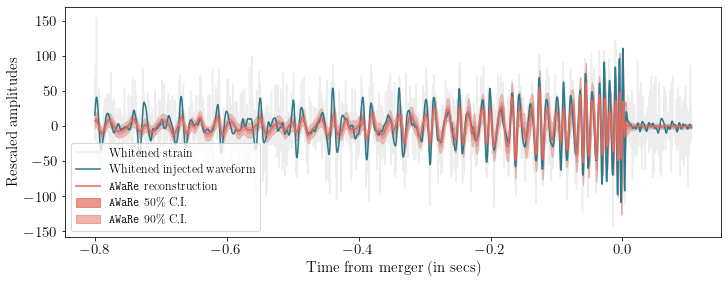

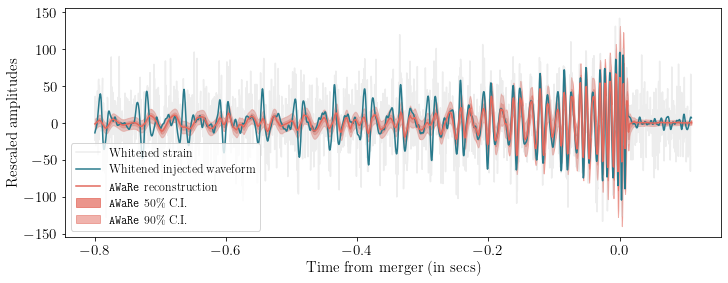

In [26]:
for i in range(0,100,5):

    mass1 = f1['injection_parameters']['mass1'][i]
    mass2 = f1['injection_parameters']['mass2'][i]
    strain_data = l1_strain_data[i]
    snr = l1_snr[i]
    ecc = eccentricity[i]
    psd = f1['injection_parameters']['psd_noise_l1'][i]
    signal = l1_signal[i]
    mean_signal = mean_preds[i]*100
    lower_90 = lower_bound_90[i]*100
    upper_90 = upper_bound_90[i]*100
    lower_50 = lower_bound_50[i]*100
    upper_50 = upper_bound_50[i]*100

    plot_samples(i, signal.astype('float64'), strain_data.astype('float64'), mean_signal.astype('float64'), psd.astype('float64'), mass1, mass2, snr, ecc, lower_90.astype('float64'), upper_90.astype('float64'),lower_50.astype('float64'), upper_50.astype('float64'))

#plot_samples(i, signal.astype('float64'), mean_signal.astype('float64'), psd.astype('float64'), mass1, mass2, snr, ecc, lower.astype('float64'), upper.astype('float64'))


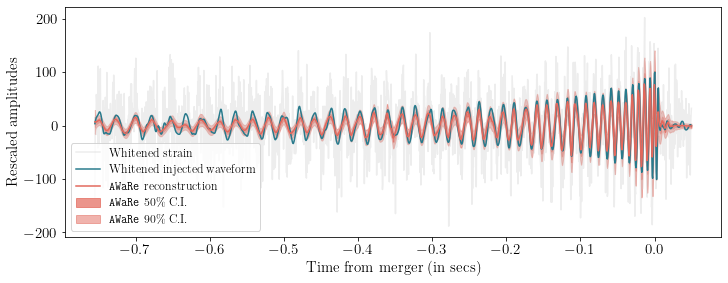

In [56]:
mass1 = f1['injection_parameters']['mass1'][5]
mass2 = f1['injection_parameters']['mass2'][5]
strain_data = l1_strain_data[5]*1.5
snr = l1_snr[5]
ecc = eccentricity[5]
psd = f1['injection_parameters']['psd_noise_l1'][5]
signal = l1_signal[5]
mean_signal = mean_preds[5]*100
lower_90 = lower_bound_90[5]*100
upper_90 = upper_bound_90[5]*100
lower_50 = lower_bound_50[5]*100
upper_50 = upper_bound_50[5]*100

time, strain_example, l_50, u_50, l_90, u_90 = plot_samples(5, signal.astype('float64'), strain_data.astype('float64'), mean_signal.astype('float64'), psd.astype('float64'), mass1, mass2, snr, ecc, lower_90.astype('float64'), upper_90.astype('float64'), lower_50.astype('float64'), upper_50.astype('float64'), before=0.8, after=0.05)

#plt.savefig('Paper_plots_uncertainty/Example_plot.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)


In [50]:
import csv

filename = 'Example_data_td.csv'

# Writing the data into the file
with open(filename, 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(['Time', 'Strain', 'lower_50', 'upper_50', 'lower_90', 'upper_90'])  # Writing the header
    for c1, c2, c3, c4, c5, c6 in zip(time, strain_example, l_50, u_50, l_90, u_90):
        csvwriter.writerow([c1,c2,c3,c4,c5,c6])  # Writing data rows


In [53]:
from scipy.signal import welch

def plot_psd(mean_signal, injected_signal, strain, lower_90, upper_90, lower_50, upper_50, fs):
    """ Plot the power spectral density """

    palette_flare = sns.color_palette("flare", n_colors=6)
    palette_rocket = sns.color_palette("rocket", n_colors=6)    
    palette_crest = sns.color_palette("crest", n_colors=6)

    f, Pxx = welch(mean_signal, fs=fs, nperseg=1024)
    f1, Pxx1 = welch(injected_signal, fs=fs, nperseg=1024)
    f2, Pxx2 = welch(strain, fs=fs, nperseg=1024)
    f3, Pxx3 = welch(lower_50, fs=fs, nperseg=1024)
    f4, Pxx4 = welch(upper_50, fs=fs, nperseg=1024)
    f5, Pxx5 = welch(lower_90, fs=fs, nperseg=1024)
    f6, Pxx6 = welch(upper_90, fs=fs, nperseg=1024)

    fig = plt.figure(figsize=(10,7))

    plt.loglog(f, (Pxx), color=palette_flare[1], label='PSD of the reconstructed signal')
    plt.loglog(f1, (Pxx1), color=palette_crest[3], label='PSD of the injected signal')
    plt.loglog(f2, (Pxx2), color='lightgrey', label='PSD of the strain data')
    plt.fill_between(f3, Pxx3, Pxx4, color=palette_flare[1], alpha=0.7, label='50\% C.I.')
    plt.fill_between(f5, Pxx5, Pxx6, color=palette_flare[1], alpha=0.5, label='90\% C.I.')
    plt.xlim(20,1024)
    plt.ylim(1e-4)
    plt.xlabel('Frequency (Hz)', fontsize=15)
    plt.ylabel('PSD (1/$\sqrt{Hz}$)', fontsize=15)
    plt.grid(False)
    plt.tick_params(axis='y', labelsize=15)
    plt.tick_params(axis='x', labelsize=15)
    plt.legend(fontsize=12)
    plt.savefig('Paper_plots_uncertainty/Example_PSD.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)


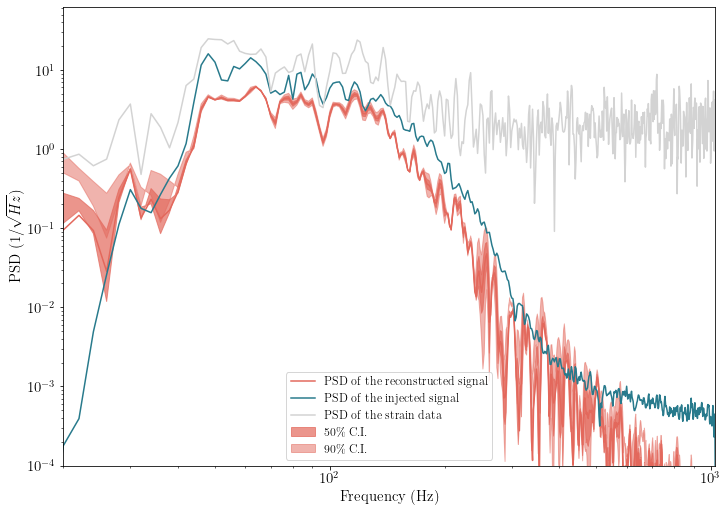

In [54]:
plot_psd(mean_signal, signal, strain_data, lower_90, upper_90, lower_50, upper_50, 2048)


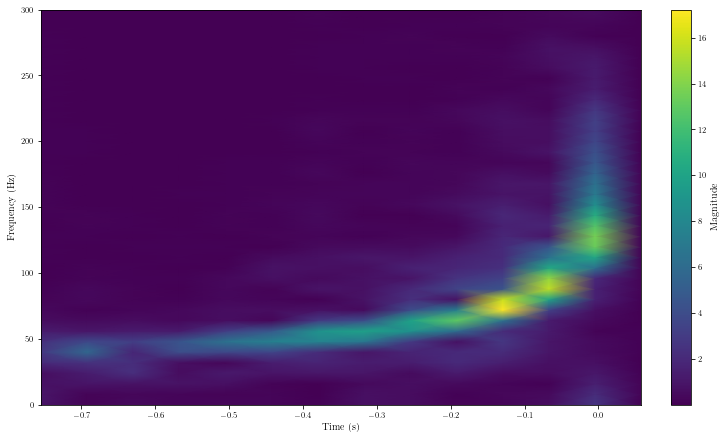

In [58]:
import pandas as pd

# Load the data from the uploaded CSV file
data_path = 'Example_data_td.csv'
strain_data_example = pd.read_csv(data_path)

from scipy.signal import stft

# Parameters for STFT
fs = 1 / (strain_data_example['Time'].iloc[1] - strain_data_example['Time'].iloc[0])  # Sampling frequency
nperseg = 256  # Number of points per segment

# Compute the Short-Time Fourier Transform (STFT) on the entire available data
frequencies, times, Zxx = stft(strain_data_example['Strain'].values, fs=fs, nperseg=nperseg)

# Calculate the magnitude of the STFT result
Zxx_magnitude = np.abs(Zxx)

# Plotting the spectrogram for the available data
plt.figure(figsize=(10, 6))
plt.pcolormesh(times + strain_data_example['Time'].iloc[0], frequencies, Zxx_magnitude, shading='gouraud', cmap='viridis')
plt.colorbar(label='Magnitude')
#plt.title('Frequency Evolution Over Time for Available Data')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Time (s)')
plt.ylim(0, 300)  # Limit frequency to 300 Hz as seen in the original plot
plt.show()


Time        0
Strain      0
lower_50    0
upper_50    0
lower_90    0
upper_90    0
dtype: int64


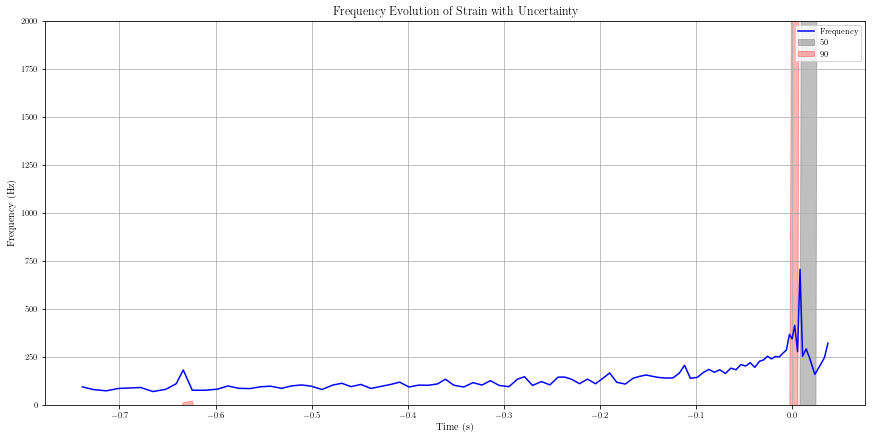

In [71]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import CubicSpline

# Load the data
data_path = 'Example_data_td.csv'  # Update the path
data = pd.read_csv(data_path)

# Check and handle NaN values
print(data.isna().sum())
data.dropna(inplace=True)

def find_zero_crossings(y, x):
    zero_crossings_indices = np.where(np.diff(np.sign(y)) != 0)[0]
    zero_crossings = []
    for i in zero_crossings_indices:
        if i + 1 < len(y):  # Ensure within bounds
            delta_y = y[i + 1] - y[i]
            if delta_y == 0:
                continue  # Avoid division by zero
            delta_x = x[i + 1] - x[i]
            zero_crossing = x[i] + (delta_x / delta_y) * (-y[i])
            zero_crossings.append(zero_crossing)
    return np.array(zero_crossings)

def calculate_frequency(x_zeros):
    if len(x_zeros) < 2:
        return np.array([]), np.array([])
    
    diffs = np.diff(x_zeros)
    if np.any(diffs <= 0):
        return np.array([]), np.array([])  # Avoid invalid frequency calculations
    
    frequencies = 1 / diffs
    mid_points = (x_zeros[:-1] + x_zeros[1:]) / 2
    return frequencies, mid_points

def interpolate_frequencies_cubic(source_mid_points, source_frequencies, target_mid_points):
    if len(source_mid_points) < 2:
        return np.array([np.nan] * len(target_mid_points))
    spline_function = CubicSpline(source_mid_points, source_frequencies, bc_type='natural')
    return spline_function(target_mid_points)

def process_data(column):
    x_zeros = find_zero_crossings(data[column].values, data['Time'].values)
    return calculate_frequency(x_zeros)

# Process data for mean and confidence intervals
frequencies, mid_points = process_data('Strain')
lower_frequencies, lower_mid_points = process_data('lower_50')
upper_frequencies, upper_mid_points = process_data('upper_50')
lower_frequencies_90, lower_mid_points_90 = process_data('lower_90')
upper_frequencies_90, upper_mid_points_90 = process_data('upper_90')

# Interpolate lower and upper frequencies to match the mid_points of the main frequency data
interpolated_lower_frequencies = interpolate_frequencies_cubic(lower_mid_points, lower_frequencies, mid_points)
interpolated_upper_frequencies = interpolate_frequencies_cubic(upper_mid_points, upper_frequencies, mid_points)
interpolated_lower_frequencies_90 = interpolate_frequencies_cubic(lower_mid_points_90, lower_frequencies_90, mid_points)
interpolated_upper_frequencies_90 = interpolate_frequencies_cubic(upper_mid_points_90, upper_frequencies_90, mid_points)

# Plotting with the interpolated data
plt.figure(figsize=(12, 6))
plt.plot(mid_points, frequencies, label='Frequency', color='blue')
plt.fill_between(mid_points, -interpolated_lower_frequencies, -interpolated_upper_frequencies, color='gray', alpha=0.5, label='50% CI')
plt.fill_between(mid_points, -interpolated_lower_frequencies_90, -interpolated_upper_frequencies_90, color='red', alpha=0.3, label='90% CI')
plt.ylim(0,2000)
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.title('Frequency Evolution of Strain with Uncertainty')
plt.legend()
plt.grid(True)
plt.savefig('Paper_plots_uncertainty/Example_f(t).png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)


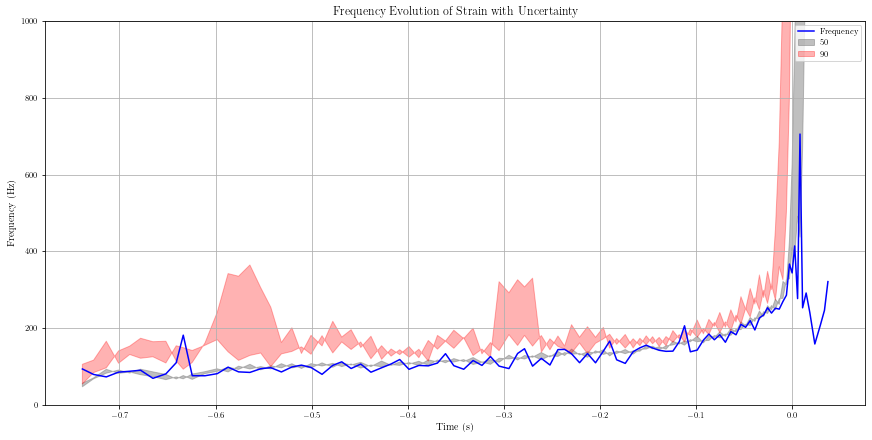

In [77]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Function to find zero crossings
def find_zero_crossings(y, x):
    zero_crossings_indices = np.where(np.diff(np.sign(y)) != 0)[0]
    zero_crossings = []
    for i in zero_crossings_indices:
        if i + 1 < len(y):  # Ensure within bounds
            delta_y = y[i + 1] - y[i]
            if delta_y == 0:
                continue  # Avoid division by zero
            delta_x = x[i + 1] - x[i]
            zero_crossing = x[i] + (delta_x / delta_y) * (-y[i])
            zero_crossings.append(zero_crossing)
    return np.array(zero_crossings)

# Function to calculate frequencies
def calculate_frequency(x_zeros):
    if len(x_zeros) < 2:
        return np.array([]), np.array([])
    diffs = np.diff(x_zeros)
    if np.any(diffs <= 0):
        return np.array([]), np.array([])  # Avoid invalid frequency calculations
    frequencies = 1 / diffs
    mid_points = (x_zeros[:-1] + x_zeros[1:]) / 2
    return frequencies, mid_points

# Function to interpolate frequencies to match given mid_points
def interpolate_frequencies(source_mid_points, source_frequencies, target_mid_points):
    if len(source_mid_points) < 2:  # Need at least two points to interpolate
        return np.array([np.nan] * len(target_mid_points))  # Return NaN array if not enough points
    interpolation_function = interp1d(source_mid_points, source_frequencies, bounds_error=False, fill_value="extrapolate")
    return interpolation_function(target_mid_points)

# Moving average function
def moving_average(data, window_size=5):
    return np.convolve(data, np.ones(window_size) / window_size, mode='same')  # mode changed to 'same' for uniform length

# Load your data
data_path = 'Example_data_td.csv'  # Update the path
data = pd.read_csv(data_path)

# Check and handle NaN values
data.dropna(inplace=True)

# Process data for mean and confidence intervals
def process_data(column):
    x_zeros = find_zero_crossings(data[column].values, data['Time'].values)
    return calculate_frequency(x_zeros)

# Fetch frequencies and mid-points
frequencies, mid_points = process_data('Strain')
lower_frequencies, lower_mid_points = process_data('lower_50')
upper_frequencies, upper_mid_points = process_data('upper_50')
lower_frequencies_90, lower_mid_points_90 = process_data('lower_90')
upper_frequencies_90, upper_mid_points_90 = process_data('upper_90')

# Interpolate lower and upper frequencies to match the mid_points of the main frequency data
interpolated_lower_frequencies = interpolate_frequencies(lower_mid_points, lower_frequencies, mid_points)
interpolated_upper_frequencies = interpolate_frequencies(upper_mid_points, upper_frequencies, mid_points)
interpolated_lower_frequencies_90 = interpolate_frequencies(lower_mid_points_90, lower_frequencies_90, mid_points)
interpolated_upper_frequencies_90 = interpolate_frequencies(upper_mid_points_90, upper_frequencies_90, mid_points)

# Apply moving average to smooth the CI data
smoothed_lower_CI = moving_average(interpolated_lower_frequencies, window_size=5)
smoothed_upper_CI = moving_average(interpolated_upper_frequencies, window_size=5)
smoothed_lower_CI_90 = moving_average(interpolated_lower_frequencies_90, window_size=5)
smoothed_upper_CI_90 = moving_average(interpolated_upper_frequencies_90, window_size=5)

# Plotting with the interpolated and smoothed data
plt.figure(figsize=(12, 6))
plt.plot(mid_points, frequencies, label='Frequency', color='blue')
plt.fill_between(mid_points, smoothed_lower_CI, smoothed_upper_CI, color='gray', alpha=0.5, label='50% CI')
plt.fill_between(mid_points, smoothed_lower_CI_90, smoothed_upper_CI_90, color='red', alpha=0.3, label='90% CI')
plt.ylim(0,1000)
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.title('Frequency Evolution of Strain with Uncertainty')
plt.legend()
plt.grid(True)
plt.show()


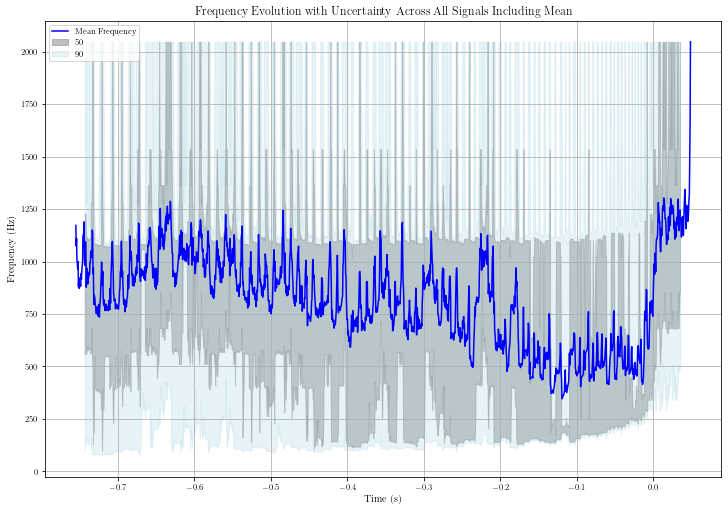

In [78]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import interp1d

# Assuming 'distribution', 'before_index', 'after_index', 'strain_example', and 'time' are defined elsewhere
# Sample strain signals
s1 = distribution.sample(100)
example_reconstruction = s1[:, 5, :2048].numpy().squeeze()
example_reconstructions = example_reconstruction[:, before_index:after_index]

mean_strain = strain_example
mean_time = time

# Include mean signal in the array of signals
example_reconstructions = np.vstack([mean_strain[None, :], example_reconstructions])

def find_zero_crossings(y, x):
    crossings = np.where(np.diff(np.sign(y)))[0]
    if len(crossings) > 1:
        return x[crossings]
    else:
        return np.array([])

def calculate_frequencies(y, x):
    crossings = find_zero_crossings(y, x)
    if len(crossings) > 1:
        intervals = crossings[1:] - crossings[:-1]
        return 1 / intervals, crossings[:-1]  # Return frequencies and mid-points of intervals
    else:
        return np.array([]), np.array([])

all_frequencies = []
all_times = []

for strain in example_reconstructions:
    freqs, times = calculate_frequencies(strain, mean_time)
    if len(freqs) > 0:
        all_frequencies.append(freqs)
        all_times.append(times)

# Combine and sort all times from all signals
all_times_combined = np.unique(np.concatenate(all_times))

def custom_interpolate(times, frequencies, full_times):
    freq_dict = dict(zip(times, frequencies))
    full_frequencies = []
    
    for t in full_times:
        if t in freq_dict:
            full_frequencies.append(freq_dict[t])
        else:
            before = [time for time in times if time < t]
            after = [time for time in times if time > t]
            
            if before and after:
                nearest_before = max(before)
                nearest_after = min(after)
                interpolated_freq = (freq_dict[nearest_before] + freq_dict[nearest_after]) / 2
                full_frequencies.append(interpolated_freq)
            else:
                full_frequencies.append(np.nan)
    
    return np.array(full_frequencies)

# Interpolate all frequencies at all times
interpolated_frequencies = [custom_interpolate(times, freqs, all_times_combined) for times, freqs in zip(all_times, all_frequencies)]

# Convert list of arrays into a 2D NumPy array
frequencies_array = np.array(interpolated_frequencies)

# Calculate mean and confidence intervals
mean_frequencies = np.nanmean(frequencies_array, axis=0)
ci_50 = np.percentile(frequencies_array, [25, 75], axis=0)
ci_90 = np.percentile(frequencies_array, [5, 95], axis=0)

# Plotting
plt.figure(figsize=(10, 7))
plt.plot(all_times_combined, mean_frequencies, label='Mean Frequency', color='blue')
plt.fill_between(all_times_combined, ci_50[0], ci_50[1], color='gray', alpha=0.5, label='50% CI')
plt.fill_between(all_times_combined, ci_90[0], ci_90[1], color='lightblue', alpha=0.3, label='90% CI')
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.title('Frequency Evolution with Uncertainty Across All Signals Including Mean')
plt.legend()
plt.grid(True)
plt.show()


In [25]:
import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)
from pycbc.filter import match, overlap
from pycbc.types.timeseries import TimeSeries, FrequencySeries

def get_mismatch(signal, mean_signal, psd):

    time_buffer = 1
    sample_rate = 2048
    # Length of corresponding time series and frequency series
    tlen = int(sample_rate * time_buffer)
    flen = tlen // 2 + 1

    delta_f = 1.0 / time_buffer
    #    psd = aLIGOZeroDetHighPower(flen, delta_f, f_low)
    
    #    X_test_pure_cwb_ts = TimeSeries(pure_signals_cwb.squeeze(), delta_t = 1.0/1024)
    l1_signal_ts = TimeSeries(signal, delta_t = 1.0/2048)
    mean_signal_ts = TimeSeries(mean_signal, delta_t = 1.0/2048)
    psd = FrequencySeries(psd, delta_f=delta_f)

    #    X_test_pure_cwb_ts.resize(tlen)
    l1_signal_ts.resize(tlen)
    mean_signal_ts.resize(tlen)
    psd.resize(flen)

    mis_match = 1.0 - Overlap_calc(l1_signal_ts,mean_signal_ts,psd)

    return mis_match


In [26]:
mismatch = []

for i in range(1000):

    mass1 = f1['injection_parameters']['mass1'][i]
    mass2 = f1['injection_parameters']['mass2'][i]
    snr = l1_snr[i]
    psd = f1['injection_parameters']['psd_noise_l1'][i]
    signal = l1_signal[i]
    mean_signal = mean_preds[i]*100
    lower = lower_bound[i]*100
    upper = upper_bound[i]*100

    mismatch.append(get_mismatch(signal.astype('float64'), mean_signal.astype('float64'), psd.astype('float64')))


In [27]:
mismatch = np.array(mismatch)
mismatch = mismatch.reshape(100,10)

ecc_mean = eccentricity.reshape(100,10).mean(axis=1)

In [28]:
mean_mismatch = mismatch.mean(axis=1)
std_mismatch = mismatch.std(axis=1)

In [29]:
import csv

filename = '/fred/oz016/Chayan/GW-Denoiser/notebooks/Paper_plots_uncertainty/Eccentricity_tests/Eccentricity_mismatch_data.csv'

# Writing the data into the file
with open(filename, 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(['Eccentricity', 'Mean Mismatch', 'STD'])  # Writing the header
    for c1, c2, c3 in zip(ecc_mean, mean_mismatch, std_mismatch):
        csvwriter.writerow([c1,c2,c3])  # Writing data rows



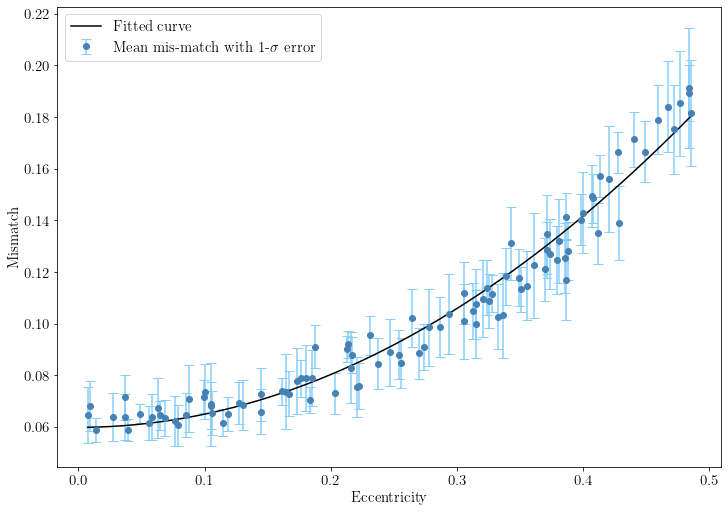

In [62]:
import pandas as pd
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)
# Create a figure with GridSpec layout
#fig = plt.figure(figsize=(8, 7))
#gs = gridspec.GridSpec(2, 2, width_ratios=[5, 1], height_ratios=[1, 5], hspace=0.05, wspace=0.05)
# Define the color palettes
#palette_flare = sns.color_palette("flare", n_colors=5)
#palette_crest = sns.color_palette("crest", n_colors=5)

# Main scatter plot
fig, ax = plt.subplots(figsize=(10, 7))
#cmap = sns.color_palette("flare", as_cmap=True)

# Load the data
file_path = '/fred/oz016/Chayan/GW-Denoiser/notebooks/Paper_plots_uncertainty/Eccentricity_tests/Eccentricity_mismatch_data.csv'
data = pd.read_csv(file_path)

# Extract the SNR, mean mismatch, and the standard deviation of mismatch
eccentricity = data.iloc[:,0].values
mean_mismatch = data.iloc[:,1].values
std_dev_mismatch = data.iloc[:,2].values

# Define the model: let's start with an exponential decay function
def model(x, a, c):
    return a * x**2 + c

# Fit the curve
params, covariance = curve_fit(model, eccentricity, mean_mismatch)

# Generate a sequence of SNR values for plotting the fitted curve
ecc_fit = np.linspace(min(eccentricity), max(eccentricity), 200)
fitted_curve = model(ecc_fit, *params)

# Create a simple error bar plot
#plt.fill_between(l1_snr_mean, lower_std, upper_std, color='gray', alpha=0.2)
ax.errorbar(eccentricity, mean_mismatch, yerr=std_dev_mismatch, color='steelblue', fmt='o', capsize=5, capthick=1, ecolor='lightskyblue', label='Mean mis-match with 1-$\sigma$ error')
plt.plot(ecc_fit, fitted_curve, label='Fitted curve', color='black')
#ax.errorbar(l1_snr_mean, mean_mismatch, yerr=std_mismatch, fmt='o', color='lightblue', ecolor='lightgray', elinewidth=3, capsize=0)
#plt.title('Error Bar Plot')
ax.set_ylabel('Mismatch', fontsize=15)
ax.set_xlabel('Eccentricity', fontsize=15)
ax.tick_params(axis='both', labelsize=15)
plt.legend(fontsize=15)
plt.savefig('Paper_plots_uncertainty/Eccentricity_tests/Eccentricity_convergence_mismatch.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)

#plt.xlabel('SNR')
#plt.ylabel('Mismatch')
#plt.grid(True)


# Plot the data and the fitted curve
#plt.figure(figsize=(10, 6))
#plt.errorbar(SNR, mean_mismatch, yerr=std_dev_mismatch, fmt='o', label='Data with standard deviation')
#plt.plot(SNR_fit, fitted_curve, label='Fitted curve', color='red')
#plt.xlabel('Injected SNR')
#plt.ylabel('Mismatch')
#plt.title('Curve Fitting: Mismatch vs. Injected SNR')
#plt.legend()
#plt.show()


# Eccentricity test - SNR-12

In [127]:
import h5py

f1 = h5py.File('/fred/oz016/Chayan/samplegen_old/output/O3b_test_EccentricTD_convergence_SNR-12.hdf', 'r')

l1_strain = f1['injection_samples']['l1_strain'][()]
l1_signal = f1['injection_parameters']['l1_signal_whitened'][()]
l1_snr = f1['injection_parameters']['l1_snr'][()]*f1['injection_parameters']['scale_factor'][()]

eccentricity = f1['injection_parameters']['eccentricity'][()]


In [128]:
l1_strain_data = np.copy(l1_strain)

In [129]:
strain, maximum, minimum = _preprocess_data(l1_strain, l1_strain.shape[0], 2048)
strain = np.array(strain)
strain.shape


(1000, 2048)

In [130]:
X_test_strain = reshape_sequences(strain.shape[0], strain)
X_test_pure_signal = reshape_sequences(l1_signal.shape[0], l1_signal)


In [131]:
# Reshape arrays to fit into Keras model
X_test_strain = X_test_strain[:,:,:,None]
print('x_test_strain shape:', X_test_strain.shape)
X_test_strain = X_test_strain.astype("float32")

X_test_pure_signal = X_test_pure_signal[:,:,:,None]
print('x_test_pure_signal shape:', X_test_pure_signal.shape)
X_test_pure_signal = X_test_pure_signal.astype("float32")


x_test_strain shape: (1000, 2058, 10, 1)
x_test_pure_signal shape: (1000, 2058, 10, 1)


In [132]:
distribution = model(X_test_strain)
    
# Extract mean and standard deviation from the distribution
mean_preds = distribution.mean()
std_preds = distribution.stddev()
 
mean_preds = mean_preds.numpy().squeeze()
std_preds = std_preds.numpy().squeeze()

# Calculate the upper and lower bounds of the 2-standard deviation interval
lower_bound = mean_preds - 1.645 * std_preds
upper_bound = mean_preds + 1.645 * std_preds

In [133]:
mean_preds = mean_preds[:,0:2048]

lower_bound = lower_bound[:,0:2048]
upper_bound = upper_bound[:,0:2048]

In [136]:
import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)
from pycbc.filter import match, overlap
from pycbc.types.timeseries import TimeSeries, FrequencySeries

def plot_samples(i, signal, strain_data, mean_signal, psd, mass1, mass2, snr, ecc, lower_bound, upper_bound):

    palette_flare = sns.color_palette("flare", n_colors=6)
    palette_rocket = sns.color_palette("rocket", n_colors=6)    
    palette_crest = sns.color_palette("crest", n_colors=6)

    fig = plt.figure(figsize=(10,7))
    
    # Plot for decoded signals and pure_signals_cwb
    signal_axes = fig.add_subplot(211)

    time = np.linspace(-0.8, 0.2, mean_preds.shape[1])

    time_buffer = 1
    sample_rate = 2048
    # Length of corresponding time series and frequency series
    tlen = int(sample_rate * time_buffer)
    flen = tlen // 2 + 1

    delta_f = 1.0 / time_buffer
    #    psd = aLIGOZeroDetHighPower(flen, delta_f, f_low)
    
    #    X_test_pure_cwb_ts = TimeSeries(pure_signals_cwb.squeeze(), delta_t = 1.0/1024)
    l1_signal_ts = TimeSeries(signal, delta_t = 1.0/2048)
    mean_signal_ts = TimeSeries(mean_signal, delta_t = 1.0/2048)
    psd = FrequencySeries(psd, delta_f=delta_f)

    #    X_test_pure_cwb_ts.resize(tlen)
    l1_signal_ts.resize(tlen)
    mean_signal_ts.resize(tlen)
    psd.resize(flen)

    mis_match = 1.0 - Overlap_calc(l1_signal_ts,mean_signal_ts,psd)

#    mass1 = f1['injection_parameters']['mass1'][i]
#    mass2 = f1['injection_parameters']['mass2'][i]
#    snr = l1_snr[i]

    signal_axes.plot(time, strain_data, label='Whitened strain', color='lightgrey', alpha=0.5)
    signal_axes.plot(time, signal, label='Whitened injected waveform', color=palette_crest[3])
    signal_axes.plot(time, mean_signal, label='\\texttt{AWaRe} reconstruction', color=palette_flare[1], linestyle='dashed')

    signal_axes.fill_between(time,lower_bound,upper_bound, color=palette_flare[0], label='\\texttt{AWaRe} 90\% C.I.')


    signal_axes.set_title('Mass_1 = {mass1}, Mass_2 = {mass2}, SNR = {snr}, Eccentricity = {ecc}, Mis-match = {mis_match}'.format(mass1=np.round(mass1,2),mass2=np.round(mass2,2),snr=np.round(snr,2), ecc=np.round(ecc,2),mis_match=np.round(mis_match,2)))    
    signal_axes.set_ylabel('Rescaled amplitudes', fontsize=15)
    signal_axes.set_xlabel('Time from merger (in secs)', fontsize=15)
    signal_axes.tick_params(axis='y', labelsize=15)
    signal_axes.tick_params(axis='x', labelsize=15)
    signal_axes.legend(loc='lower left', fontsize=12)

#    plt.savefig('Paper_plots_uncertainty/Eccentricity_test_SNR-12/Plot_'+str(i)+'.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)

#    return mis_match


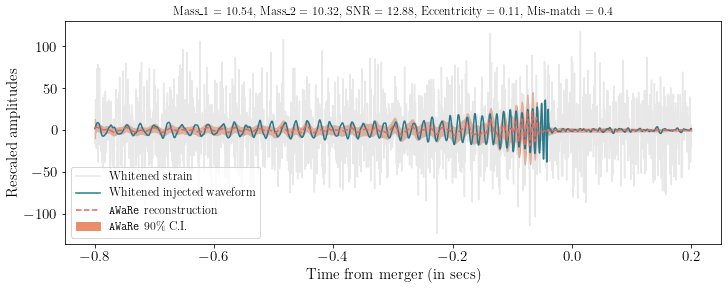

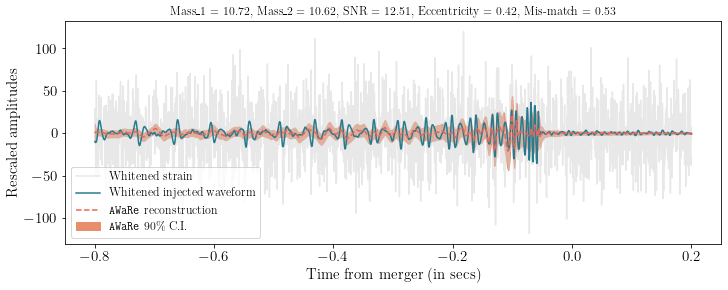

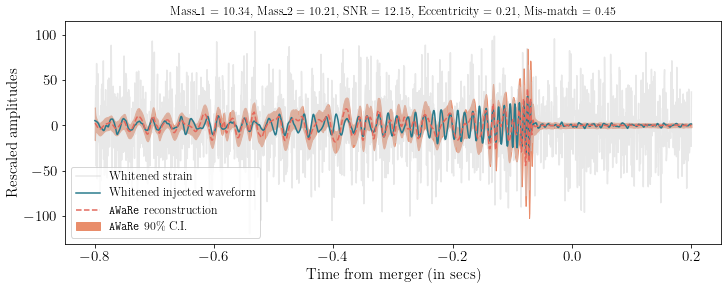

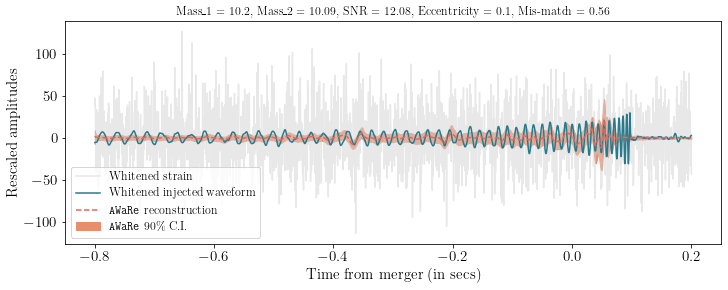

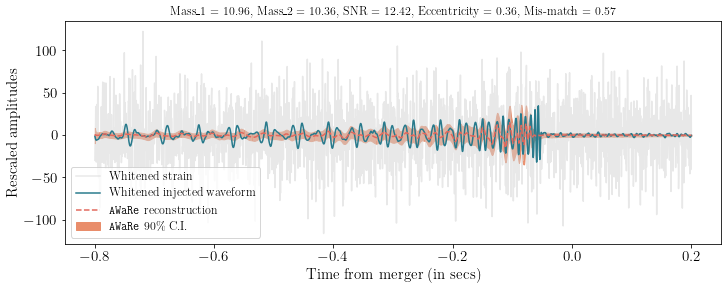

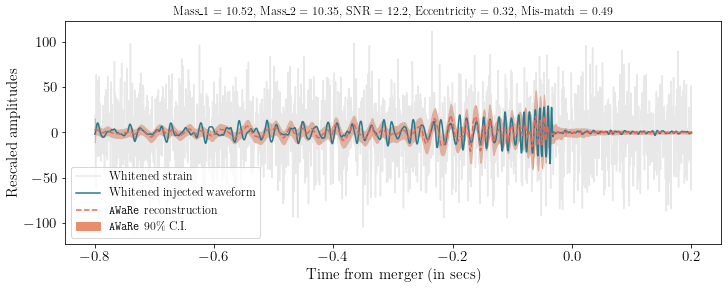

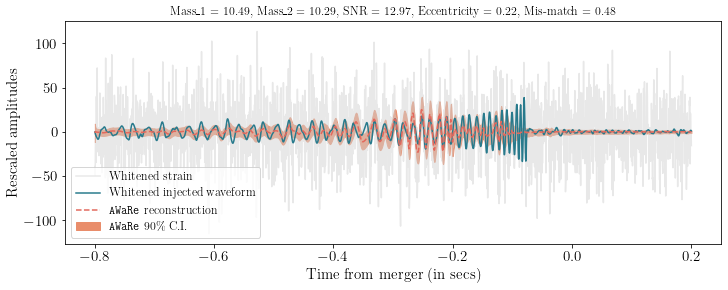

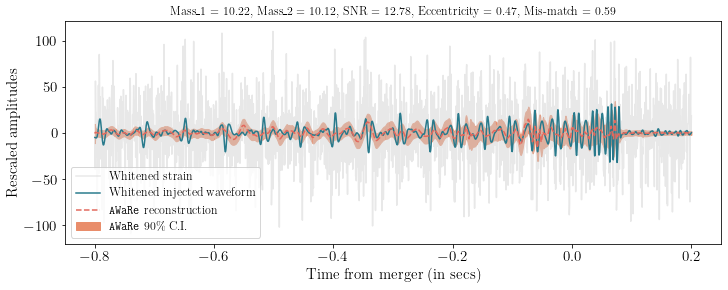

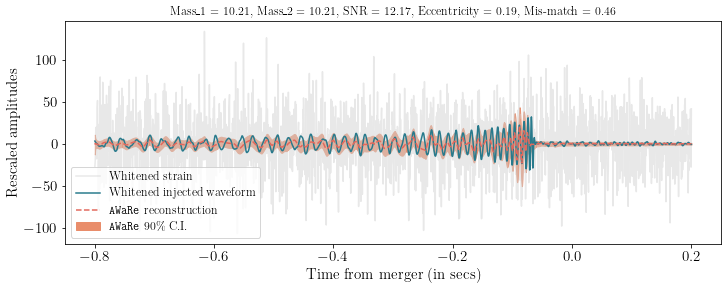

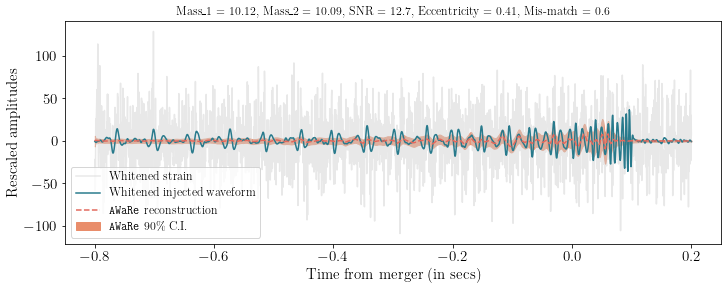

In [137]:
for i in range(0,100,10):

    mass1 = f1['injection_parameters']['mass1'][i]
    mass2 = f1['injection_parameters']['mass2'][i]
    strain = l1_strain_data[i]
    snr = l1_snr[i]
    ecc = eccentricity[i]
    psd = f1['injection_parameters']['psd_noise_l1'][i]
    signal = l1_signal[i]
    mean_signal = mean_preds[i]*100
    lower = lower_bound[i]*100
    upper = upper_bound[i]*100

    plot_samples(i, signal.astype('float64'), strain.astype('float64'), mean_signal.astype('float64'), psd.astype('float64'), mass1, mass2, snr, ecc, lower.astype('float64'), upper.astype('float64'))


In [40]:
import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)
from pycbc.filter import match, overlap
from pycbc.types.timeseries import TimeSeries, FrequencySeries

def get_mismatch(signal, mean_signal, psd):

    time_buffer = 1
    sample_rate = 2048
    # Length of corresponding time series and frequency series
    tlen = int(sample_rate * time_buffer)
    flen = tlen // 2 + 1

    delta_f = 1.0 / time_buffer
    #    psd = aLIGOZeroDetHighPower(flen, delta_f, f_low)
    
    #    X_test_pure_cwb_ts = TimeSeries(pure_signals_cwb.squeeze(), delta_t = 1.0/1024)
    l1_signal_ts = TimeSeries(signal, delta_t = 1.0/2048)
    mean_signal_ts = TimeSeries(mean_signal, delta_t = 1.0/2048)
    psd = FrequencySeries(psd, delta_f=delta_f)

    #    X_test_pure_cwb_ts.resize(tlen)
    l1_signal_ts.resize(tlen)
    mean_signal_ts.resize(tlen)
    psd.resize(flen)

    mis_match = 1.0 - Overlap_calc(l1_signal_ts,mean_signal_ts,psd)

    return mis_match


In [41]:
mismatch = []

for i in range(1000):

    mass1 = f1['injection_parameters']['mass1'][i]
    mass2 = f1['injection_parameters']['mass2'][i]
    snr = l1_snr[i]
    psd = f1['injection_parameters']['psd_noise_l1'][i]
    signal = l1_signal[i]
    mean_signal = mean_preds[i]*100
    lower = lower_bound[i]*100
    upper = upper_bound[i]*100

    mismatch.append(get_mismatch(signal.astype('float64'), mean_signal.astype('float64'), psd.astype('float64')))


In [42]:
mismatch = np.array(mismatch)
mismatch = mismatch.reshape(100,10)

ecc_mean = eccentricity.reshape(100,10).mean(axis=1)

mean_mismatch = mismatch.mean(axis=1)
std_mismatch = mismatch.std(axis=1)

In [43]:
import csv

filename = '/fred/oz016/Chayan/GW-Denoiser/notebooks/Paper_plots_uncertainty/Eccentricity_test_SNR-12/Eccentricity_mismatch_data_SNR-12.csv'

# Writing the data into the file
with open(filename, 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(['Eccentricity', 'Mean Mismatch', 'STD'])  # Writing the header
    for c1, c2, c3 in zip(ecc_mean, mean_mismatch, std_mismatch):
        csvwriter.writerow([c1,c2,c3])  # Writing data rows



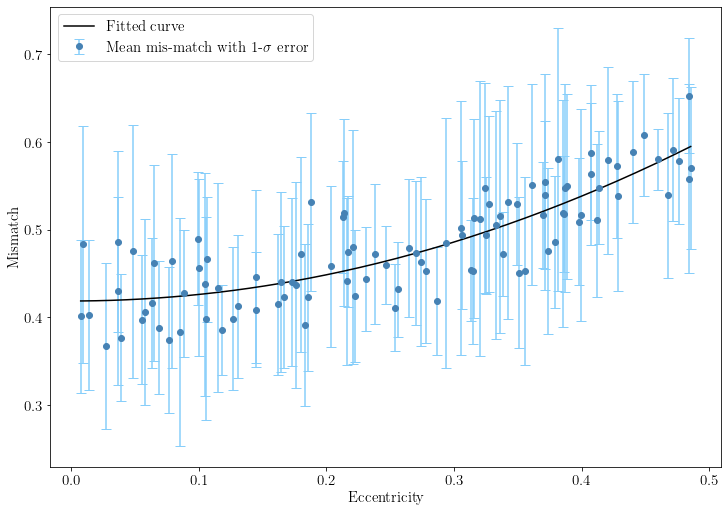

In [23]:
import pandas as pd
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)
# Create a figure with GridSpec layout
#fig = plt.figure(figsize=(8, 7))
#gs = gridspec.GridSpec(2, 2, width_ratios=[5, 1], height_ratios=[1, 5], hspace=0.05, wspace=0.05)
# Define the color palettes
#palette_flare = sns.color_palette("flare", n_colors=5)
#palette_crest = sns.color_palette("crest", n_colors=5)

# Main scatter plot
fig, ax = plt.subplots(figsize=(10, 7))
#cmap = sns.color_palette("flare", as_cmap=True)

# Load the data
file_path = '/fred/oz016/Chayan/GW-Denoiser/notebooks/Paper_plots_uncertainty/Eccentricity_test_SNR-12/Eccentricity_mismatch_data_SNR-12.csv'
data = pd.read_csv(file_path)

# Extract the SNR, mean mismatch, and the standard deviation of mismatch
eccentricity = data.iloc[:,0].values
mean_mismatch = data.iloc[:,1].values
std_dev_mismatch = data.iloc[:,2].values

# Define the model: let's start with an exponential decay function
def model(x, a, c):
    return a * x**2 + c

# Fit the curve
params, covariance = curve_fit(model, eccentricity, mean_mismatch)

# Generate a sequence of SNR values for plotting the fitted curve
ecc_fit = np.linspace(min(eccentricity), max(eccentricity), 200)
fitted_curve = model(ecc_fit, *params)

# Create a simple error bar plot
#plt.fill_between(l1_snr_mean, lower_std, upper_std, color='gray', alpha=0.2)
ax.errorbar(eccentricity, mean_mismatch, yerr=std_dev_mismatch, color='steelblue', fmt='o', capsize=5, capthick=1, ecolor='lightskyblue', label='Mean mis-match with 1-$\sigma$ error')
plt.plot(ecc_fit, fitted_curve, label='Fitted curve', color='black')
#ax.errorbar(l1_snr_mean, mean_mismatch, yerr=std_mismatch, fmt='o', color='lightblue', ecolor='lightgray', elinewidth=3, capsize=0)
#plt.title('Error Bar Plot')
ax.set_ylabel('Mismatch', fontsize=15)
ax.set_xlabel('Eccentricity', fontsize=15)
ax.tick_params(axis='both', labelsize=15)
plt.legend(fontsize=15)
plt.savefig('Paper_plots_uncertainty/Eccentricity_test_SNR-12/Eccentricity_convergence_mismatch_SNR-12.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)

#plt.xlabel('SNR')
#plt.ylabel('Mismatch')
#plt.grid(True)


# Plot the data and the fitted curve
#plt.figure(figsize=(10, 6))
#plt.errorbar(SNR, mean_mismatch, yerr=std_dev_mismatch, fmt='o', label='Data with standard deviation')
#plt.plot(SNR_fit, fitted_curve, label='Fitted curve', color='red')
#plt.xlabel('Injected SNR')
#plt.ylabel('Mismatch')
#plt.title('Curve Fitting: Mismatch vs. Injected SNR')
#plt.legend()
#plt.show()


# Eccentricity test - SNR -12, mass - 30

In [2]:
import h5py

f1 = h5py.File('/fred/oz016/Chayan/samplegen_old/output/O3b_test_EccentricTD_convergence_mass-30_SNR-12.hdf', 'r')

l1_strain = f1['injection_samples']['l1_strain'][()]
l1_signal = f1['injection_parameters']['l1_signal_whitened'][()]
l1_snr = f1['injection_parameters']['l1_snr'][()]*f1['injection_parameters']['scale_factor'][()]

eccentricity = f1['injection_parameters']['eccentricity'][()]


In [3]:
l1_strain_data = np.copy(l1_strain)

In [10]:
strain, maximum, minimum = _preprocess_data(l1_strain, l1_strain.shape[0], 2048)
strain = np.array(strain)
strain.shape


(1000, 2048)

In [11]:
X_test_strain = reshape_sequences(strain.shape[0], strain)
X_test_pure_signal = reshape_sequences(l1_signal.shape[0], l1_signal)


In [12]:
# Reshape arrays to fit into Keras model
X_test_strain = X_test_strain[:,:,:,None]
print('x_test_strain shape:', X_test_strain.shape)
X_test_strain = X_test_strain.astype("float32")

X_test_pure_signal = X_test_pure_signal[:,:,:,None]
print('x_test_pure_signal shape:', X_test_pure_signal.shape)
X_test_pure_signal = X_test_pure_signal.astype("float32")


x_test_strain shape: (1000, 2058, 10, 1)
x_test_pure_signal shape: (1000, 2058, 10, 1)


In [16]:
distribution = model(X_test_strain)
    
# Extract mean and standard deviation from the distribution
mean_preds = distribution.mean()
std_preds = distribution.stddev()
 
mean_preds = mean_preds.numpy().squeeze()
std_preds = std_preds.numpy().squeeze()

# Calculate the upper and lower bounds of the 2-standard deviation interval
lower_bound_90 = mean_preds - 1.645 * std_preds
upper_bound_90 = mean_preds + 1.645 * std_preds

lower_bound_50 = mean_preds - 0.6745 * std_preds
upper_bound_50 = mean_preds + 0.6745 * std_preds

In [17]:
mean_preds = mean_preds[:,0:2048]

lower_bound_90 = lower_bound_90[:,0:2048]
upper_bound_90 = upper_bound_90[:,0:2048]

lower_bound_50 = lower_bound_50[:,0:2048]
upper_bound_50 = upper_bound_50[:,0:2048]

In [23]:
f1 = h5py.File('Eccentricity_data.hdf', 'w')
f1.create_dataset('Mean_reconstruction', data=mean_preds*100)
f1.create_dataset('Lower_90', data=lower_bound_90*100)
f1.create_dataset('Lower_50', data=lower_bound_50*100)
f1.create_dataset('Upper_90', data=upper_bound_90*100)
f1.create_dataset('Upper_50', data=upper_bound_50*100)
f1.create_dataset('Injection_signal', data=l1_signal)
f1.create_dataset('Eccentricity', data=eccentricity)

f1.close()


AttributeError: 'File' object has no attribute 'create_datasset'

In [47]:
import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)
from pycbc.filter import match, overlap
from pycbc.types.timeseries import TimeSeries, FrequencySeries
import seaborn as sns

def plot_samples(i, signal, strain_data, mean_signal, psd, mass1, mass2, snr, ecc, lower_bound_90, upper_bound_90, lower_bound_50, upper_bound_50, before=0.8, after=0.2):

    palette_flare = sns.color_palette("flare", n_colors=6)
    palette_rocket = sns.color_palette("rocket", n_colors=6)    
    palette_crest = sns.color_palette("crest", n_colors=6)

    fig = plt.figure(figsize=(8,6))
    
    # Plot for decoded signals and pure_signals_cwb
    signal_axes = fig.add_subplot(211)

    max_index = np.argmax(signal)
    start_time =  -max_index/2048.0 
    end_time = 1.0 - max_index/2048.0

    before_index = max(max_index - int(before*2048),0)
    after_index = min(max_index + int(after*2048),2048)

    time = np.linspace(start_time, end_time, mean_preds.shape[1])

    time = time[before_index:after_index]

    time_buffer = 1
    sample_rate = 2048
    # Length of corresponding time series and frequency series
    tlen = int(sample_rate * time_buffer)
    flen = tlen // 2 + 1

    delta_f = 1.0 / time_buffer
    #    psd = aLIGOZeroDetHighPower(flen, delta_f, f_low)
    
    #    X_test_pure_cwb_ts = TimeSeries(pure_signals_cwb.squeeze(), delta_t = 1.0/1024)
    l1_signal_ts = TimeSeries(signal, delta_t = 1.0/2048)
    mean_signal_ts = TimeSeries(mean_signal, delta_t = 1.0/2048)
    psd = FrequencySeries(psd, delta_f=delta_f)

    #    X_test_pure_cwb_ts.resize(tlen)
    l1_signal_ts.resize(tlen)
    mean_signal_ts.resize(tlen)
    psd.resize(flen)

    mis_match = 1.0 - Overlap_calc(l1_signal_ts,mean_signal_ts,psd)

#    mass1 = f1['injection_parameters']['mass1'][i]
#    mass2 = f1['injection_parameters']['mass2'][i]
#    snr = l1_snr[i]

    strain_data = strain_data[before_index:after_index]
    signal = signal[before_index:after_index]
    mean_signal = mean_signal[before_index:after_index]
    lower_bound_90 = lower_bound_90[before_index:after_index]
    upper_bound_90 = upper_bound_90[before_index:after_index]

    lower_bound_50 = lower_bound_50[before_index:after_index]
    upper_bound_50 = upper_bound_50[before_index:after_index]

    signal_axes.plot(time, strain_data, label='Whitened strain', color='lightgrey', alpha=0.4)
#    signal_axes.plot(time, signal, label='Whitened injected waveform', color='tab:orange')
    signal_axes.plot(time, signal, label='Whitened injected waveform', color=palette_crest[3])
    signal_axes.plot(time, mean_signal, label='\\texttt{AWaRe} reconstruction', color=palette_flare[1])

    signal_axes.fill_between(time,lower_bound_50,upper_bound_50, color=palette_flare[1], alpha=0.7, label='\\texttt{AWaRe} 50\% C.I.')
    signal_axes.fill_between(time,lower_bound_90,upper_bound_90, color=palette_flare[1], alpha=0.5, label='\\texttt{AWaRe} 90\% C.I.')

#    signal_axes.plot(time, signal, label='Whitened injected waveform', color=palette_crest[3])
#    signal_axes.plot(time, mean_signal, label='\\texttt{AWaRe} reconstruction', color='red', linestyle='dashed')

    #plt.plot(time, mean_preds[1], label='\\texttt{AWaRe} SEOBNRv4PHM', color='red')
    #plt.plot(time, mean_preds[2], label='\\texttt{AWaRe} NRHybSur3dq8', color='red')

#    signal_axes.fill_between(time,lower_bound,upper_bound, color='lightpink', label='\\texttt{AWaRe} 90\% C.I.', alpha=0.5)

#    signal_axes.set_title('Mass_1 = {mass1}, Mass_2 = {mass2}, SNR = {snr}, Eccentricity = {ecc}, Mis-match = {mis_match}'.format(mass1=np.round(mass1,2),mass2=np.round(mass2,2),snr=np.round(snr,2), ecc=np.round(ecc,2),mis_match=np.round(mis_match,2)))    
    signal_axes.set_ylabel('Rescaled amplitudes', fontsize=20)
    signal_axes.set_xlabel('Time from merger (s)', fontsize=20)
    signal_axes.tick_params(axis='y', labelsize=20)
    signal_axes.tick_params(axis='x', labelsize=20)
    signal_axes.legend(loc='lower left', fontsize=18)

    plt.savefig('Paper_plots_uncertainty/Eccentricity_test_SNR-12_mass-30/Plot_'+str(ecc)+'_'+str(i)+'_8_6.svg', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)

#    return mis_match


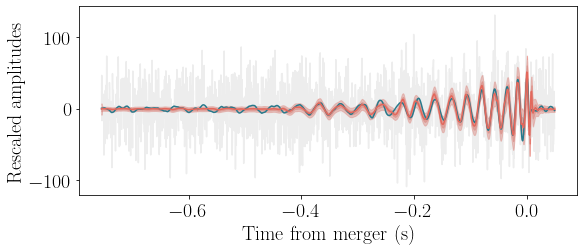

In [44]:
mass1 = f1['injection_parameters']['mass1'][4]
mass2 = f1['injection_parameters']['mass2'][4]
strain = l1_strain_data[4]
snr = l1_snr[4]
ecc = eccentricity[4]
psd = f1['injection_parameters']['psd_noise_l1'][4]
signal = l1_signal[4]
mean_signal = mean_preds[4]*100
lower_90 = lower_bound_90[4]*100
upper_90 = upper_bound_90[4]*100
lower_50 = lower_bound_50[4]*100
upper_50 = upper_bound_50[4]*100

plot_samples(4, signal.astype('float64'), strain.astype('float64'), mean_signal.astype('float64'), psd.astype('float64'), mass1, mass2, snr, ecc, lower_90.astype('float64'), upper_90.astype('float64'),lower_50.astype('float64'), upper_50.astype('float64'), before=0.8, after=0.05)


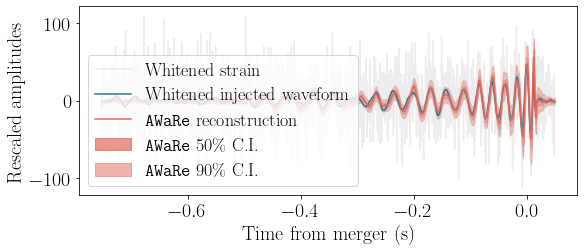

In [48]:
mass1 = f1['injection_parameters']['mass1'][59]
mass2 = f1['injection_parameters']['mass2'][59]
strain = l1_strain_data[59]
snr = l1_snr[59]
ecc = eccentricity[59]
psd = f1['injection_parameters']['psd_noise_l1'][59]
signal = l1_signal[59]
mean_signal = mean_preds[59]*100
lower_90 = lower_bound_90[59]*100
upper_90 = upper_bound_90[59]*100
lower_50 = lower_bound_50[59]*100
upper_50 = upper_bound_50[59]*100

plot_samples(59, signal.astype('float64'), strain.astype('float64'), mean_signal.astype('float64'), psd.astype('float64'), mass1, mass2, snr, ecc, lower_90.astype('float64'), upper_90.astype('float64'),lower_50.astype('float64'), upper_50.astype('float64'), before=0.8, after=0.05)


<ipython-input-40-4df43210f0dd>:13: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=(10,7))


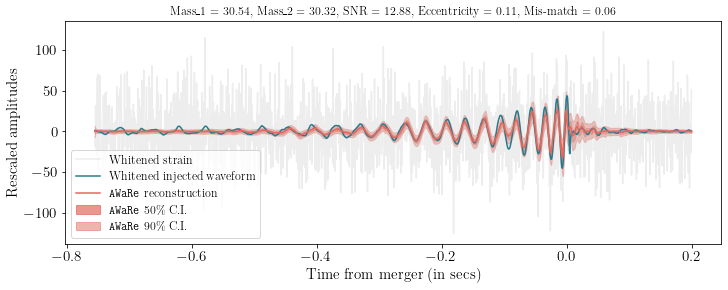

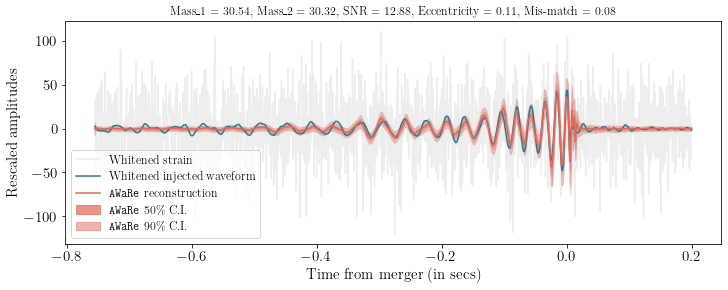

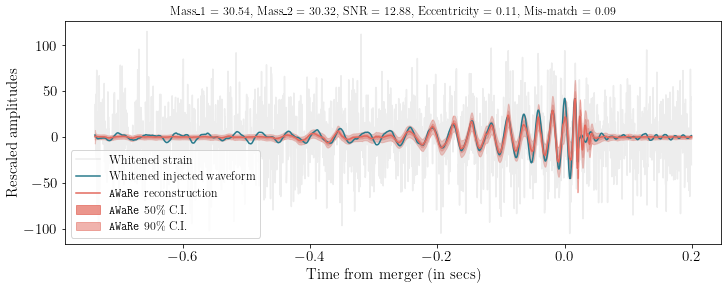

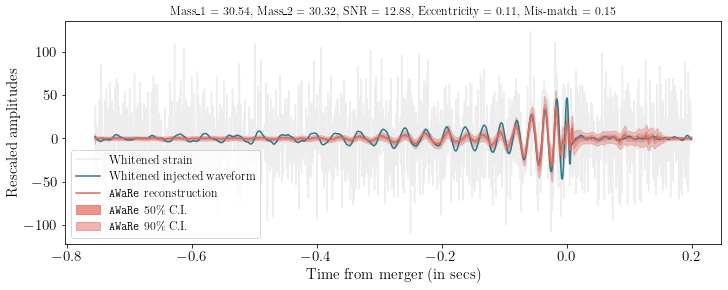

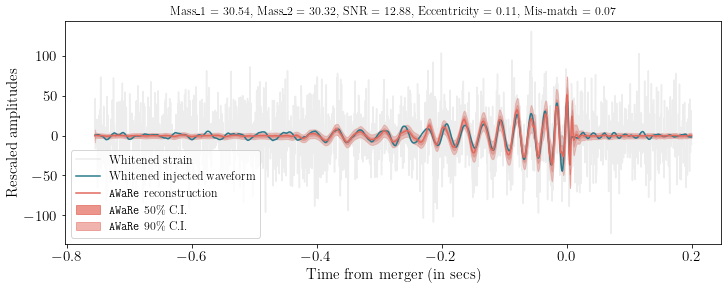

...

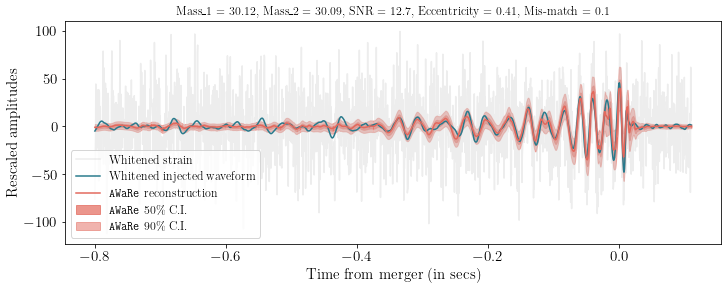

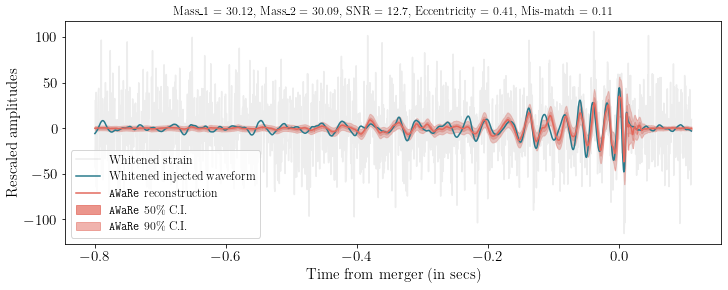

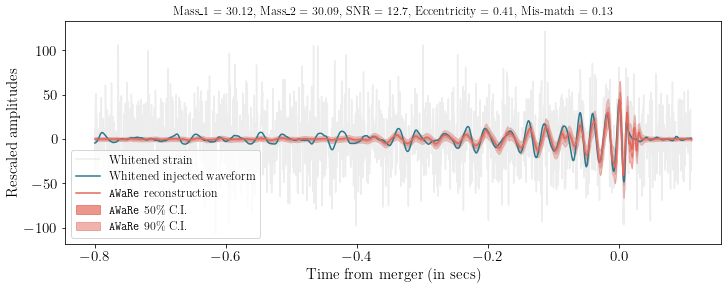

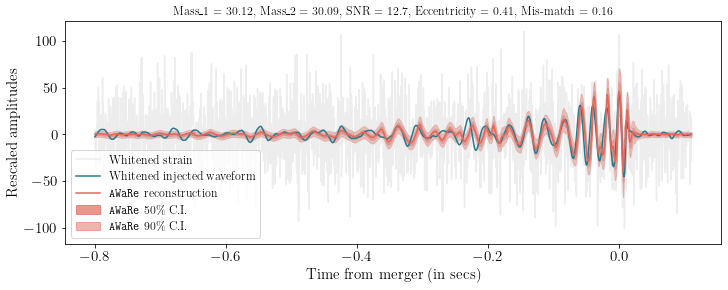

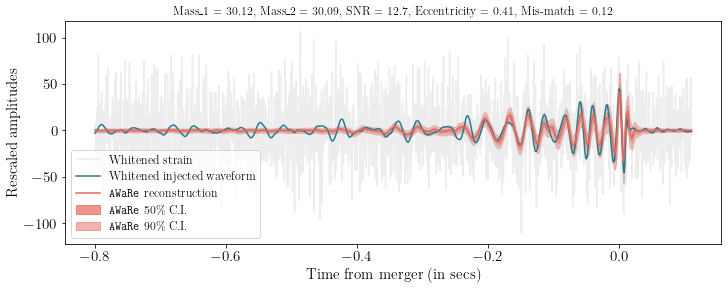

In [41]:
for i in range(0,100):

    mass1 = f1['injection_parameters']['mass1'][i]
    mass2 = f1['injection_parameters']['mass2'][i]
    strain = l1_strain_data[i]
    snr = l1_snr[i]
    ecc = eccentricity[i]
    psd = f1['injection_parameters']['psd_noise_l1'][i]
    signal = l1_signal[i]
    mean_signal = mean_preds[i]*100
    lower_90 = lower_bound_90[i]*100
    upper_90 = upper_bound_90[i]*100
    lower_50 = lower_bound_50[i]*100
    upper_50 = upper_bound_50[i]*100

    plot_samples(i, signal.astype('float64'), strain.astype('float64'), mean_signal.astype('float64'), psd.astype('float64'), mass1, mass2, snr, ecc, lower_90.astype('float64'), upper_90.astype('float64'),lower_50.astype('float64'), upper_50.astype('float64'))


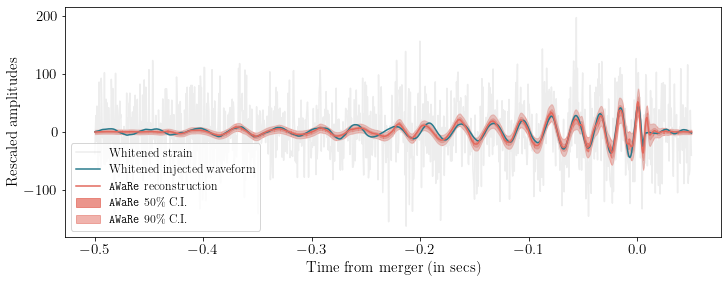

In [56]:
mass1 = f1['injection_parameters']['mass1'][4]
mass2 = f1['injection_parameters']['mass2'][4]
strain_data = l1_strain_data[4]*1.5
snr = l1_snr[4]
ecc = eccentricity[4]
psd = f1['injection_parameters']['psd_noise_l1'][4]
signal = l1_signal[4]
mean_signal = mean_preds[4]*100
lower_90 = lower_bound_90[4]*100
upper_90 = upper_bound_90[4]*100
lower_50 = lower_bound_50[4]*100
upper_50 = upper_bound_50[4]*100

plot_samples(5, signal.astype('float64'), strain_data.astype('float64'), mean_signal.astype('float64'), psd.astype('float64'), mass1, mass2, snr, ecc, lower_90.astype('float64'), upper_90.astype('float64'), lower_50.astype('float64'), upper_50.astype('float64'), before=0.5, after=0.05)

plt.savefig('Paper_plots_uncertainty/Example_plot_SNR-12.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)


In [ ]:
from scipy.signal import welch

def plot_psd(mean_signal, injected_signal, strain, lower_90, upper_90, lower_50, upper_50, fs):
    """ Plot the power spectral density """

    palette_flare = sns.color_palette("flare", n_colors=6)
    palette_rocket = sns.color_palette("rocket", n_colors=6)    
    palette_crest = sns.color_palette("crest", n_colors=6)

    f, Pxx = welch(mean_signal, fs=fs, nperseg=1024)
    f1, Pxx1 = welch(injected_signal, fs=fs, nperseg=1024)
    f2, Pxx2 = welch(strain, fs=fs, nperseg=1024)
    f3, Pxx3 = welch(lower_50, fs=fs, nperseg=1024)
    f4, Pxx4 = welch(upper_50, fs=fs, nperseg=1024)
    f5, Pxx5 = welch(lower_90, fs=fs, nperseg=1024)
    f6, Pxx6 = welch(upper_90, fs=fs, nperseg=1024)

    fig = plt.figure(figsize=(10,7))

    plt.loglog(f, (Pxx), color=palette_flare[1], label='PSD of the reconstructed signal')
    plt.loglog(f1, (Pxx1), color=palette_crest[3], label='PSD of the injected signal')
    plt.loglog(f2, (Pxx2), color='lightgrey', label='PSD of the strain data')
    plt.fill_between(f3, Pxx3, Pxx4, color=palette_flare[1], alpha=0.7, label='50\% C.I.')
    plt.fill_between(f5, Pxx5, Pxx6, color=palette_flare[1], alpha=0.5, label='90\% C.I.')
    plt.xlim(10,1024)
    plt.xlabel('Frequency (Hz)', fontsize=15)
    plt.ylabel('PSD (1/$\sqrt{Hz}$)', fontsize=15)
    plt.grid(False)
    plt.tick_params(axis='y', labelsize=15)
    plt.tick_params(axis='x', labelsize=15)
    plt.legend(fontsize=12)
    plt.savefig('Paper_plots_uncertainty/Example_PSD_SNR-12.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)


In [72]:
plot_psd(mean_signal, signal, strain_data, lower_90, upper_90, lower_50, upper_50, 2048)


RuntimeError: latex was not able to process the following string:
b'PSD (1/$\\\\sqrt{$\\text{Hz}$}$)'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmpz4d6mlx8 42aff5a41f7d466cee725df4d09f60e2.tex

This is pdfTeX, Version 3.14159265-2.6-1.40.21 (TeX Live 2020) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(./42aff5a41f7d466cee725df4d09f60e2.tex
LaTeX2e <2020-10-01> patch level 4
L3 programming layer <2021-02-18>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2020/04/10 v1.4m Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/cm-super/type1ec.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/t1cmr.fd))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/underscore/underscore.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/share/texlive/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
No file 42aff5a41f7d466cee725df4d09f60e2.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing } inserted.
<inserted text> 
                }
l.29 {\rmfamily PSD (1/$\sqrt{$
                               	ext{Hz}$}$)}%
No pages of output.
Transcript written on tmpz4d6mlx8/42aff5a41f7d466cee725df4d09f60e2.log.




Error in callback <function _draw_all_if_interactive at 0x7feae5780d30> (for post_execute):


RuntimeError: latex was not able to process the following string:
b'PSD (1/$\\\\sqrt{$\\text{Hz}$}$)'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmpukugz8sl 42aff5a41f7d466cee725df4d09f60e2.tex

This is pdfTeX, Version 3.14159265-2.6-1.40.21 (TeX Live 2020) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(./42aff5a41f7d466cee725df4d09f60e2.tex
LaTeX2e <2020-10-01> patch level 4
L3 programming layer <2021-02-18>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2020/04/10 v1.4m Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/cm-super/type1ec.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/t1cmr.fd))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/underscore/underscore.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/share/texlive/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
No file 42aff5a41f7d466cee725df4d09f60e2.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing } inserted.
<inserted text> 
                }
l.29 {\rmfamily PSD (1/$\sqrt{$
                               	ext{Hz}$}$)}%
No pages of output.
Transcript written on tmpukugz8sl/42aff5a41f7d466cee725df4d09f60e2.log.




RuntimeError: latex was not able to process the following string:
b'PSD (1/$\\\\sqrt{$\\text{Hz}$}$)'

Here is the full command invocation and its output:

latex -interaction=nonstopmode --halt-on-error --output-directory=tmpxx5_ctz8 42aff5a41f7d466cee725df4d09f60e2.tex

This is pdfTeX, Version 3.14159265-2.6-1.40.21 (TeX Live 2020) (preloaded format=latex)
 restricted \write18 enabled.
entering extended mode
(./42aff5a41f7d466cee725df4d09f60e2.tex
LaTeX2e <2020-10-01> patch level 4
L3 programming layer <2021-02-18>
(/usr/share/texlive/texmf-dist/tex/latex/base/article.cls
Document Class: article 2020/04/10 v1.4m Standard LaTeX document class
(/usr/share/texlive/texmf-dist/tex/latex/base/size10.clo))
(/usr/share/texlive/texmf-dist/tex/latex/type1cm/type1cm.sty)
(/usr/share/texlive/texmf-dist/tex/latex/cm-super/type1ec.sty
(/usr/share/texlive/texmf-dist/tex/latex/base/t1cmr.fd))
(/usr/share/texlive/texmf-dist/tex/latex/base/inputenc.sty)
(/usr/share/texlive/texmf-dist/tex/latex/geometry/geometry.sty
(/usr/share/texlive/texmf-dist/tex/latex/graphics/keyval.sty)
(/usr/share/texlive/texmf-dist/tex/generic/iftex/ifvtex.sty
(/usr/share/texlive/texmf-dist/tex/generic/iftex/iftex.sty)))
(/usr/share/texlive/texmf-dist/tex/latex/underscore/underscore.sty)
(/usr/share/texlive/texmf-dist/tex/latex/base/textcomp.sty)
(/usr/share/texlive/texmf-dist/tex/latex/l3backend/l3backend-dvips.def)
No file 42aff5a41f7d466cee725df4d09f60e2.aux.
*geometry* driver: auto-detecting
*geometry* detected driver: dvips
! Missing } inserted.
<inserted text> 
                }
l.29 {\rmfamily PSD (1/$\sqrt{$
                               	ext{Hz}$}$)}%
No pages of output.
Transcript written on tmpxx5_ctz8/42aff5a41f7d466cee725df4d09f60e2.log.




<Figure size 720x504 with 1 Axes>

In [49]:
import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)
from pycbc.filter import match, overlap
from pycbc.types.timeseries import TimeSeries, FrequencySeries

def get_mismatch(signal, mean_signal, psd):

    time_buffer = 1
    sample_rate = 2048
    # Length of corresponding time series and frequency series
    tlen = int(sample_rate * time_buffer)
    flen = tlen // 2 + 1

    delta_f = 1.0 / time_buffer
    #    psd = aLIGOZeroDetHighPower(flen, delta_f, f_low)
    
    #    X_test_pure_cwb_ts = TimeSeries(pure_signals_cwb.squeeze(), delta_t = 1.0/1024)
    l1_signal_ts = TimeSeries(signal, delta_t = 1.0/2048)
    mean_signal_ts = TimeSeries(mean_signal, delta_t = 1.0/2048)
    psd = FrequencySeries(psd, delta_f=delta_f)

    #    X_test_pure_cwb_ts.resize(tlen)
    l1_signal_ts.resize(tlen)
    mean_signal_ts.resize(tlen)
    psd.resize(flen)

    mis_match = 1.0 - Overlap_calc(l1_signal_ts,mean_signal_ts,psd)

    return mis_match


In [50]:
mismatch = []

for i in range(1000):

    mass1 = f1['injection_parameters']['mass1'][i]
    mass2 = f1['injection_parameters']['mass2'][i]
    snr = l1_snr[i]
    psd = f1['injection_parameters']['psd_noise_l1'][i]
    signal = l1_signal[i]
    mean_signal = mean_preds[i]*100
    lower = lower_bound_90[i]*100
    upper = upper_bound_90[i]*100

    mismatch.append(get_mismatch(signal.astype('float64'), mean_signal.astype('float64'), psd.astype('float64')))


In [51]:
mismatch = np.array(mismatch)
mismatch = mismatch.reshape(100,10)

ecc_mean = eccentricity.reshape(100,10).mean(axis=1)

mean_mismatch = mismatch.mean(axis=1)
std_mismatch = mismatch.std(axis=1)

In [52]:
import csv

filename = '/fred/oz016/Chayan/GW-Denoiser/notebooks/Paper_plots_uncertainty/Eccentricity_test_SNR-12_mass-30/Eccentricity_mismatch_data_SNR-12_mass-30.csv'

# Writing the data into the file
with open(filename, 'w', newline='') as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(['Eccentricity', 'Mean Mismatch', 'STD'])  # Writing the header
    for c1, c2, c3 in zip(ecc_mean, mean_mismatch, std_mismatch):
        csvwriter.writerow([c1,c2,c3])  # Writing data rows



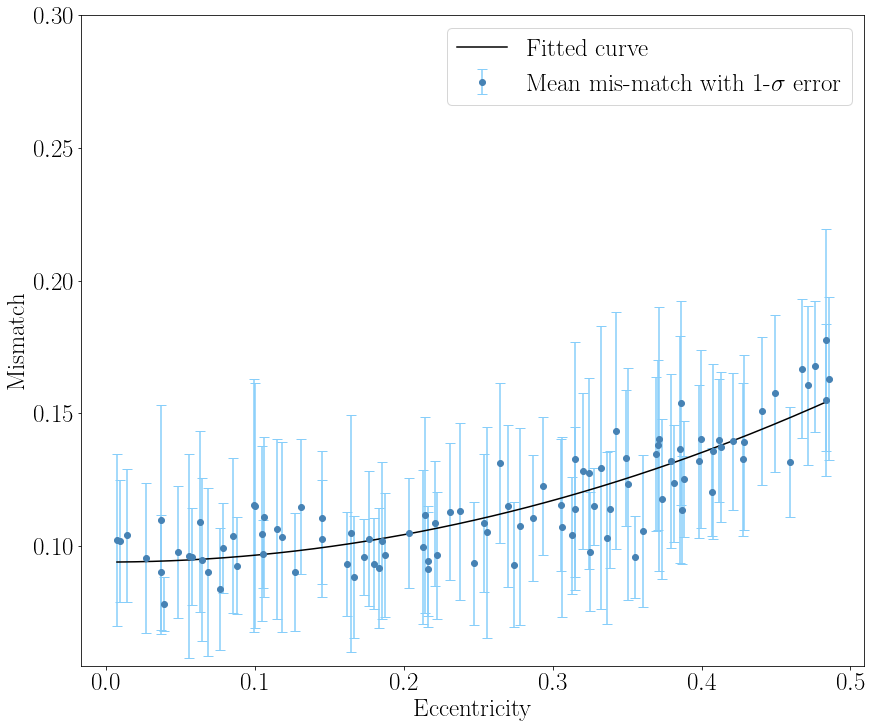

In [54]:
import pandas as pd
import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)
# Create a figure with GridSpec layout
#fig = plt.figure(figsize=(8, 7))
#gs = gridspec.GridSpec(2, 2, width_ratios=[5, 1], height_ratios=[1, 5], hspace=0.05, wspace=0.05)
# Define the color palettes
#palette_flare = sns.color_palette("flare", n_colors=5)
#palette_crest = sns.color_palette("crest", n_colors=5)

# Main scatter plot
fig, ax = plt.subplots(figsize=(12, 10))
#cmap = sns.color_palette("flare", as_cmap=True)

# Load the data
file_path = '/fred/oz016/Chayan/GW-Denoiser/notebooks/Paper_plots_uncertainty/Eccentricity_test_SNR-12_mass-30/Eccentricity_mismatch_data_SNR-12_mass-30.csv'
data = pd.read_csv(file_path)

# Extract the SNR, mean mismatch, and the standard deviation of mismatch
eccentricity = data.iloc[:,0].values
mean_mismatch = data.iloc[:,1].values
std_dev_mismatch = data.iloc[:,2].values

# Define the model: let's start with an exponential decay function
def model(x, a, c):
    return a * x**2 + c

# Fit the curve
params, covariance = curve_fit(model, eccentricity, mean_mismatch)

# Generate a sequence of SNR values for plotting the fitted curve
ecc_fit = np.linspace(min(eccentricity), max(eccentricity), 200)
fitted_curve = model(ecc_fit, *params)

# Create a simple error bar plot
#plt.fill_between(l1_snr_mean, lower_std, upper_std, color='gray', alpha=0.2)
ax.errorbar(eccentricity, mean_mismatch, yerr=std_dev_mismatch, color='steelblue', fmt='o', capsize=5, capthick=1, ecolor='lightskyblue', label='Mean mis-match with 1-$\sigma$ error')
plt.plot(ecc_fit, fitted_curve, label='Fitted curve', color='black')
#ax.errorbar(l1_snr_mean, mean_mismatch, yerr=std_mismatch, fmt='o', color='lightblue', ecolor='lightgray', elinewidth=3, capsize=0)
#plt.title('Error Bar Plot')
ax.set_ylabel('Mismatch', fontsize=25)
ax.set_xlabel('Eccentricity', fontsize=25)
ax.tick_params(axis='both', labelsize=25)
plt.ylim(0.055,0.3)
plt.legend(fontsize=25)
plt.savefig('Paper_plots_uncertainty/Eccentricity_test_SNR-12_mass-30/Eccentricity_convergence_mismatch_SNR-12_mass-30.svg', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)

#plt.xlabel('SNR')
#plt.ylabel('Mismatch')
#plt.grid(True)


# Plot the data and the fitted curve
#plt.figure(figsize=(10, 6))
#plt.errorbar(SNR, mean_mismatch, yerr=std_dev_mismatch, fmt='o', label='Data with standard deviation')
#plt.plot(SNR_fit, fitted_curve, label='Fitted curve', color='red')
#plt.xlabel('Injected SNR')
#plt.ylabel('Mismatch')
#plt.title('Curve Fitting: Mismatch vs. Injected SNR')
#plt.legend()
#plt.show()


# DeepClean test

In [19]:
import h5py
from matplotlib import pyplot as plt

f1 = h5py.File('/fred/oz016/Chayan/samplegen_old/output/O3b_test_IMRPhenomXPHM_DC_test.hdf', 'r')

strain = f1['injection_samples']['l1_strain'][()]
signal = f1['injection_parameters']['l1_signal_whitened'][()]

strain, maximum, minimum = _preprocess_data(strain, strain.shape[0], 2048)
strain = np.array(strain)
strain.shape


(1000, 2048)

In [20]:
X_test_strain = reshape_sequences(strain.shape[0], strain)
X_test_pure_signal = reshape_sequences(signal.shape[0], signal)


In [21]:
# Reshape arrays to fit into Keras model
X_test_strain = X_test_strain[:,:,:,None]
print('x_test_strain shape:', X_test_strain.shape)
X_test_strain = X_test_strain.astype("float32")

X_test_pure_signal = X_test_pure_signal[:,:,:,None]
print('x_test_pure_signal shape:', X_test_pure_signal.shape)
X_test_pure_signal = X_test_pure_signal.astype("float32")


x_test_strain shape: (1000, 2058, 10, 1)
x_test_pure_signal shape: (1000, 2058, 10, 1)


In [22]:
import tensorflow_probability as tfp

negloglik = NegativeLogLikelihood()

model = tf.keras.models.load_model('/fred/oz016/Chayan/GW-Denoiser/model/model_IMRPhenomXPHM_O3b_noise_15_timesteps_uncertainty_amplitudes_scaled_100.h5', custom_objects={'TimeDistributedMultiHeadAttention': TimeDistributedMultiHeadAttention, 'IndependentNormal': tfp.layers.IndependentNormal,'negloglik': negloglik})

#model = tf.keras.models.load_model('/fred/oz016/Chayan/GW-Denoiser/model/model_IMRPhenomXPHM_DeepClean_10_timesteps_uncertainty_amplitudes_scaled_100_1.h5', custom_objects={'TimeDistributedMultiHeadAttention': TimeDistributedMultiHeadAttention, 'IndependentNormal': tfp.layers.IndependentNormal,'negloglik': negloglik})


In [23]:
distribution = model(X_test_strain[0:10])
    
# Extract mean and standard deviation from the distribution
mean_preds = distribution.mean()
std_preds = distribution.stddev()
 
mean_preds = mean_preds.numpy().squeeze()
std_preds = std_preds.numpy().squeeze()

# Calculate the upper and lower bounds of the 2-standard deviation interval
lower_bound = mean_preds - 1.645 * std_preds
upper_bound = mean_preds + 1.645 * std_preds

In [24]:
mean_preds = mean_preds[:,0:2048]

lower_bound = lower_bound[:,0:2048]
upper_bound = upper_bound[:,0:2048]

In [36]:
# DeepClean trained model results

f1 = h5py.File('/fred/oz016/Chayan/GW-Denoiser/notebooks/results_IMRPhenomXPHM_DeepClean_uncertainty_amplitudes_scaled_100_1.hdf', 'r')

mean = f1['mean_signals'][()]
m2sd = f1['m2sd_signals'][()]
p2sd = f1['p2sd_signals'][()]

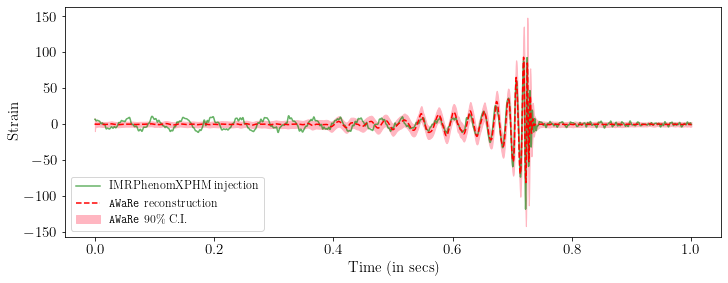

In [28]:
import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)

fig = plt.figure(figsize=(10,7))
    
# Plot for decoded signals and pure_signals_cwb
signal_axes = fig.add_subplot(211)

time = np.linspace(0.0, 1.0, mean_preds.shape[1])

#signal_axes.plot(time, l1_strain_IMRPhenomXPHM[0], label='Whitened strain', color='lightblue', alpha=0.5)
signal_axes.plot(time, signal[2], label='IMRPhenomXPHM injection', color='green', alpha=0.6)
signal_axes.plot(time, mean_preds[2]*100.0, label='\\texttt{AWaRe} reconstruction', color='red', linestyle='dashed')
#plt.plot(time, mean_preds[1], label='\\texttt{AWaRe} SEOBNRv4PHM', color='red')
#plt.plot(time, mean_preds[2], label='\\texttt{AWaRe} NRHybSur3dq8', color='red')

signal_axes.fill_between(time,lower_bound[2]*100.0,upper_bound[2]*100.0, color='lightpink', label='\\texttt{AWaRe} 90\% C.I.')
    
signal_axes.set_ylabel('Strain', fontsize=15)
signal_axes.set_xlabel('Time (in secs)', fontsize=15)
signal_axes.tick_params(axis='y', labelsize=15)
signal_axes.tick_params(axis='x', labelsize=15)
signal_axes.legend(loc='lower left', fontsize=12)

#plt.savefig('Paper_plots_uncertainty/Test_O3b_injection_in_DeepClean_trained_model_IMRPhenomXPHM.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)


In [38]:
std_preds = (mean - m2sd)/2.0 


In [39]:
lower_bound_DC = mean - 1.645 * std_preds
upper_bound_DC = mean + 1.645 * std_preds

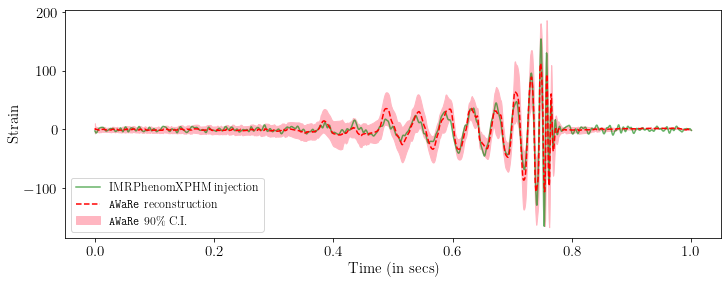

In [42]:
import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)

fig = plt.figure(figsize=(10,7))
    
# Plot for decoded signals and pure_signals_cwb
signal_axes = fig.add_subplot(211)

time = np.linspace(0.0, 1.0, mean_preds.shape[1])

#signal_axes.plot(time, l1_strain_IMRPhenomXPHM[0], label='Whitened strain', color='lightblue', alpha=0.5)
signal_axes.plot(time, signal[0], label='IMRPhenomXPHM injection', color='green', alpha=0.6)
signal_axes.plot(time, mean[0][0:2048]*100.0, label='\\texttt{AWaRe} reconstruction', color='red', linestyle='dashed')
#plt.plot(time, mean_preds[1], label='\\texttt{AWaRe} SEOBNRv4PHM', color='red')
#plt.plot(time, mean_preds[2], label='\\texttt{AWaRe} NRHybSur3dq8', color='red')

signal_axes.fill_between(time,lower_bound_DC[0][0:2048]*100.0,upper_bound_DC[0][0:2048]*100.0, color='lightpink', label='\\texttt{AWaRe} 90\% C.I.')
    
signal_axes.set_ylabel('Strain', fontsize=15)
signal_axes.set_xlabel('Time (in secs)', fontsize=15)
signal_axes.tick_params(axis='y', labelsize=15)
signal_axes.tick_params(axis='x', labelsize=15)
signal_axes.legend(loc='lower left', fontsize=12)

plt.savefig('Paper_plots_uncertainty/Test_DeepClean_trained_IMRPhenomXPHM.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)


In [1]:
import h5py

f1 = h5py.File('/fred/oz016/Chayan/GW-Denoiser/notebooks/results_GW190521_params_test_original_vs_DC.hdf', 'r')

mean = f1['mean_signals'][()]
m2sd = f1['m2sd_signals'][()]
p2sd = f1['p2sd_signals'][()]

#f2 = h5py.File('/workspace/chayan_ligo/BBH_sample_files/O3b_IMBH_test_NRSur7dq4_signal_noise_SNR-8to30.hdf', 'r')
f2 = h5py.File('/fred/oz016/Chayan/samplegen_old/output/Original_data_GW190521_params_test.hdf', 'r')
f3 = h5py.File('/fred/oz016/Chayan/samplegen_old/output/DeepClean_data_GW190521_params_test.hdf', 'r')

pure_signals = f2['injection_parameters']['l1_signal_whitened'][()]
noise_signals = f2['noise_parameters']['l1_signal'][()]

pure_signals_DC = f3['injection_parameters']['l1_signal_whitened'][()]
noise_signals_DC = f3['noise_parameters']['l1_signal'][()]


In [2]:
pure_signals.shape

(1000, 2048)

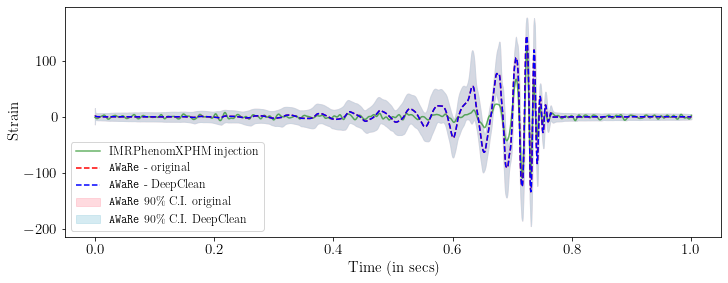

In [6]:
import matplotlib_latex_bridge as mlb
mlb.setup_page(**mlb.formats.article_letterpaper_10pt_singlecolumn)

from matplotlib import pyplot as plt
import numpy as np

fig = plt.figure(figsize=(10,7))
    
# Plot for decoded signals and pure_signals_cwb
signal_axes = fig.add_subplot(211)

time = np.linspace(0.0, 1.0, 2048)

#signal_axes.plot(time, l1_strain_IMRPhenomXPHM[0], label='Whitened strain', color='lightblue', alpha=0.5)
signal_axes.plot(time, pure_signals[1], label='IMRPhenomXPHM injection', color='green', alpha=0.6)
signal_axes.plot(time, mean[1][0:2048]*100.0, label='\\texttt{AWaRe} - original', color='red', linestyle='dashed')
signal_axes.plot(time, mean[1001][0:2048]*100.0, label='\\texttt{AWaRe} - DeepClean', color='blue', linestyle='dashed')
#plt.plot(time, mean_preds[1], label='\\texttt{AWaRe} SEOBNRv4PHM', color='red')
#plt.plot(time, mean_preds[2], label='\\texttt{AWaRe} NRHybSur3dq8', color='red')

signal_axes.fill_between(time,m2sd[1][0:2048]*100.0,p2sd[1][0:2048]*100.0, color='lightpink', label='\\texttt{AWaRe} 90\% C.I. original', alpha=0.5)
signal_axes.fill_between(time,m2sd[1001][0:2048]*100.0,p2sd[1001][0:2048]*100.0, color='lightblue', label='\\texttt{AWaRe} 90\% C.I. DeepClean', alpha=0.5)

signal_axes.set_ylabel('Strain', fontsize=15)
signal_axes.set_xlabel('Time (in secs)', fontsize=15)
signal_axes.tick_params(axis='y', labelsize=15)
signal_axes.tick_params(axis='x', labelsize=15)
signal_axes.legend(loc='lower left', fontsize=12)

#plt.savefig('Paper_plots_uncertainty/Test_DeepClean_trained_IMRPhenomXPHM.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)


In [10]:
original = f2['injection_samples']['l1_strain'][0:1000]

In [11]:
dc = f3['injection_samples']['l1_strain'][0:1000]

In [13]:
np.where((original - dc) != 0.0) 

(array([], dtype=int64), array([], dtype=int64))

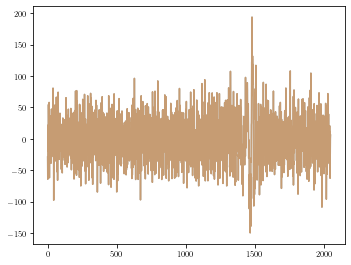

In [9]:
plt.plot(f2['injection_samples']['l1_strain'][1], alpha=0.5)
plt.plot(f3['injection_samples']['l1_strain'][1], alpha=0.5)

In [32]:
f2.close()
f3.close()

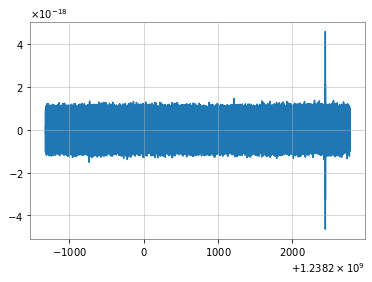

In [3]:
from gwpy.timeseries import TimeSeries

f1 = h5py.File('/fred/oz016/Chayan/samplegen_old/Original_data_test/original-1238198678-4096.h5', 'r')

data = TimeSeries.read('/fred/oz016/Chayan/samplegen_old/Deep_Clean_data_test/H-H1_HOFT_DC-1238198678-4096.gwf', 'H1:GDS-CALIB_STRAIN_DC')

#plt.plot(f1['H1:GDS-CALIB_STRAIN'][()])
plt.plot(data.times.value, data)


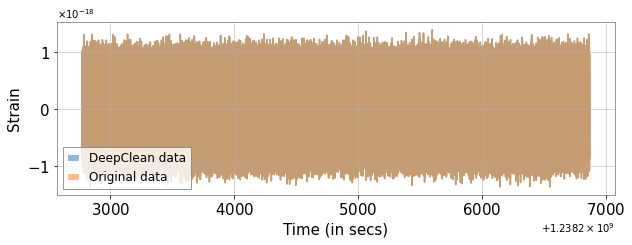

In [5]:
from gwpy.timeseries import TimeSeries
import h5py
from matplotlib import pyplot as plt

f1 = h5py.File('/fred/oz016/Chayan/samplegen_old/Original_data_test/original-1238202774-4096.h5', 'r')

data_DC = TimeSeries.read('/fred/oz016/Chayan/samplegen_old/Deep_Clean_data_test/H-H1_HOFT_DC-1238202774-4096.gwf', 
                       'H1:GDS-CALIB_STRAIN_DC')

data_original = f1['H1:GDS-CALIB_STRAIN'][()]

fig = plt.figure(figsize=(10,7))
ax = fig.add_subplot(211)

ax.plot(data_DC.times.value, data_DC, alpha=0.5, label='DeepClean data')
ax.plot(data_DC.times.value, data_original, alpha=0.5, label='Original data')

ax.set_ylabel('Strain', fontsize=15)
ax.set_xlabel('Time (in secs)', fontsize=15)
ax.tick_params(axis='y', labelsize=15)
ax.tick_params(axis='x', labelsize=15)
ax.legend(loc='lower left', fontsize=12)

#plt.savefig('/fred/oz016/Chayan/samplegen_old/DeepClean_vs_original_data.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)


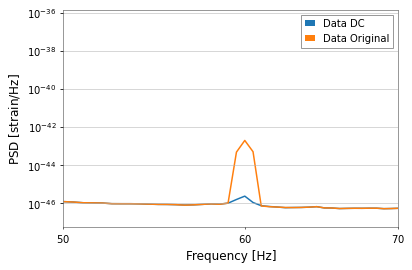

In [7]:
# Compute the PSD

data_original =  TimeSeries(data_original, dt=1/4096.0, t0=data_DC.times[0].value)

# Compute the PSDs
psd_DC = data_DC.psd(fftlength=2)
psd_original = data_original.psd(fftlength=2)

# Plot the PSDs using matplotlib
fig, ax = plt.subplots()
ax.plot(psd_DC.frequencies.value, psd_DC.value, label='Data DC')
ax.plot(psd_original.frequencies.value, psd_original.value, label='Data Original')

# Set log-log scale
ax.set_xscale('log')
ax.set_yscale('log')

# Customize the plot
ax.set_ylabel(r'PSD [strain/${\mathrm{Hz}}$]')
ax.set_xlabel('Frequency [Hz]')
ax.legend()
ax.set_xlim(50, 70)
# ax.set_ylim(1e-23, 1e-19)

# Save the figure
fig.savefig('psd_comparison_60Hz.png', bbox_inches="tight", facecolor='w', transparent=False, dpi=400)

# Show the plot
plt.show()

In [14]:
data_DC.times[0].value

1238202774.0

In [53]:
data.value

array([-1.93118135e-19, -1.81609585e-19, -1.81718428e-19, ...,
       -2.08875044e-19, -2.17432148e-19, -2.22185978e-19])

In [54]:
f1['H1:GDS-CALIB_STRAIN'][()]

array([-1.93118135e-19, -1.81609585e-19, -1.81718427e-19, ...,
       -2.08875044e-19, -2.17432148e-19, -2.22185978e-19])

In [1]:
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u

# Define the cosmology
cosmo = FlatLambdaCDM(H0=67.4 * u.km / u.s / u.Mpc, Om0=0.315)

# Define the redshift
z = 1.0

# Compute the comoving volume
comoving_volume = cosmo.comoving_volume(z)

# Print the result
print(f"Comoving volume at redshift {z}: {comoving_volume}")

Comoving volume at redshift 1.0: 164819738885.85587 Mpc3


In [3]:
import h5py
import numpy as np

f1 = h5py.File('/fred/oz016/Chayan/samplegen_old/GW190517_noise/H1/H-H1_GWOSC_O3a_4KHZ_R1-1242107904-4096.hdf5', 'r')

f1['meta']['GPSstart'][()]

1242107904

In [4]:
f1['meta']['GPSstart'][()]+4096


1242112000

In [10]:
f1['strain']['Strain'][()]

array([ 2.63613806e-20,  3.07764871e-20,  1.14415024e-20, ...,
       -4.20998605e-20, -4.83273822e-20, -5.34197023e-20])

In [15]:
f1['meta']['Duration'][()]

4096

In [ ]:
1243541504+4096

1242566656